# <font color="gray">[MBA em Ciência de Dados](https://cemeai.icmc.usp.br/MBA/) - Turma 2023</font>

## <font color="gray">Trabalho de Conclusão de Curso - TCC</font>

### [***Agrupamento de municípios paulistas por densidade territorial urbana***](https://github.com/icn-sousa/TCC_MBA_CD/tree/main)

> Discente: **[Isabel Cristina Nunes de Sousa](https://icn-sousa.github.io/)**<br>
> Orientador: **[Wallace Correa de Oliveira Casaca](https://sites.google.com/site/wallacecoc)**

**[CeMEAI](https://cemeai.icmc.usp.br/) - [ICMC/USP](https://www.icmc.usp.br/)**
---

In [1]:
# Descomente a linha abaixo caso esteja usando no Google Colab
# !pip install rasterio esda kneed scikit-learn-extra session_info

In [2]:
import math
import numpy as np
import pandas as pd

from scipy.stats import pearsonr
from scipy.optimize import curve_fit

import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from matplotlib import cm
import seaborn as sns

import pyproj
import rasterio
import shapely
import geopandas as gpd
import esda
import libpysal

from rasterio import features
from shapely.ops import unary_union
from geopandas.tools import overlay
from esda.moran import Moran
from libpysal import weights

from kneed import KneeLocator
from yellowbrick.cluster import SilhouetteVisualizer

from sklearn.preprocessing import maxabs_scale
from sklearn.cluster import KMeans, MeanShift, AffinityPropagation
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score, accuracy_score, precision_score, recall_score, f1_score

import os
import session_info
from functools import reduce

session_info.show()

## Parte I

In [3]:
# Define as configurações globais dos gráficos
sns.set(style='whitegrid')

### Funções

Funções usadas na Parte I deste *notebook*.

In [4]:
def excel_to_df(table):

  """Read the Excel file into a pandas DataFrame."""

  df = pd.read_excel(table, skiprows=[0,1,2], index_col=0)

  return df

In [5]:
def df_info(df):

  """Print the column labels and dimensionality of the DataFrame."""

  columns = df.columns.tolist()
  print('DataFrame columns:\n')

  for col in columns:
    print(col)

  print(f'\nNumber of rows: {df.shape[0]}\n')

In [6]:
def best_dtypes(df):

  """Convert columns to the best possible dtypes."""

  print('Original dtypes:')
  print(df.dtypes)

  df_converted = df.convert_dtypes()

  print('\nNew dtypes:')
  print(df_converted.dtypes)

  return df_converted

In [7]:
def pop_filter(df):

  """Filter the DataFrame for the specified population
  range (between 100 and 500 thousand inhabitants).
  """

  lower_bound = 100000
  upper_bound = 500000

  filtered_df = df[
      (df['População residente (Pessoas)'] >= lower_bound) &
       (df['População residente (Pessoas)'] < upper_bound)
       ]

  return filtered_df

In [8]:
def gdf_info(gdf):

  """Print informations about the GeoDataFrames."""

  dimensionality = gdf.shape
  data_type = type(gdf)
  CRS = gdf.crs

  print(f'Dimensionality: {dimensionality}, \nType: {data_type}, \nCoordinate Reference System (CRS): {CRS}')

In [9]:
def upper_list_comprehension(list_of_cities):

  """
  Convert a list of cities to uppercase.

  Args:
    list_of_cities: A list of city names.

  Returns:
    list: A new list containing the city names converted to uppercase.
  """

  return [city.upper() for city in list_of_cities]

In [10]:
# Adapted from: https://py.geocompx.org/06-raster-vector#raster-to-polygons

def raster_to_gdf(raster_filepath, target_value):

    """
    Converts a raster file to a GeoDataFrame containing geometries and values.

    Parameters:
    - raster_filepath (str): The file path to the raster image.
    - target_value (int): The value you want to filter for in the raster.

    Returns:
    - gdf_year (GeoDataFrame): A GeoDataFrame containing 'value' and 'geometry'
      columns, where 'value' corresponds to raster values and 'geometry'
      represents geometries extracted from the raster.

    Dependencies:
    - rasterio: For reading and processing raster data.
    - geopandas (imported as gpd): For creating the GeoDataFrame.
    - shapely.geometry: For working with geometries.

    Note:
    - The GeoDataFrame's CRS (Coordinate Reference System) is set to match the
      CRS of the original raster.
    """

    # Open the raster file
    with rasterio.open(raster_filepath) as raster:

        # Read the shapes directly from the raster
        shapes = list(features.shapes(raster.read(),
                                      transform=raster.transform))

        # Initialize lists to store geometries and values
        geometries = []
        values = []

        for shape, value in shapes:
            if value == target_value:
                
                # Only add the geometry and value if it matches the target
                geometries.append(shapely.geometry.shape(shape))
                values.append(value)

        # Create a GeoDataFrame from the extracted data
        gdf = gpd.GeoDataFrame({'id': values, 'geometry': geometries},
                               crs=raster.crs)

    return gdf

In [11]:
# Source: https://stackoverflow.com/a/40140326/4556479

def wgs_to_utm(lon, lat):

  """Get the EPSG (UTM) from geographic coordinates."""

  utm_band = str((math.floor((lon + 180) / 6) % 60) + 1)

  if len(utm_band) == 1:
    utm_band = '0'+utm_band

  if lat >= 0:
    epsg_code = '326' + utm_band

  else:
    epsg_code = '327' + utm_band

  return epsg_code

In [12]:
def split_by_epsg(df):

  """Split a GeoDataFrame by EPSG."""

  grouped = df.groupby('epsg')

  epsg_esq = grouped.get_group('32722')
  epsg_dir = grouped.get_group('32723')

  # UTM 22 e 23 Sul, respectively
  return (epsg_esq, epsg_dir)

### Tabelas do Censo 2022 IBGE

Nesta seção são carregadas duas tabelas do Censo mais recente do IBGE:

- População residente, Área territorial e Densidade demográfica - 2022
- População residente e Taxa média geométrica de crescimento anual - 2022

**Fonte:** https://www.ibge.gov.br/estatisticas/sociais/trabalho/22827-censo-demografico-2022.html?edicao=37225&t=resultados

In [13]:
# URLs onde estão armazenadas as planilhas eletrônicas
url_pop_area_density = 'https://github.com/icn-sousa/TCC_MBA_CD/raw/b2d1acff80b86669f54774123dd8f4838c07dbb4/dados/tabela_2_1_SP.xlsx'
url_pop_tgca = 'https://github.com/icn-sousa/TCC_MBA_CD/raw/b2d1acff80b86669f54774123dd8f4838c07dbb4/dados/tabela_2_2_SP.xlsx'

# Carrega os dados e converte em DataFrames
pop_area_density_2022 = excel_to_df(table=url_pop_area_density)
pop_tgca_2022 = excel_to_df(table=url_pop_tgca)

In [14]:
# Exibe informações básicas sobre o DataFrame de densidade populacional
df_info(pop_area_density_2022)

DataFrame columns:

População residente (Pessoas)
Área da unidade territorial (Quilômetros quadrados)
Densidade demográfica (Habitante por quilômetro quadrado)

Number of rows: 647



In [15]:
# Exibe informações básicas sobre o DataFrame da taxa de crescimento geométrico
df_info(pop_tgca_2022)

DataFrame columns:

População residente (Pessoas)
Variação absoluta da população residente 2010 compatibilizada (Pessoas)
Taxa de crescimento geométrico (%)

Number of rows: 647



In [16]:
# Seleciona os melhores data types
print('Population Density DataFrame')
pop_area_density_2022_dt = best_dtypes(df=pop_area_density_2022)

print()

print('Geometric Growth Rate DataFrame')
pop_tgca_2022_dt = best_dtypes(df=pop_tgca_2022)

Population Density DataFrame
Original dtypes:
População residente (Pessoas)                                float64
Área da unidade territorial (Quilômetros quadrados)          float64
Densidade demográfica (Habitante por quilômetro quadrado)    float64
dtype: object

New dtypes:
População residente (Pessoas)                                  Int64
Área da unidade territorial (Quilômetros quadrados)            Int64
Densidade demográfica (Habitante por quilômetro quadrado)    Float64
dtype: object

Geometric Growth Rate DataFrame
Original dtypes:
População residente (Pessoas)                                              float64
Variação absoluta da população residente 2010 compatibilizada (Pessoas)    float64
Taxa de crescimento geométrico (%)                                         float64
dtype: object

New dtypes:
População residente (Pessoas)                                                Int64
Variação absoluta da população residente 2010 compatibilizada (Pessoas)      Int64
Taxa de

In [17]:
# Primeiras linhas do DataFrame de densidade populacional
pop_area_density_2022_dt.head()

,População residente (Pessoas),Área da unidade territorial (Quilômetros quadrados),Densidade demográfica (Habitante por quilômetro quadrado)
São Paulo,44420459,248219,178.96
Adamantina (SP),34687,412,84.19
Adolfo (SP),4351,211,20.62
Aguaí (SP),32072,475,67.58
Águas da Prata (SP),7369,143,51.65


In [18]:
# Primeiras linhas do DataFrame da taxa de crescimento geométrico
pop_tgca_2022_dt.head()

,População residente (Pessoas),Variação absoluta da população residente 2010 compatibilizada (Pessoas),Taxa de crescimento geométrico (%)
São Paulo,44420459,3158260,0.62
Adamantina (SP),34687,890,0.22
Adolfo (SP),4351,794,1.69
Aguaí (SP),32072,-76,-0.02
Águas da Prata (SP),7369,-215,-0.24


In [19]:
# Filtra por população entre 100 e 500 mil habitantes
filtered_pop_area_density_2022_dt = pop_filter(df=pop_area_density_2022_dt)
filtered_pop_tgca_2022_dt = pop_filter(df=pop_tgca_2022_dt)

print(f'Shape of the Population Density DataFrame: {filtered_pop_area_density_2022_dt.shape}')
print(f'Shape of the Geometric Growth Rate DataFrame: {filtered_pop_tgca_2022_dt.shape}')

Shape of the Population Density DataFrame: (69, 3)
Shape of the Geometric Growth Rate DataFrame: (69, 3)


In [20]:
# Primeiras linhas do DataFrame de densidade populacional filtrado
filtered_pop_area_density_2022_dt.head()

,População residente (Pessoas),Área da unidade territorial (Quilômetros quadrados),Densidade demográfica (Habitante por quilômetro quadrado)
Americana (SP),237247,134,1771.66
Araçatuba (SP),200124,1167,171.47
Araraquara (SP),242228,1004,241.35
Araras (SP),130866,645,202.95
Assis (SP),101409,461,220.16


In [21]:
# Primeiras linhas do DataFrame de taxa de crescimento geométrico filtrado
filtered_pop_tgca_2022_dt.head()

,População residente (Pessoas),Variação absoluta da população residente 2010 compatibilizada (Pessoas),Taxa de crescimento geométrico (%)
Americana (SP),237247,26609,1.0
Araçatuba (SP),200124,18545,0.81
Araraquara (SP),242228,33566,1.25
Araras (SP),130866,12023,0.81
Assis (SP),101409,6265,0.53


In [22]:
# Informações sobre o DataFrame de densidade populacional filtrado
filtered_pop_area_density_2022_dt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 69 entries, Americana (SP) to Votorantim (SP)
Data columns (total 3 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   População residente (Pessoas)                              69 non-null     Int64  
 1   Área da unidade territorial (Quilômetros quadrados)        69 non-null     Int64  
 2   Densidade demográfica (Habitante por quilômetro quadrado)  69 non-null     Float64
dtypes: Float64(1), Int64(2)
memory usage: 2.4+ KB


In [23]:
# Informações sobre o DataFrame de taxa de crescimento geométrico filtrado
filtered_pop_tgca_2022_dt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 69 entries, Americana (SP) to Votorantim (SP)
Data columns (total 3 columns):
 #   Column                                                                   Non-Null Count  Dtype  
---  ------                                                                   --------------  -----  
 0   População residente (Pessoas)                                            69 non-null     Int64  
 1   Variação absoluta da população residente 2010 compatibilizada (Pessoas)  69 non-null     Int64  
 2   Taxa de crescimento geométrico (%)                                       69 non-null     Float64
dtypes: Float64(1), Int64(2)
memory usage: 2.4+ KB


In [24]:
# Cria diretório para salvar outputs (caso ainda não exista)
path = './outputs'

try:
    os.mkdir(path)
    print(f'Folder {path} created!')
except FileExistsError:
    print(f'Folder {path} already exists')

Folder ./outputs created!


In [25]:
# Salve os DataFrames filtrados como arquivos csv
filtered_pop_area_density_2022_dt.to_csv('outputs/pop_area_density_2022.csv')
filtered_pop_tgca_2022_dt.to_csv('outputs/pop_tgca_2022.csv')

### Seleção da amostra de municípios

Nesta seção é feita a seleção da amostra de municípios de porte médio, isto é, aqueles com população residente entre 100 e 500 mil habitantes, exceto cidades litorâneas e integrantes de regiões metropolitanas.


In [26]:
# DataFrames de densidade populacional e taxa de crescimento geométrico
df1 = filtered_pop_area_density_2022_dt
df2 = filtered_pop_tgca_2022_dt

In [27]:
# Confere se os índices são iguais
indices_equal = df1.index.equals(df2.index)

if indices_equal:
  print('Indices are equal')
    
else:
  print('Indices are NOT equal')

Indices are equal


In [28]:
# Mescla os DataFrames com base no índice e na coluna 'População residente (Pessoas)'
merged_df = df1.merge(df2, left_index=True, right_index=True, suffixes=('_df1', '_df2'))
merged_df.head()

,População residente (Pessoas)_df1,Área da unidade territorial (Quilômetros quadrados),Densidade demográfica (Habitante por quilômetro quadrado),População residente (Pessoas)_df2,Variação absoluta da população residente 2010 compatibilizada (Pessoas),Taxa de crescimento geométrico (%)
Americana (SP),237247,134,1771.66,237247,26609,1.0
Araçatuba (SP),200124,1167,171.47,200124,18545,0.81
Araraquara (SP),242228,1004,241.35,242228,33566,1.25
Araras (SP),130866,645,202.95,130866,12023,0.81
Assis (SP),101409,461,220.16,101409,6265,0.53


In [29]:
# Confere se as duas colunas com o mesmo nome são iguais
columns_equal = (
    merged_df ['População residente (Pessoas)_df1'] ==
    merged_df ['População residente (Pessoas)_df2']
    ).all()

if columns_equal:
    print(f'Column is equal between the DataFrames.')
    
else:
    print(f'Column is NOT equal between the DataFrames.')

Column is equal between the DataFrames.


In [30]:
# Cria uma nova coluna que mescla as colunas A e B se forem iguais
merged_df['pop_residente_pessoas'] = np.where(merged_df['População residente (Pessoas)_df1'] == merged_df['População residente (Pessoas)_df2'],
                                              merged_df['População residente (Pessoas)_df1'],
                                              merged_df['População residente (Pessoas)_df1'].astype(str) + '-' + merged_df['População residente (Pessoas)_df2'].astype(str))


dfs = merged_df.drop(columns=['População residente (Pessoas)_df1', 'População residente (Pessoas)_df2'])
dfs.head()

,Área da unidade territorial (Quilômetros quadrados),Densidade demográfica (Habitante por quilômetro quadrado),Variação absoluta da população residente 2010 compatibilizada (Pessoas),Taxa de crescimento geométrico (%),pop_residente_pessoas
Americana (SP),134,1771.66,26609,1.0,237247
Araçatuba (SP),1167,171.47,18545,0.81,200124
Araraquara (SP),1004,241.35,33566,1.25,242228
Araras (SP),645,202.95,12023,0.81,130866
Assis (SP),461,220.16,6265,0.53,101409


In [31]:
# Renomeia colunas
new_col_names = {'Área da unidade territorial (Quilômetros quadrados)': 'area_unidade_territorial_km2',
                    'Densidade demográfica (Habitante por quilômetro quadrado)': 'densidade_demografica_hab_km2',
                    'Variação absoluta da população residente 2010 compatibilizada (Pessoas)': 'variacao_abs_pop_residente_2010_pessoas',
                    'Taxa de crescimento geométrico (%)': 'taxa_crescimento_geom_percent'}

dfs_renamed = dfs.rename(columns=new_col_names)

# Remove '(SP)' e converte os nomes dos índices em letras maiúsculas
dfs_renamed.index = dfs_renamed.index.str.replace(r' \(SP\)', '', regex=True).str.upper()
dfs_renamed.head()

,area_unidade_territorial_km2,densidade_demografica_hab_km2,variacao_abs_pop_residente_2010_pessoas,taxa_crescimento_geom_percent,pop_residente_pessoas
AMERICANA,134,1771.66,26609,1.0,237247
ARAÇATUBA,1167,171.47,18545,0.81,200124
ARARAQUARA,1004,241.35,33566,1.25,242228
ARARAS,645,202.95,12023,0.81,130866
ASSIS,461,220.16,6265,0.53,101409


In [32]:
# Informações sobre o DataFrame tratado
df_info(dfs_renamed)

DataFrame columns:

area_unidade_territorial_km2
densidade_demografica_hab_km2
variacao_abs_pop_residente_2010_pessoas
taxa_crescimento_geom_percent
pop_residente_pessoas

Number of rows: 69



In [33]:
# Lista de cidades de porte médio
medium_sized_cities_original = dfs_renamed.index.tolist()

In [34]:
# Lista de cidades costeiras

coastal_cities = [
    'Ubatuba', 'Caraguatatuba', 'São Sebastião', 'Ilhabela', 'Bertioga', 
    'Guarujá', 'Cubatão', 'Santos', 'São Vicente', 'Praia Grande', 'Mongaguá', 
    'Itanhaém', 'Peruíbe', 'Iguape', 'Ilha Comprida', 'Cananeia'
]

# Sources:
# https://cetesb.sp.gov.br/praias/publicacoes-relatorios/
# https://cetesb.sp.gov.br/praias/wp-content/uploads/sites/31/2023/07/Apendice-A-Caracteristicas-do-litoral-de-Sao-Paulo.pdf

In [35]:
# Lista de regiões metropolitanas do Estado de São Paulo

baixada_santista = [
    'Bertioga', 'Cubatão', 'Guarujá', 'Itanhaém', 'Mongaguá', 
    'Peruíbe', 'Praia Grande', 'Santos', 'São Vicente'
]

sjc = [
    'Aparecida', 'Arapeí', 'Areias', 'Bananal', 'Caçapava', 'Cachoeira Paulista', 
    'Campos do Jordão', 'Canas', 'Caraguatatuba', 'Cruzeiro', 'Cunha', 'Guaratinguetá', 
    'Igaratá', 'Ilhabela', 'Jacareí', 'Jambeiro', 'Lagoinha', 'Lavrinhas', 'Lorena', 
    'Monteiro Lobato', 'Natividade da Serra', 'Paraibuna', 'Pindamonhangaba', 'Piquete', 
    'Potim', 'Queluz', 'Redenção da Serra', 'Roseira', 'Santa Branca', 'Santo Antonio do Pinhal', 
    'São Bento do Sapucaí', 'São José do Barreiro', 'São José dos Campos', 'São Luís do Paraitinga', 
    'São Sebastião', 'Silveiras', 'Taubaté', 'Tremembé', 'Ubatuba'
]

sorocaba = [
    'Alambari', 'Alumínio', 'Araçariguama', 'Araçoiaba Da Serra', 'Boituva', 'Capela Do Alto', 
    'Cerquilho', 'Cesário Lange', 'Ibiúna', 'Iperó', 'Itu', 'Jumirim', 'Mairinque', 'Piedade', 
    'Pilar Do Sul', 'Porto Fepz', 'Salto', 'Salto De Pirapora', 'Sarapuí', 'Sorocaba', 
    'São Miguel Arcanjo', 'São Roque', 'Tapiraí', 'Tatuí', 'Tietê', 'Votorantim', 'Itapetininga'
]

campinas = [
    'Aguaí', 'Águas da Prata', 'Águas de Lindóia', 'Águas de São Pedro', 'Americana', 
    'Amparo', 'Analândia', 'Araras', 'Artur Nogueira', 'Atibaia', 'Bom Jesus dos Perdões', 
    'Bragança Paulista', 'Brotas', 'Cabreúva', 'Caconde', 'Campinas', 'Campo Limpo Paulista', 
    'Capivari', 'Casa Branca', 'Charqueada', 'Conchal', 'Cordeirópolis', 'Corumbataí', 'Cosmópolis',
    'Divinolândia', 'Elias Fausto', 'Engenheiro Coelho', 'Espírito Santo do Pinhal', 'Estiva Gerbi', 
    'Holambra', 'Hortolândia', 'Indaiatuba', 'Ipeúna', 'Iracemápolis', 'Itapira', 'Itatiba', 'Itirapin', 
    'Itobi', 'Itupeva', 'Jaguariúna', 'Jarinu', 'Joanópolis', 'Jundiaí', 'Leme', 'Limeira', 'Lindóia', 
    'Louveira', 'Mococa', 'Mogi Guaçu', 'Moji Mirim', 'Mombuca', 'Monte Alegre do Sul', 'Monte Mor', 
    'Morungaba', 'Nazaré Paulista', 'Nova Odessa', 'Paulínia', 'Pedra Bela', 'Pedreira', 'Pinhalzinho', 
    'Piracaia', 'Piracicaba', 'Pirassununga', 'Rafard', 'Rio Claro', 'Rio das Pedras', 'Saltinho', 
    "Santa Bárbara d'Oeste", 'Santa Cruz da Conceição', 'Santa Cruz das Palmeiras', 'Santa Gertrudes', 
    'Santa Maria da Serra', 'Santo Antonio de Posse', 'Santo Antonio do Jardim', 'São João da Boa Vista', 
    'São José do Rio Pardo', 'São Pedro', 'São Sebastião da Grama', 'Serra Negra', 'Socorro', 'Sumaré', 
    'Tambaú', 'Tapiratiba', 'Torrinha', 'Tuiuti', 'Valinhos', 'Vargem', 'Vargem Grande do Sul', 
    'Várzea Paulista', 'Vinhedo'    
]

ribeirao_preto = [
    'Altinópolis', 'Barrinha', 'Batatais', 'Brodowski', 'Cajuru', 'Cássia dos Coqueiros', 'Cravinhos', 
    'Dumont', 'Guariba', 'Guatapará', 'Jaboticabal', 'Jardinópolis', 'Luís Antônio', 'Mococa', 'Monte Alto', 
    'Morro Agudo', 'Nuporanga', 'Orlândia', 'Pitangueiras', 'Pontal', 'Pradópolis', 'Ribeirão Preto', 
    'Sales Oliveira', 'Santa Cruz da Esperança', 'Santa Rita do Passa Quatro', 'Santa Rosa de Viterbo', 
    'Santo Antonio da Alegria', 'São Simão', 'Serra Azul', 'Serrana', 'Sertãozinho', 'Taiúva', 'Tambaú', 'Taquaral'
]

rmsp = [
    'Arujá', 'Barueri', 'Biritiba Mirim', 'Caieiras', 'Cajamar', 'Carapicuíba', 'Cotia', 'Diadema', 
    'Embu', 'Embu-Guaçu', 'Ferraz de Vasconcelos', 'Francisco Morato', 'Franco da Rocha', 'Guararema', 
    'Guarulhos', 'Itapecerica da Serra', 'Itapevi', 'Itaquaquecetuba', 'Jandira', 'Juquitiba', 
    'Mairiporã', 'Mauá', 'Mogi das Cruzes', 'Osasco', 'Pirapora do Bom Jesus', 'Poá', 'Ribeirão Pires', 
    'Rio Grande da Serra', 'Salesópolis', 'Santa Isabel', 'Santana de Parnaíba', 'Santo André', 
    'São Bernardo do Campo', 'São Caetano do Sul', 'São Lourenço da Serra', 'São Paulo', 'Suzano', 
    'Taboão da Serra', 'Vargem Grande Paulista'
]

# Adiciona 'Embu das Artes' à lista da RMSP, em função da mudança de nome:
# https://g1.globo.com/sao-paulo/noticia/2011/09/lei-que-muda-nome-de-embu-para-embu-das-artes-sp-e-sancionada.html
rmsp.append('Embu das Artes')

# Lista de listas
metropolitan_regions_sp = [baixada_santista, sjc, sorocaba, 
                           campinas, ribeirao_preto, rmsp]

# Source: IGC - http://www.igc.sp.gov.br/produtos/mapas_ra.html

In [36]:
# Crie uma nova lista com todos os valores da lista original de cidades de médio porte 
# que não estão nas listas de exclusão

exclude_lists = [coastal_cities, baixada_santista, sjc, 
                 sorocaba, campinas, ribeirao_preto, rmsp]

exclude_lists_upper = [upper_list_comprehension(list_of_cities = exclude_list) for exclude_list in exclude_lists]

medium_sized_cities = [city for city in medium_sized_cities_original if all(city not in exclude_list_upper for exclude_list_upper in exclude_lists_upper)]

In [37]:
# Verifica quantas cidades foram removidas
original = len(medium_sized_cities_original)
filtered = len(medium_sized_cities)
difference = original - filtered

print(f'Medium-sized cities (between 100 and 500 thousand inhabitants): {original}')
print(f'Medium-sized cities (without coastal cities and metropolitan regions): {filtered}')
print(f'Difference: {original} - {filtered} = {difference}\n')

Medium-sized cities (between 100 and 500 thousand inhabitants): 69
Medium-sized cities (without coastal cities and metropolitan regions): 15
Difference: 69 - 15 = 54



In [38]:
# Use o método isin() para filtrar linhas com base na lista de valores
sample = dfs_renamed[dfs_renamed.index.isin(medium_sized_cities)]
sample.head(3)

,area_unidade_territorial_km2,densidade_demografica_hab_km2,variacao_abs_pop_residente_2010_pessoas,taxa_crescimento_geom_percent,pop_residente_pessoas
ARAÇATUBA,1167,171.47,18545,0.81,200124
ARARAQUARA,1004,241.35,33566,1.25,242228
ASSIS,461,220.16,6265,0.53,101409


In [39]:
# Confere os data types de cada coluna
sample.dtypes

area_unidade_territorial_km2                 Int64
densidade_demografica_hab_km2              Float64
variacao_abs_pop_residente_2010_pessoas      Int64
taxa_crescimento_geom_percent              Float64
pop_residente_pessoas                       object
dtype: object

In [40]:
# Crie uma cópia do df com apenas as colunas de interesse
sample_cp = sample[['pop_residente_pessoas', 'area_unidade_territorial_km2', 'densidade_demografica_hab_km2']].copy()

# Converte data type
sample_cp['pop_residente_pessoas_int'] = sample_cp['pop_residente_pessoas'].astype(int)

# Confere novamente os data types de cada coluna
sample_cp.dtypes

pop_residente_pessoas             object
area_unidade_territorial_km2       Int64
densidade_demografica_hab_km2    Float64
pop_residente_pessoas_int          int32
dtype: object

In [41]:
# Exibe o DataFrame
sample_cp

,pop_residente_pessoas,area_unidade_territorial_km2,densidade_demografica_hab_km2,pop_residente_pessoas_int
ARAÇATUBA,200124,1167,171.47,200124
ARARAQUARA,242228,1004,241.35,242228
ASSIS,101409,461,220.16,101409
BARRETOS,122485,1566,78.21,122485
BAURU,379146,668,567.85,379146
BIRIGUI,118979,530,224.48,118979
BOTUCATU,145155,1483,97.9,145155
CATANDUVA,115785,291,398.44,115785
FRANCA,352537,606,582.05,352537
JAÚ,133497,687,194.29,133497


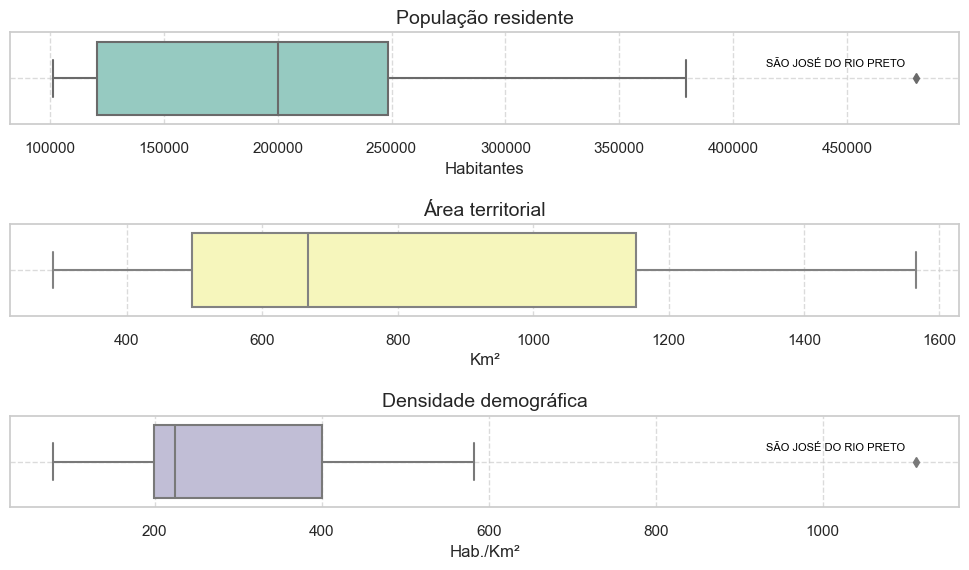

In [42]:
# Seleciona colunas relevantes para os box plots
sample_cp_plots = sample_cp[['pop_residente_pessoas_int', 'area_unidade_territorial_km2', 'densidade_demografica_hab_km2']]

# Função para anotar valores discrepantes com nomes
def annotate_outliers_with_names(ax, df, column, custom_labels):
    series = df[column]
    q1, q3 = series.quantile([0.25, 0.75])
    iqr = q3 - q1
    lower_bound, upper_bound = q1 - 1.5 * iqr, q3 + 1.5 * iqr

    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    outlier_names = outliers.index.tolist()

    for municipality in outlier_names:
        ax.annotate(municipality,
                    xy=(df.loc[municipality, column], 0),
                    xytext=(-58, 10),
                    textcoords='offset points',
                    ha='center',
                    va='center',
                    color='black', 
                    fontsize=8)

# Cria subplots para os box plots
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 6))

# Achata a matriz de arrays 2D para simplificar a indexação
axes = axes.flatten()

custom_titles = ['População residente', 'Área territorial', 'Densidade demográfica']
custom_labels = ['Habitantes', 'Km²', 'Hab./Km²']

# Plota box plots com uma cor diferente para cada coluna
for i, column in enumerate(sample_cp_plots.columns):
    sns.boxplot(x=sample_cp_plots[column], ax=axes[i], color=sns.color_palette('Set3')[i], linewidth=1.5)
    axes[i].set_title(custom_titles[i], fontsize=14)
    axes[i].set_xlabel(custom_labels[i])
    axes[i].set_ylabel('')
    
    # Anota outliers com nomes
    annotate_outliers_with_names(axes[i], sample_cp_plots, column, custom_labels[i])
    
    # Define a grade
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    axes[i].grid(axis='x', linestyle='--', alpha=0.7)

# Ajusta layout
plt.tight_layout(pad=1.5)

# Salva o gráfico
plt.savefig('outputs/sample_boxplots.jpg', dpi=300)

# Exibe o gráfico
plt.show()

In [43]:
# Exibe descrição do DataFrame resultante
sample_description = sample_cp.describe()

# Reordena as colunas
sample_description.iloc[1:,[2,0,1]]

,pop_residente_pessoas_int,area_unidade_territorial_km2,densidade_demografica_hab_km2
mean,214258.200000,804.0,337.974
std,114598.238086,417.63039,261.957882
min,101409.000000,291.0,78.21
25%,120732.000000,495.5,198.65
50%,200124.000000,668.0,224.48
75%,248525.000000,1152.0,400.48
max,480439.000000,1566.0,1112.27


In [44]:
# Novo df com colunas reordenadas
df_sample_partial = sample_description.iloc[1:, [2, 0, 1]]

# Calcula novos valores (estatística descritiva) e adiciona como linhas ao DataFrame
df_sample_partial.loc['range'] = df_sample_partial.iloc[-1] - df_sample_partial.iloc[2]
df_sample_partial.loc['CV']    = df_sample_partial.iloc[1] / df_sample_partial.iloc[0]
df_sample_partial.loc['IQR']   = df_sample_partial.iloc[5] - df_sample_partial.iloc[3]
df_sample_partial.loc['QCD']   = (df_sample_partial.iloc[5] - df_sample_partial.iloc[3]) / df_sample_partial.iloc[5] + df_sample_partial.iloc[3]

# Exibe o DataFrame atualizado
df_sample_partial.round(4)

,pop_residente_pessoas_int,area_unidade_territorial_km2,densidade_demografica_hab_km2
mean,214258.2,804.0,337.974
std,114598.2381,417.6304,261.9579
min,101409.0,291.0,78.21
25%,120732.0,495.5,198.65
50%,200124.0,668.0,224.48
75%,248525.0,1152.0,400.48
max,480439.0,1566.0,1112.27
range,379030.0,1275.0,1034.06
CV,0.5349,0.5194,0.7751
IQR,127793.0,656.5,201.83


### Localidades 2010 IBGE

Nesta seção são extraídos os centros históricos dos municípios da amostra, por meio das coordenadas do centroide (pontos) do setor censitário de referência das localidades.

**Fonte:** https://www.ibge.gov.br/geociencias/organizacao-do-territorio/estrutura-territorial/27385-localidades.html?=&t=acesso-ao-produto

In [45]:
# Carrega os dados, selecionando colunas específicas
columns_to_select = ['NM_MUNICIP', 'NM_UF', 'NM_CATEGOR', 'geometry']

url_br_localidades = 'https://github.com/icn-sousa/TCC_MBA_CD/raw/a75f0d6c9fe154038e2fb11b29a16403b49f6ef1/dados/BR_Localidades_2010_v1.shp'

cities_br = gpd.read_file(url_br_localidades, columns=columns_to_select)

In [46]:
# 'Localidade Selecionadas - 2010' não tem o valor MOGI MIRIM, apenas MOJI MIRIM
print(cities_br[cities_br['NM_MUNICIP'] == 'MOGI MIRIM']['NM_MUNICIP'].value_counts())
print(cities_br[cities_br['NM_MUNICIP'] == 'MOJI MIRIM']['NM_MUNICIP'].value_counts())

Series([], Name: NM_MUNICIP, dtype: int64)
MOJI MIRIM    6
Name: NM_MUNICIP, dtype: int64


In [47]:
# Cria uma cópia
cities_br_replace = cities_br.copy()

# Define um dicionário para substituições de nomes de cidades
city_replacements = {
    'MOJI MIRIM': 'MOGI MIRIM'
}

# Usa o dicionário para substituir o nome da cidade
cities_br_replace['NM_MUNICIP'] = cities_br_replace['NM_MUNICIP'].replace(city_replacements)

# Confere se a substituição funcionou
print(cities_br_replace[cities_br_replace['NM_MUNICIP'] == 'MOGI MIRIM']['NM_MUNICIP'].value_counts())
print(cities_br_replace[cities_br_replace['NM_MUNICIP'] == 'MOJI MIRIM']['NM_MUNICIP'].value_counts())

MOGI MIRIM    6
Name: NM_MUNICIP, dtype: int64
Series([], Name: NM_MUNICIP, dtype: int64)


In [48]:
# Define os filtros e cria uma cópia
filter_conditions = (
    cities_br_replace['NM_MUNICIP'].isin(medium_sized_cities) &
    (cities_br_replace['NM_UF'] == 'SÃO PAULO') &
    (cities_br_replace['NM_CATEGOR'] == 'CIDADE')
)

cities_sp = cities_br_replace[filter_conditions][['NM_MUNICIP', 'geometry']].copy()

# Exibe as 3 primeiras linhas
cities_sp.head(3)

,NM_MUNICIP,geometry
15409,ARAÇATUBA,POINT (-50.43923 -21.20548)
15449,ARARAQUARA,POINT (-48.17444 -21.79036)
15475,ASSIS,POINT (-50.41751 -22.66284)


In [49]:
# Informações sobre centroides das cidades brasileiras
gdf_info(cities_sp)

Dimensionality: (15, 2), 
Type: <class 'geopandas.geodataframe.GeoDataFrame'>, 
Coordinate Reference System (CRS): EPSG:4674


In [50]:
# Informações sobre o GeoDataFrame
cities_sp.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 15 entries, 15409 to 17172
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   NM_MUNICIP  15 non-null     object  
 1   geometry    15 non-null     geometry
dtypes: geometry(1), object(1)
memory usage: 360.0+ bytes


In [51]:
# Salva GeoDataFrame como shapefile
cities_sp.to_file('outputs/centroids.shp')

### Limites territoriais 2022 IBGE

Nesta seção é feita a aquisição dos limites territoriais dos municípios da amostra, por meio das coordenadas dos polígonos (áreas).

**Fonte:** https://www.ibge.gov.br/geociencias/organizacao-do-territorio/malhas-territoriais/15774-malhas.html?edicao=36516&t=acesso-ao-produto

In [52]:
# Carrega os dados, selecionando colunas específicas
url_munics_sp = 'https://github.com/icn-sousa/TCC_MBA_CD/raw/3be4bc0226dfdbce50f18e0d53047ca2a4d4436f/dados/SP_Municipios_2022.shp'
munics_sp = gpd.read_file(url_munics_sp, include_fields=['NM_MUN', 'geometry'])

# Converte o nomes dos municípios para letras maiúsculas
munics_sp['NM_MUN'] = munics_sp['NM_MUN'].str.upper()

# Faz a filtragem
med_munics_sp = munics_sp[munics_sp['NM_MUN'].isin(medium_sized_cities)]

# Exibe as 3 primeiras linhas
med_munics_sp.head(3)

,NM_MUN,geometry
31,ARAÇATUBA,"POLYGON ((-50.35533 -21.10079, -50.35533 -21.1..."
36,ARARAQUARA,"POLYGON ((-48.17274 -21.96569, -48.17325 -21.9..."
46,ASSIS,"POLYGON ((-50.44032 -22.70511, -50.44298 -22.7..."


In [53]:
# Informações sobre os limites territoriais municipais
gdf_info(med_munics_sp)

Dimensionality: (15, 2), 
Type: <class 'geopandas.geodataframe.GeoDataFrame'>, 
Coordinate Reference System (CRS): EPSG:4674


In [54]:
# Informações sobre o GeoDataFrame
med_munics_sp.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 15 entries, 31 to 556
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   NM_MUN    15 non-null     object  
 1   geometry  15 non-null     geometry
dtypes: geometry(1), object(1)
memory usage: 360.0+ bytes


In [55]:
# Salva GeoDataFrame como shapefile
med_munics_sp.to_file('outputs/territorial_limits.shp')

### MapBiomas - Coleção 8: 1985 a 2020 (intervalos de 5 anos)

Nesta seção são adquiridas as áreas urbanas dos municípios da amostra a partir dos limites territoriais dos municípios, por meio de imagens de satélite previamente classificadas pela equipe do MapBiomas. Para tanto, foi utilizado o arquivo com o Código das Legendas da Coleção 8, para identificação do código referente especificamente às áreas urbanizadas (ID 24). Os dados extraídos do formato matricial (*raster*) foram convertidos para o formato vetorial (pontos e polígonos).

**Fonte:** https://brasil.mapbiomas.org/en/colecoes-mapbiomas/

**Tutorial de suporte (canal Geoaplicada do YouTube):** [Baixar dados do Mapbiomas com recorte para sua área de estudo pelo Google Earth Engine](https://www.youtube.com/watch?v=HiDGr1SERsw&list=PLbeeyNw6P9TnvOzljIE5btH9HmWprBPW2&index=3)

In [56]:
# Lê o arquivo CSV com códigos de legenda em um DataFrame
url_legend = 'https://github.com/icn-sousa/TCC_MBA_CD/raw/03b5d679d3a7d9f8034462b7ff26de43e7a7fc19/dados/Codigos-da-legenda-colecao-8.csv'
legend = pd.read_csv(url_legend, sep=';')

# Cria um dicionário para as classes de uso do solo (id) e legenda correspondente
legend_dict = pd.Series(legend['Description'].values,
                        index=legend['Class_ID']).to_dict()

# Recupera a chave para ' Urban Area'
target_value = ' Urban Area'

for key, value in legend_dict.items():
  if value == target_value:
    urban_id = key

In [57]:
# GitHub
base_path = 'https://github.com/icn-sousa/TCC_MBA_CD/raw/5c28719e99de7a98cfaf8a87a20a3a5abb3e919c/dados/uso_cobertura_8_filtered_munics_med_sp_{}.tif'

# Usa dictionary comprehension armazenar o caminho do arquivo raster para cada ano
rasters = {year: base_path.format(year) for year in range(1985, 2021, 5)}

# Usa dictionary comprehension para armazenar os rasters convertidos em GeoDataFrames
gdfs = {year: raster_to_gdf(raster_filepath, target_value=urban_id) for year,
        raster_filepath in rasters.items()}

In [58]:
# Dimensões de cada GeoDataFrame (somente áreas urbanas)
for year, gdf in gdfs.items():
    print(f'{year}: {gdf.shape[0]} rows, {gdf.shape[1]} columns')

1985: 956 rows, 2 columns
1990: 1039 rows, 2 columns
1995: 1078 rows, 2 columns
2000: 1174 rows, 2 columns
2005: 1165 rows, 2 columns
2010: 1132 rows, 2 columns
2015: 1169 rows, 2 columns
2020: 1118 rows, 2 columns


In [59]:
# Use dictionary comprehension para armazenar a geometria mesclada das áreas urbanas
merged_urb_areas = {
    year: gpd.GeoDataFrame({'geometry': [unary_union(gdf['geometry'])]})
    for year, gdf in gdfs.items()
}

In [60]:
# Define CRS para cada GeoDataFrame
new_crs='4674'

for year, gdf in merged_urb_areas.items():
  print(gdf.crs)
  gdf.set_crs(epsg=new_crs, inplace=True)
  gdf.to_crs(epsg=new_crs, inplace=True)
  print(gdf.crs)  # This will print the new CRS, not the old one

# Reminder: https://stackoverflow.com/a/56275808

None
EPSG:4674
None
EPSG:4674
None
EPSG:4674
None
EPSG:4674
None
EPSG:4674
None
EPSG:4674
None
EPSG:4674
None
EPSG:4674


In [61]:
# Informações sobre cada GeoDataFrame
for year, gdf in merged_urb_areas.items():
  print(f'\n{year}:\n')
  gdf.info()


1985:

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  1 non-null      geometry
dtypes: geometry(1)
memory usage: 136.0 bytes

1990:

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  1 non-null      geometry
dtypes: geometry(1)
memory usage: 136.0 bytes

1995:

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  1 non-null      geometry
dtypes: geometry(1)
memory usage: 136.0 bytes

2000:

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  

In [62]:
# Salva cada GeodataFrame como shapefile
for year, gdf in merged_urb_areas.items():
  gdf.to_file(f'outputs/{year}.shp')

### Reprojeções

Nesta seção são feitas as reprojeções dos GeoDataFrames.

**Referências:**

- [Sistemas de Referência de Coordenadas](https://docs.qgis.org/3.28/pt_BR/docs/gentle_gis_introduction/coordinate_reference_systems.html#:~:text=UM%20Sistema%20de%20refer%C3%AAncia%20de%20coordenadas%20(SRC)%20define%2C%20com,e%20Sistemas%20de%20Coordenadas%20Projetadas.)
- [Reprojecting a GeoDataFrame](https://autogis-site.readthedocs.io/en/latest/lessons/lesson-2/map-projections.html#reprojecting-a-geodataframe)
- [Projections](https://geopandas.org/en/stable/docs/user_guide/projections.html)

#### Centroides

In [63]:
# EPSG (UTM) para cada cidade, com base nas coordenadas geográficas de seu centroide
cities_sp_cp = cities_sp.copy()
cities_sp_cp['epsg'] = cities_sp_cp.apply(lambda row : wgs_to_utm(row.geometry.x, row.geometry.y), axis=1)

In [64]:
# Número de cidades por EPSG
cities_sp_cp['epsg'].value_counts()

32722    13
32723     2
Name: epsg, dtype: int64

In [65]:
# Cria um dicionário com o EPSG para cada cidade
epsg_cities = pd.Series(cities_sp_cp['epsg'].values, index=cities_sp_cp['NM_MUNICIP']).to_dict()

In [66]:
# Divide os GeoDataFrames dos centroides das cidades por EPSG
utm_cities = split_by_epsg(cities_sp_cp)

cities_22_S = utm_cities[0]
cities_23_S = utm_cities[1]

In [67]:
# EPSG 32722
cities_22_S.shape

(13, 3)

In [68]:
# EPSG 32723
cities_23_S.shape

(2, 3)

#### Limites territoriais municipais

In [69]:
# EPSG (UTM) para cada cidade, com base no dicionário criado anteriormente
med_munics_sp_cp = med_munics_sp.copy()
med_munics_sp_cp['epsg'] = med_munics_sp_cp['NM_MUN'].map({k:v for k,v in epsg_cities.items()})

In [70]:
# Número de cidades por EPSG
med_munics_sp_cp['epsg'].value_counts()

32722    13
32723     2
Name: epsg, dtype: int64

In [71]:
# Divide os GeoDataFrames do limite territorial dos municípios por EPSG
utm_munics = split_by_epsg(med_munics_sp_cp)

munics_22_S = utm_munics[0]
munics_23_S = utm_munics[1]

In [72]:
# EPSG 32722
munics_22_S.shape

(13, 3)

In [73]:
# EPSG 32723
munics_23_S.shape

(2, 3)

#### Áreas urbanas

In [74]:
# Áreas urbanas com EPSG 32722
urban_areas_22_S = {year: overlay(munics_22_S, gdf, how='intersection') for year, gdf in merged_urb_areas.items()}

# Áreas urbanas com EPSG 32723
urban_areas_23_S = {year: overlay(munics_23_S, gdf, how='intersection') for year, gdf in merged_urb_areas.items()}

In [75]:
# EPSG 32722
for year, gdf in urban_areas_22_S.items():
  print(f'\n{year}:')
  print(gdf.shape)


1985:
(13, 3)

1990:
(13, 3)

1995:
(13, 3)

2000:
(13, 3)

2005:
(13, 3)

2010:
(13, 3)

2015:
(13, 3)

2020:
(13, 3)


In [76]:
# EPSG 32723
for year, gdf in urban_areas_23_S.items():
  print(f'\n{year}:')
  print(gdf.shape)


1985:
(2, 3)

1990:
(2, 3)

1995:
(2, 3)

2000:
(2, 3)

2005:
(2, 3)

2010:
(2, 3)

2015:
(2, 3)

2020:
(2, 3)


In [77]:
# Definie o CRS (EPSG:32722) para cada GeoDataFrame
cities_22_S_utm = cities_22_S.to_crs(epsg='32722')
munics_22_S_utm = munics_22_S.to_crs(epsg='32722')

# Cria uma cópia do GeoDataFrame
urban_areas_22_S_utm = urban_areas_22_S.copy()

for year, gdf in urban_areas_22_S_utm.items():
  gdf.to_crs(epsg='32722', inplace=True)

# Reminder: https://stackoverflow.com/a/56275808

In [78]:
# Define o CRS (EPSG:32723) para cada GeoDataFrame
cities_23_S_utm = cities_23_S.to_crs(epsg='32723')
munics_23_S_utm = munics_23_S.to_crs(epsg='32723')

# Cria uma cópia do GeoDataFrame
urban_areas_23_S_utm = urban_areas_23_S.copy()

for year, gdf in urban_areas_23_S_utm.items():
  gdf.to_crs(epsg='32723', inplace=True)

# Reminder: https://stackoverflow.com/a/56275808

## Parte II

In [79]:
# Define as configurações globais dos gráficos
sns.set(style='whitegrid')

### Funções

Funções usadas na Parte II deste *notebook*.

In [80]:
def calculate_densities(gdf1, distance, gdf2):

  """
  Calculate built densities within buffer zones of varying 
  distances around geographical areas.

  Args:

    gdf1: A GeoDataFrame with centroids distance: The buffer 
    distance in meters around each geographical area.
    gdf2: A GeoDataFrame representing urban areas.

  Returns:

    dict: A dictionary containing two DataFrames:
      - 'complete_df': A GeoDataFrame with buffer geometries, 
      area calculations, and intersection results.
      - 'densities': A DataFrame with columns 'NM_MUNICIP' 
      (geographical area name) and 'densities_buffer_Xkm', where 
      'X' represents the buffer distance in kilometers, containing 
      the population densities.
  """

  # Creates copies to avoid modifying the original data
  gdf1_copy = gdf1.copy()
  gdf2_copy = gdf2.copy()

  # Calculates the buffer name (in kilometers) based on the input distance
  buffer_name = f'{distance//1000}km'

  # Constructs a column name based on the buffer name
  column_name = f'buffer_{buffer_name}'

  # Creates buffer polygons around the geometries using the given distance
  if distance == 1000:
    gdf1_copy[column_name] = gdf1_copy['geometry'].buffer(distance)

  else:
    gdf1_copy['band'] = gdf1_copy['geometry'].buffer(distance)
    gdf1_copy['band_minus'] = gdf1_copy['geometry'].buffer(distance-1000)
      
    # Subtract smaller buffer from larger buffer to create the band
    gdf1_copy[column_name] = gdf1_copy['band'].difference(gdf1_copy['band_minus'])

  # Calculates the area of each buffer (square km), considering the
  # difference between adjacent columns, and stores it in a new column
  if distance == 1000:
    gdf1_copy[column_name + '_area_km2'] = np.pi * 1 ** 2

  else:
    distance_adjusted = distance//1000
    gdf1_copy[column_name + '_area_km2'] = np.pi * distance_adjusted ** 2 - np.pi * (distance_adjusted - 1) ** 2

  # Creates a new GeoDataFrame called buffer_gdf with
  # various columns extracted from df_copy
  buffer_gdf = gpd.GeoDataFrame({
      'NM_MUNICIP': gdf1_copy['NM_MUNICIP'],
      'centroid': gdf1_copy['geometry'],
      'buffer_distance_km': distance//1000,
      'area_km2_buffer_'+ buffer_name: gdf1_copy[column_name + '_area_km2'],
      'geometry': gdf1_copy[column_name]
      })

  # Use overlay() to intersect the buffer with the urban areas layer
  filled_buffer = overlay(buffer_gdf, gdf2_copy, how='intersection')

  # Calculate the area (square km) in the buffer, storing it in a new column
  filled_buffer['area_filled_km²_buffer_'+ buffer_name] = filled_buffer.geometry.area / 10**6

  # Calculates a density value for each intersection geometry by dividing the area of the intersection by the area of the original buffer
  filled_buffer['densities_buffer_' + buffer_name] = filled_buffer['area_filled_km²_buffer_' + buffer_name] / filled_buffer['area_km2_buffer_' + buffer_name]

  # Select the relevant columns
  densities = filled_buffer[['NM_MUNICIP', 'densities_buffer_' + buffer_name, 'geometry']].copy()

  return {'complete_df': filled_buffer, 'densities': densities}

In [81]:
def densities_nested_dict(gdfs_dict, centroids):

  """"
  Calculate densities for multiple geographical areas at various buffer
  distances and organize the results into a nested dictionary structure.

  Args:

    gdfs_dictionary: A dictionary containing GeoDataFrames. Each key
    represents a year, and the corresponding value is a GeoDataFrame
    representing a geographical area for that year.

    centroids: A GeoDataFrame containing centroid points used for 
    density calculations.

  Returns:

    dict: A nested dictionary where each outer key represents a year, and the
    corresponding value is an inner dictionary containing density values for
    different buffer distances.
  """

  # 1 to 10 km buffers
  distances = range(1000, 11000, 1000)

  # Initialize an empty dictionary to store the results
  yearly_densities = {}

  # Iterate through the years and calculate densities
  for year, gdf in gdfs_dict.items():

    # Create a dictionary to store densities for different buffer distances
    densities_by_distance = {}

    # Iterate through the buffer distances
    for dist in distances:

      # Calculate densities for the current year, distance, and geographical area
      densities_result = calculate_densities(gdf1=centroids, distance=dist, gdf2=gdf)['densities']

      # Add the densities to the dictionary with a key indicating the buffer distance
      densities_by_distance[f'buffer_{dist // 1000}km'] = densities_result

      # Add the dictionary of densities for different distances to the main dictionary
      yearly_densities[year] = densities_by_distance

  return yearly_densities

In [82]:
def intersect_territorial_limits(munics_gdf, densities_gdf):

  """
  Intersection between built densities and municipal territorial limits.

  Parameters:
    munics_gdf: GeoDataFrame containing municipal boundaries.
    density_gdfs: Dictionary where keys are years and values are 
    GeoDataFrames containing built densities data for each year.

  Returns:
    dict: A nested dictionary where keys are years, and values 
            are GeoDataFrames representing the intersections.
  """

  return {
      year: {buffer: overlay(gdf, munics_gdf, how='intersection',
                             keep_geom_type=False) for buffer, gdf in
             gdfs_dict.items()} for year, gdfs_dict in densities_gdf.items()
             }

# Reminder: nested dictionary comprehension in Python: https://stackoverflow.com/a/17915141

In [83]:
def gdfs_shape(nested_dict):

    """
    Retrieve the shape (number of rows and columns) of gdfs buffers stored
    in a nested dictionary, where each year is a key and its corresponding
    value is another dictionary containing gdfs.

    Parameters:
    nested_dict: A nested dictionary where each year is a key and
        its value is a dictionary containing GeoDataFrames.
    """

    for year, gdfs_dict in nested_dict.items():
        print(f'\n{year}:\n')

        for buffer, gdf in gdfs_dict.items():
            print(f'{buffer}: {gdf.shape}')

# Reminder: iterating through a nested dictionary: https://www.programiz.com/python-programming/nested-dictionary

In [84]:
def filter_densities_munics(densities_munics):

  """
  Filter a nested dictionary of GeoDataFrames.

  The rows are removed based on two conditions:
    1. No-matching 'NM_MUNICIP' and 'NM_MUN' columns.
    2. 'GEOMETRYCOLLECTION' or 'LINESTRING' in the 'geometry' column.

  Args:
      input_densities_munics_utm: A nested dictionary containing GeoDataFrames.

  Returns:
      dict: A filtered nested dictionary with GeoDataFrames.
  """

  return {
            year: {
                buffer: gdf[
                    (gdf['NM_MUNICIP'] == gdf['NM_MUN']) & # same cities
                    ~gdf['geometry'].apply(lambda x: 'GEOMETRYCOLLECTION' in str(x)) & # no collection geometries
                    ~gdf['geometry'].apply(lambda x: 'LINESTRING' in str(x)) # no linestrings
                ]
                for buffer, gdf in gdfs_dict.items()
            }
            for year, gdfs_dict in densities_munics.items()
        }

In [85]:
def get_highest_densities(dict_to_filter):

  """
  Takes a dictionary containing GeoDataFrames associated with different years
  and buffer sizes. It filters each GeoDataFrame within the dictionary to
  retain only the rows with the highest density value for each municipality.

  Parameters:
    - dict_to_filter: A dictionary where keys represent years, and values are
      dictionaries where keys represent buffer sizes, and values are
      GeoDataFrames containing density information.

  Returns:
    - filtered_dict: A dictionary with the same structure as `dict_to_filter`,
      where each GeoDataFrame within it has been filtered to retain only the
      rows with the highest density for each municipality.

  The function iterates through the dictionary's structure, sorting the
  GeoDataFrames for each buffer size by density in descending order and
  retaining only the rows with the highest density value for each municipality.
  The resulting filtered GeoDataFrames are stored in a new dictionary
  with the same structure as the input, and this filtered dictionary
  is returned as the output.
  """

  # Initialize an empty dictionary to store filtered gdfs for each year
  filtered_dict = {}

  # Iterate through the items (year and corresponding gdfs dictionary)
  for year, gdfs_dict in dict_to_filter.items():

    # Initialize an empty dictionary to store filtered gdfs for each buffer
    filtered_gdfs = {}

    # Iterate through the items (buffer size and gdf in the year's gdf dictionary)
    for buffer, gdf in gdfs_dict.items():

        # Sort the gdf by columns starting with 'densities_buffer_' in descending order
        filtered_gdf = gdf.sort_values(by=[col for col in gdf.columns if col.startswith('densities_buffer_')], ascending=False)

        # Group the sorted GeoDataFrame by "NM_MUNICIP" and select the first
        # row in each group. This effectively retains the row with the
        # highest density for each municipality
        filtered_gdf = filtered_gdf.groupby("NM_MUNICIP").first().reset_index()

        # Store the filtered gdf in the dictionary using the buffer size as the key
        filtered_gdfs[buffer] = filtered_gdf

    # Store the dictionary of filtered gdfs for the current year in the main result dictionary
    filtered_dict[year] = filtered_gdfs

  return filtered_dict

In [86]:
def gdf_to_df(refiltered_densities_munics):

  """
  Converts a collection of GeoDataFrames containing density information
  into a dictionary of DataFrames for different buffer zones and years.

  Parameters:
  - refiltered_densities_munics: A dictionary where each key represents 
      a year, and the corresponding value is a GeoDataFrame containing 
      density information for multiple buffer zones around municipalities.

  Returns:
  - densities_dfs_dict: A dictionary where each key represents a year, and 
      the corresponding value is a DataFrame containing merged density 
      information from various buffer zones. The DataFrame columns are 
      restructured for clarity, and the 'NM_MUN' column is dropped.

  This function iterates through each year's GeoDataFrame in the input
  dictionary, extracts density information for different buffer zones, 
  merges them into a single DataFrame, and stores the result in the output 
  dictionary. It also renames columns for better readability.

  Note:
  - The 'buffer_1km' GeoDataFrame is used as a base, and columns named 'epsg' 
      and 'geometry' are dropped from all GeoDataFrames before merging.
  - Buffer zones from 2km to 10km are included in the final DataFrame.
  """

  # Geopandas GeoDataFrame to Pandas DataFrame
  columns_to_drop = ['epsg', 'geometry']

  # Create an empty dictionary to store the merged DataFrames for each year
  densities_dfs_dict = {}

  # Iterate through the keys (years) of the dictionary
  for year in list(refiltered_densities_munics.keys()):

    # Create empty list to store the 1km buffers
    dfs = []

    # Append the DataFrames for buffer_1km, dropping columns
    dfs.append(refiltered_densities_munics[year]['buffer_1km'].drop(columns_to_drop, axis=1))

    # Drop columns for buffers 2km to 10km and store them in a list
    dfs += [refiltered_densities_munics[year][f'buffer_{i}km'].drop(columns_to_drop, axis=1) for i in range(2, 11)]

    # Merge DataFrames for the current year
    merged_df = reduce(lambda left, right: pd.merge(left, right, on=['NM_MUN', 'NM_MUNICIP'], how='outer'), dfs)

    # Drop the 'NM_MUN' column
    merged_df.drop('NM_MUN', axis=1, inplace=True)

    # Rename the columns for better clarity
    merged_df.columns = ['NM_MUNICIP'] + [col.replace('densities_buffer_', '') for col in merged_df.columns[1:]]

    # Store the merged DataFrame in the dictionary with the year as the key
    densities_dfs_dict[year] = merged_df

  return densities_dfs_dict

In [87]:
def dfs_shape(dfs_dict):

    """
    Retrieve the shape (number of rows and columns) of DataFrames 
    stored in a dictionary.

    Parameters:
    dfs_dict: A dictionary where each year is a key and its corresponding 
    value the DataFrames.
    """
    
    for year, df in dfs_dict.items():
      print(f'{year}: {df.shape}')

In [88]:
def density_limiar(densities_dfs_dict):

  """
  Filter and modify density data in a dictionary of DataFrames.

  This function takes a dictionary of DataFrames, where each DataFrame
  represents density data for a specific year, and filters the data based
  on a density threshold. When the density falls below 0.05, it retains only
  the adjacent km values and sets the others to NaN (Not a Number).

  Parameters:
    - densities_dfs_dict: A dictionary where keys are years and values are
      corresponding DataFrames containing density data.

  Returns:
    - modified_densities_dfs_dict: A new dictionary with the same structure as
      densities_dfs_dict`, but with the density data modified based on the
      threshold. DataFrames in this dictionary have NaN values for density
      entries that do not meet the specified threshold.
  """

  # Create a new dictionary to store modified dataframes
  modified_densities_dfs_dict = {}

  for year, df in densities_dfs_dict.items():

    # Create a copy of the original DataFrame
    df_cp = df.copy()

    # When the density is smaller than (<) 0.05, it considers only one more km
    for index, row in df_cp.iterrows():
      value = row.values[1:]

      for i in range(len(value)):
        if i > 0 and value[i - 1] <= 0.05:
          for j in range(i + 1, len(value)):
            value[j] = np.nan

      df_cp.loc[index, df_cp.columns[1:]] = value

    # Store the modified DataFrame in the new dictionary
    modified_densities_dfs_dict[year] = df_cp

  return modified_densities_dfs_dict

In [89]:
def minimum_three_values(df, column):

  """
  Fill missing values in the third column of a DataFrame with zeros.

  Parameters:
    df: The input DataFrame.
    column (str): The name of the column in the DataFrame to be processed.

  Returns:
    df_copy: A copy of the input DataFrame with missing values in the
    specified column replaced by zeros.
  """

  # Make a copy of the DataFrame to avoid modifying the original
  df_copy = df.copy()

  # Check if the column name has NaN
  if df_copy[column].isna().values.any():
      
    # Fill missing values in the specified column with zeros
    df_copy['column'] = df_copy['column'].fillna(0)

  return df_copy

In [90]:
def densities_3km(mod_densities_dfs_dict, third_column='3km'):

  """
  Fill missing values in a dictionary of DataFrames' specified column 
  with zeros and return a dictionary of copies.

  This function iterates through a dictionary of DataFrames and for each
  DataFrame, it calls the 'minimum_three_values' function to fill missing
  values in the specified 'third_column' with zeros. It then stores the
  resulting DataFrames in a new dictionary.

  Parameters:
    mod_densities_dfs_dict: A dictionary where keys are years and values are
    DataFrames.
    third_column (str, optional): The name of the column in the DataFrames to
    be processed. Default is '3km'.

  Returns:
    dict: A dictionary where keys are years and values are copies of the input
    DataFrames with missing values filled with zeros.
  """

  # Creates empty dictionary to store the results
  densities_3km_dict = {}

  # Iterates through a dictionary of DataFrames by year
  for year, df in mod_densities_dfs_dict.items():
    # Applies the function
    df_copy = minimum_three_values(df, third_column)
    # Stores the resulting dfs in the created dictionary
    densities_3km_dict[year] = df_copy

  return densities_3km_dict

In [91]:
def display_densities(gdfs_dict, centroids, munics_gdf):

  """
  Calculate and display urban density information within municipal territories.

  This function takes three input parameters:
  1. gdfs_dict: A dictionary containing gdfs with urban density information.
  2. centroids: A gdf representing the centroids of municipal territories.
  3. munics_gdf: A gdf representing municipal territorial limits.

  The function performs the following steps:
  1. Calculate urban densities within the specified gdfs and centroids using
  a nested dictionary structure.
  2. Determine the intersection between the calculated urban densities and
  municipal territorial limits.
  3. Filter the intersected data to include only rows with equal column values
  and containing polygons or multipolygons.
  4. Retain only the rows with the highest density value for each municipality.
  5. Convert the resulting gdf to dfs within a nested dictionary structure.
  6. Apply filtering based on a density threshold to the dfs.
  7. If there is no value in the third column (3km), fill it with zeros.

  Returns:
    DataFrame: A DataFrame containing yearly urban density information.
  """

  # Calculated densities (nested dictionary structure)
  densities = densities_nested_dict(gdfs_dict, centroids)

  # Intersection between built densities and municipal territorial limits
  densities_munics = intersect_territorial_limits(munics_gdf, densities)

  # Filtering (equal column values and only polygons or multipolygons)
  filtered_densities_munics = filter_densities_munics(densities_munics)

  # Retain only the rows with the highest density value for each municipality
  refiltered_densities_munics = get_highest_densities(filtered_densities_munics)

  # Nested dictionary of gdfs to dictionary of dfs
  densities_dfs_dict = gdf_to_df(refiltered_densities_munics)

  # Filtering based on a density threshold
  mod_densities_dfs_dict = density_limiar(densities_dfs_dict)

  # Minimum of 3 values to fit the 'urban land function'
  densities = densities_3km(mod_densities_dfs_dict)

  # DataFrame with yearly densities
  return densities

In [92]:
def urban_land_density(r, alpha, c, D):

  """ Calculates the urban land density sigmoid function """

  return ((1 - c) / (1 + np.exp(alpha * ((2 * r / D) - 1)))) + c

In [93]:
# Smoothed Fit

def coeffs_sigmoid_function(densities_df):

    # Create an empty DataFrame to store the results
    coefficients = ['NM_MUNICIP', 'alpha', 'c', 'D', 'SSR', 'SSM', 'SST',
                    'R²', 'r1', 'r2', 'f1', 'f2', 'ks', 'kp']

    coefficients_df = pd.DataFrame(columns=coefficients)

    # Get the distance values
    cols = np.arange(0, len(densities_df.columns) - 1)

    # Loop through each row of the dataframe
    for i, row in densities_df.iterrows():

        # Get the km values for this row
        ydata = row.iloc[1:].values
        ydata = ydata[~pd.isna(ydata)]

        # Skip if not enough data points for fitting
        if len(ydata) < 3:
            continue

        # Fit the function to the data using curve_fit()
        popt, pcov = curve_fit(urban_land_density, cols[:len(ydata)], ydata, maxfev=150)

        # Calculate the sum of squared residuals (SSR)
        residuals = ydata - urban_land_density(cols[:len(ydata)], *popt)
        ssr = np.sum(residuals**2)
        # print('\nSum of squared residuals (SSR) for',
        #       densities_df.loc[i, 'NM_MUNICIP'], ':', ssr)

        # Calculate the sum of squares of the mean (SSM)
        ymean = np.mean(ydata)
        ssm = np.sum((ydata - ymean)**2)
        # print('Sum of squares of the mean (SSM) for',
        #       densities_df.loc[i, 'NM_MUNICIP'], ':', ssm)

        # Calculate the total sum of squares (SST)
        sst = ssr + ssm
        # print('Total sum of squares (SST) for',
        #       densities_df.loc[i, 'NM_MUNICIP'], ':', sst)

        # Calculate the coefficient of determination (R-squared)
        r_squared = 1 - ssr / sst
        # print('Coefficient of determination (R-squared) for',
        #       densities_df.loc[i, 'NM_MUNICIP'], ':', r_squared)

        # Calculate the r1
        r1 = (popt[2] / 2) * ((-1.316957 / popt[0]) + 1)
        # print('\nr1 for', densities_df.loc[i, 'NM_MUNICIP'], ':', r1)

        # Calculate the r2
        r2 = (popt[2] / 2) * ((1.316957 / popt[0]) + 1)
        # print('r2 for', densities_df.loc[i, 'NM_MUNICIP'], ':', r2)

        # Calculate the f1
        f1 = 0.788675 * (1 - popt[1]) + popt[1]
        # print('f1 for', densities_df.loc[i, 'NM_MUNICIP'], ':', f1)

        # Calculate the f2
        f2 = 0.211325 * (1 - popt[1]) + popt[1]
        # print('f2 for', densities_df.loc[i, 'NM_MUNICIP'], ':', f2)

        # Calculate the ks
        ks = (f1 - f2) / (r2 - r1)
        # print('ks for:', densities_df.loc[i, 'NM_MUNICIP'], ':', ks)

        # Calculate the kp
        kp = (r2 - r1) / popt[2]
        # print('kp for :', densities_df.loc[i, 'NM_MUNICIP'], ':', kp)

        # Append the results of the coefficients to the DataFrame
        coefficients_row = [densities_df.loc[i, 'NM_MUNICIP']] + list(popt) + [ssr, ssm, sst, r_squared, r1, r2, f1, f2, ks, kp]
        coefficients_df.loc[i] = coefficients_row

    # Display the results DataFrame
    return coefficients_df

In [94]:
def coefficients_dictionary(densities):

  """
  Calculate coefficients using a sigmoid function for
  each year's density data and store them in a dictionary.

  Args:
    densities: A dictionary where each key represents a year, 
    and the corresponding value is a DataFrame containing density 
    information for that year.

  Returns:
    dict: A dictionary where each key represents a year, and the 
    corresponding value is a set of coefficients calculated using a 
    sigmoid function based on the density data for that year.
  """

  coeffs_dict = {}

  for year, df in densities.items():
    dfs_coeffs = coeffs_sigmoid_function(densities_df=df)
    coeffs_dict[year] = dfs_coeffs

  return coeffs_dict

### Densidades

Nesta seção são extraídas as densidades territoriais urbanas dos municípios para cada um dos 8 anos (1985, 1990, 1995, 2000, 2005, 2010, 2015, 2020), com base na área urbanizada ao longo de aneis concêntricos equidistantes (1 quilômetro cada, a partir dos centroides centros históricos).

In [95]:
# Densidades (EPSG: 32722)
densities_22_S_utm = display_densities(gdfs_dict=urban_areas_22_S_utm,
                                       centroids=cities_22_S_utm,
                                       munics_gdf=munics_22_S_utm)
# Densidades (EPSG: 32723)
densities_23_S_utm = display_densities(gdfs_dict=urban_areas_23_S_utm,
                                       centroids=cities_23_S_utm,
                                       munics_gdf=munics_23_S_utm)

### Urban land density function (Jiao, 2015)

**Referência:** [Urban land density function: A new method to characterize urban expansion](https://www.sciencedirect.com/science/article/abs/pii/S0169204615000481)

In [96]:
# Mescla DataFrames e armazena em um novo dicionário
dictA = densities_22_S_utm
dictB = densities_23_S_utm

densities_dfs_dict = {
    year: (pd.concat([dictA[year], dictB[year]])
            .sort_values(by='NM_MUNICIP')
            .reset_index()
            .drop(columns=['index']))
    for year in dictA
}

In [97]:
# Percorre o dicionário e insire uma coluna de 1 em cada DataFrame
for year, df in densities_dfs_dict.items():
    df.insert(1, '0km', 1)

In [98]:
# Confere se a coluna foi inserida
densities_dfs_dict[1985].round(4).head(3)

,NM_MUNICIP,0km,1km,2km,3km,4km,5km,6km,7km,8km,9km,10km
0,ARARAQUARA,1,0.8307,0.6741,0.2661,0.0249,0.0145,NaN,NaN,NaN,NaN,NaN
1,ARAÇATUBA,1,0.9626,0.5700,0.2842,0.0858,0.0005,NaN,NaN,NaN,NaN,NaN
2,ASSIS,1,0.9441,0.5017,0.1300,0.0263,0.0078,NaN,NaN,NaN,NaN,NaN


#### Dicionário de coeficientes

In [99]:
# Cria um dicionário de coeficientes
smoothed_coeffs = coefficients_dictionary(densities=densities_dfs_dict)

# Exibe o primeiro df do dicionário de coeficientes
smoothed_coeffs[1985].round(4).head(3)

,NM_MUNICIP,alpha,c,D,SSR,SSM,SST,R²,r1,r2,f1,f2,ks,kp
0,ARARAQUARA,3.6220,-0.0320,4.8297,0.0070,0.8998,0.9068,0.9923,1.5368,3.2929,0.7819,0.1861,0.3393,0.3636
1,ARAÇATUBA,3.8122,0.0162,4.5917,0.0100,0.9350,0.9450,0.9894,1.5027,3.0889,0.7921,0.2241,0.3581,0.3455
2,ASSIS,4.8272,0.0215,4.0204,0.0017,1.0254,1.0271,0.9983,1.4618,2.5586,0.7932,0.2283,0.5151,0.2728


In [100]:
parameters = {}

# cols = ['NM_MUNICIP', 'alpha', 'c', 'D', 'R²']
cols = ['NM_MUNICIP', 'r1', 'r2', 'f1', 'f2', 'ks', 'kp']

for year, df in smoothed_coeffs.items():
    parameters[year] = df[cols].set_index("NM_MUNICIP")

data = parameters

# Converte para DataFrame
parameters_df = pd.DataFrame.from_dict({(i, j): data[i][j] for i in data.keys() for j in data[i]})

# Define nomes apropriados para as colunas
parameters_df.columns = pd.MultiIndex.from_tuples(parameters_df.columns)

#### K<sub>p e K<sub>ps</sub>

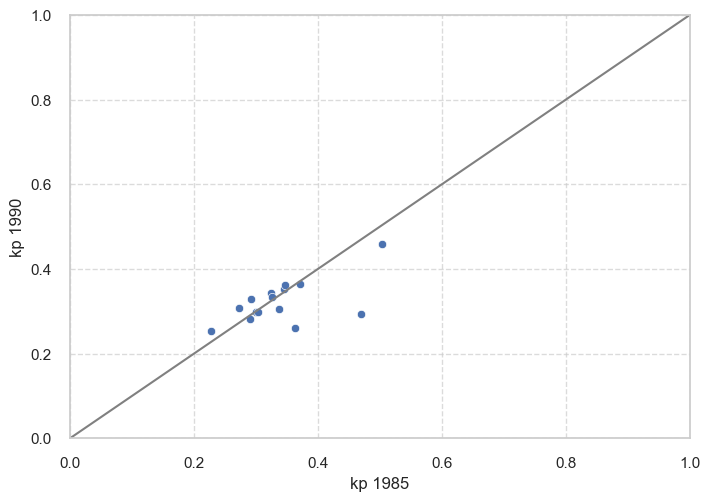

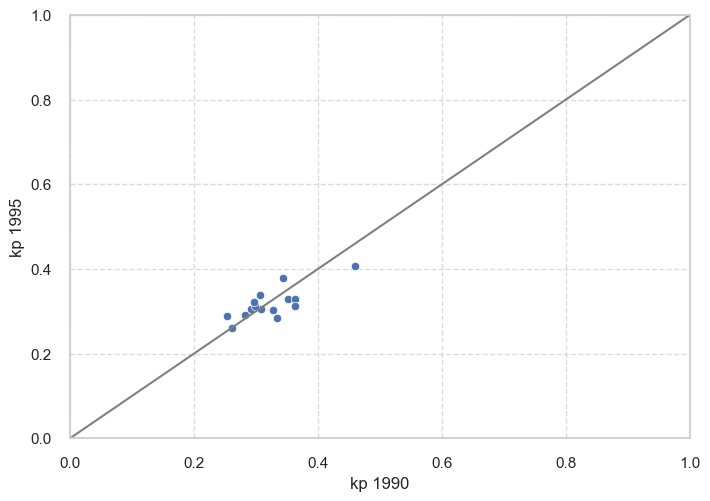

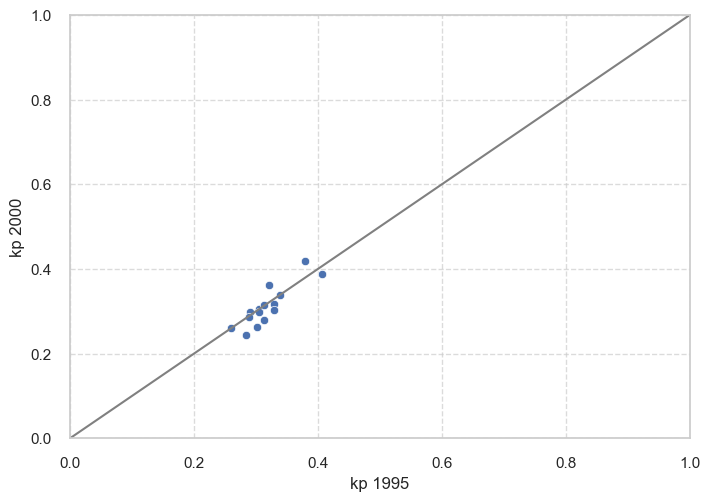

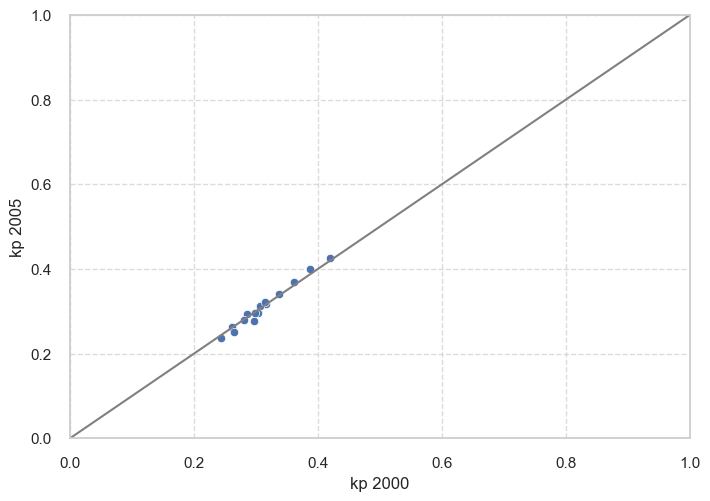

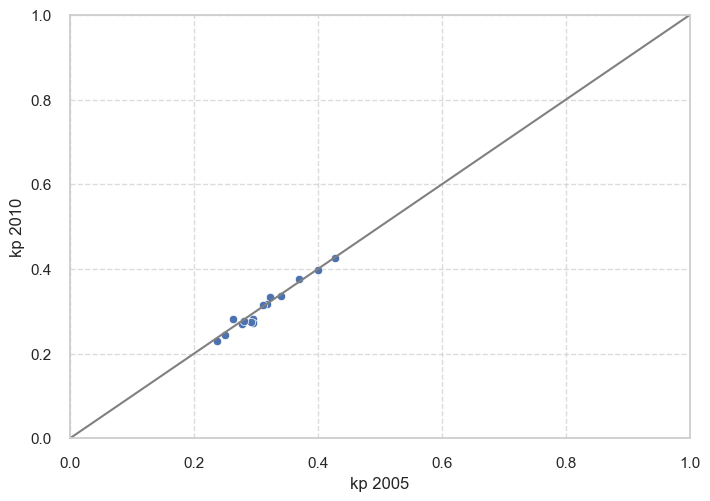

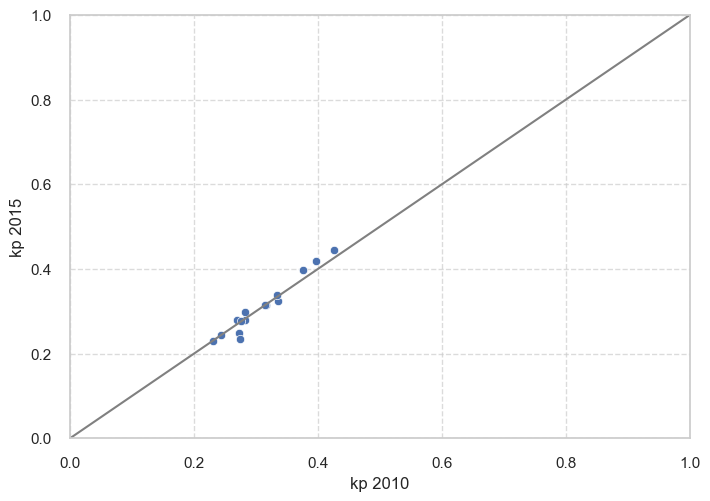

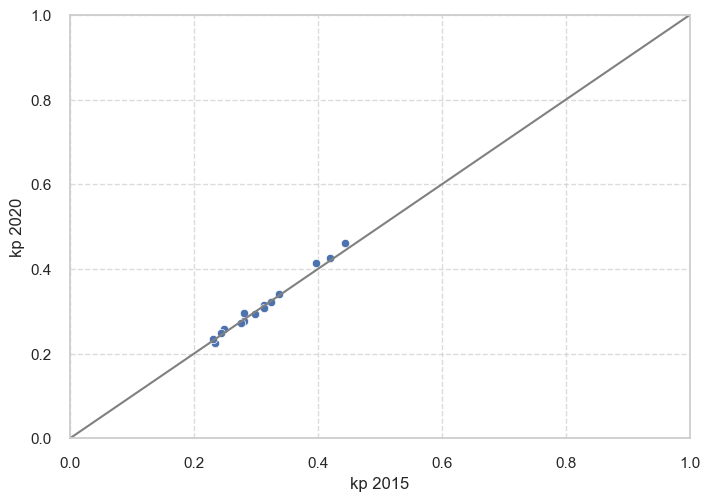

In [101]:
# Avalie o degree of sprawling comparando os valores de kp em dois momentos
intervals = [
    (1985,1990), (1990,1995), (1995,2000), (2000,2005),
     (2005,2010), (2010,2015), (2015,2020)
    ]

for start_year, end_year in intervals:
    
    sns.scatterplot(x=smoothed_coeffs[start_year]['kp'], y=smoothed_coeffs[end_year]['kp'])
    
    plt.xlabel(f'kp {start_year}')
    plt.ylabel(f'kp {end_year}')
    
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    
    plt.plot([0, 1], [0, 1], color='gray', linestyle='-')
    
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    
    plt.show()
    print()

In [102]:
# Muda o índice para a primeira coluna
smoothed_coeffs_cities_index = {}

for year, df in smoothed_coeffs.items():
  smoothed_coeffs_cities_index[year] = df.set_index('NM_MUNICIP')

In [103]:
# Mantém apenas a coluna Kp
kps_df = {}

for key, df in smoothed_coeffs_cities_index.items():
    kps_df[key] = df['kp']

# Mostra as três primeiras linhas das colunas restantes de cada df
for key, df in kps_df.items():
  print(f'{key}:\n{df.head(3)}\n')

1985:
NM_MUNICIP
ARARAQUARA    0.363595
ARAÇATUBA     0.345460
ASSIS         0.272818
Name: kp, dtype: float64

1990:
NM_MUNICIP
ARARAQUARA    0.261666
ARAÇATUBA     0.352618
ASSIS         0.308027
Name: kp, dtype: float64

1995:
NM_MUNICIP
ARARAQUARA    0.260672
ARAÇATUBA     0.328678
ASSIS         0.305698
Name: kp, dtype: float64

2000:
NM_MUNICIP
ARARAQUARA    0.261408
ARAÇATUBA     0.316212
ASSIS         0.305934
Name: kp, dtype: float64

2005:
NM_MUNICIP
ARARAQUARA    0.263709
ARAÇATUBA     0.318429
ASSIS         0.311520
Name: kp, dtype: float64

2010:
NM_MUNICIP
ARARAQUARA    0.281843
ARAÇATUBA     0.317152
ASSIS         0.314087
Name: kp, dtype: float64

2015:
NM_MUNICIP
ARARAQUARA    0.298009
ARAÇATUBA     0.313840
ASSIS         0.313788
Name: kp, dtype: float64

2020:
NM_MUNICIP
ARARAQUARA    0.294691
ARAÇATUBA     0.314088
ASSIS         0.308720
Name: kp, dtype: float64



In [104]:
intervals = [(2020, 2015), (2015, 2010), (2010, 2005), (2005, 2000), (2000, 1995), (1995, 1990), (1990, 1985)]

# Crie um dicionário vazio para armazenar as diferenças
sprawling_degree = {}

for start_year, end_year in intervals:
    key1 = start_year
    key2 = end_year

    result_key = f"{start_year}-{end_year}"

    # Execute a divisão e armazena no dicionário sprawling_degree
    sprawling_degree[result_key] = kps_df[key1].divide(kps_df[key2], fill_value=0)

In [105]:
# Mostra as três primeiras linhas das colunas restantes de cada df
for key, df in sprawling_degree.items():
  print(f'{key}:\n{df.head(3)}\n')

2020-2015:
NM_MUNICIP
ARARAQUARA    0.988866
ARAÇATUBA     1.000791
ASSIS         0.983850
Name: kp, dtype: float64

2015-2010:
NM_MUNICIP
ARARAQUARA    1.057359
ARAÇATUBA     0.989556
ASSIS         0.999047
Name: kp, dtype: float64

2010-2005:
NM_MUNICIP
ARARAQUARA    1.068768
ARAÇATUBA     0.995991
ASSIS         1.008242
Name: kp, dtype: float64

2005-2000:
NM_MUNICIP
ARARAQUARA    1.008799
ARAÇATUBA     1.007010
ASSIS         1.018257
Name: kp, dtype: float64

2000-1995:
NM_MUNICIP
ARARAQUARA    1.002825
ARAÇATUBA     0.962073
ASSIS         1.000771
Name: kp, dtype: float64

1995-1990:
NM_MUNICIP
ARARAQUARA    0.996201
ARAÇATUBA     0.932107
ASSIS         0.992440
Name: kp, dtype: float64

1990-1985:
NM_MUNICIP
ARARAQUARA    0.719663
ARAÇATUBA     1.020719
ASSIS         1.129057
Name: kp, dtype: float64



#### *Sprawl ratio* (S<sub>r)

In [106]:
# Lista de nomes de colunas a serem retidos no DataFrame mantido
columns_to_retain = ['r1', 'r2']

# Mantém apenas as colunas que serão utilizadas para calcular Sr1, Sr2 e Sr
for key, df in smoothed_coeffs_cities_index.items():
    smoothed_coeffs_cities_index[key] = df[columns_to_retain]

# Mostra as três primeiras linhas das colunas restantes de cada df
for key, df in smoothed_coeffs_cities_index.items():
  print(f'{key}:\n{df.head(3)}\n')

1985:
                  r1        r2
NM_MUNICIP                    
ARARAQUARA  1.536833  3.292903
ARAÇATUBA   1.502711  3.088947
ASSIS       1.461776  2.558610

1990:
                  r1        r2
NM_MUNICIP                    
ARARAQUARA  2.121058  3.624469
ARAÇATUBA   1.863069  3.892634
ASSIS       1.494163  2.824397

1995:
                  r1        r2
NM_MUNICIP                    
ARARAQUARA  2.378749  4.056148
ARAÇATUBA   2.227427  4.408516
ASSIS       1.755563  3.301499

2000:
                  r1        r2
NM_MUNICIP                    
ARARAQUARA  2.607560  4.453339
ARAÇATUBA   2.412802  4.644365
ASSIS       1.829722  3.442751

2005:
                  r1        r2
NM_MUNICIP                    
ARARAQUARA  2.715658  4.660925
ARAÇATUBA   2.524126  4.882664
ASSIS       1.879329  3.580025

2010:
                  r1        r2
NM_MUNICIP                    
ARARAQUARA  2.873675  5.129244
ARAÇATUBA   2.626498  5.066282
ASSIS       1.929477  3.696535

2015:
                  r1  

In [107]:
intervals = [(2020, 2015), (2015, 2010), (2010, 2005), (2005, 2000), (2000, 1995), (1995, 1990), (1990, 1985)]

# Cria um dicionário vazio para armazenar as diferenças
diff_coeffs = {}

for start_year, end_year in intervals:
    key1 = start_year
    key2 = end_year

    result_key = f"{start_year}-{end_year}"

    # Executa a subtração e armazena no dicionário diff_coeffs
    diff_coeffs[result_key] = smoothed_coeffs_cities_index[key1].subtract(
        smoothed_coeffs_cities_index[key2], fill_value=0
    )

    # Calcula o Sr1
    diff_coeffs[result_key]['Sr2'] = diff_coeffs[result_key]['r2'] * smoothed_coeffs_cities_index[end_year]['r1']

    # Calcula o Sr2
    diff_coeffs[result_key]['Sr1'] = smoothed_coeffs_cities_index[end_year]['r2'] * diff_coeffs[result_key]['r1']

    # Calcula o degree of urban sprawl (Sr)
    diff_coeffs[result_key]['Sr'] = diff_coeffs[result_key]['Sr2'] / diff_coeffs[result_key]['Sr1']

In [108]:
# Confere se as colunas Sr2, Sr1 and Sr foram criadas
diff_coeffs['2020-2015'].head(3)

,r1,r2,Sr2,Sr1,Sr
NM_MUNICIP,,,,,
ARARAQUARA,0.158896,0.251940,0.746926,0.871043,0.857508
ARAÇATUBA,0.061501,0.120669,0.325139,0.317305,1.024690
ASSIS,0.110825,0.166716,0.336265,0.427965,0.785730


In [109]:
# Altera os nomes das colunas
for intervals, df in diff_coeffs.items():
  df.columns = ['delta_r1', 'delta_r2', 'Sr2', 'Sr1', 'Sr']

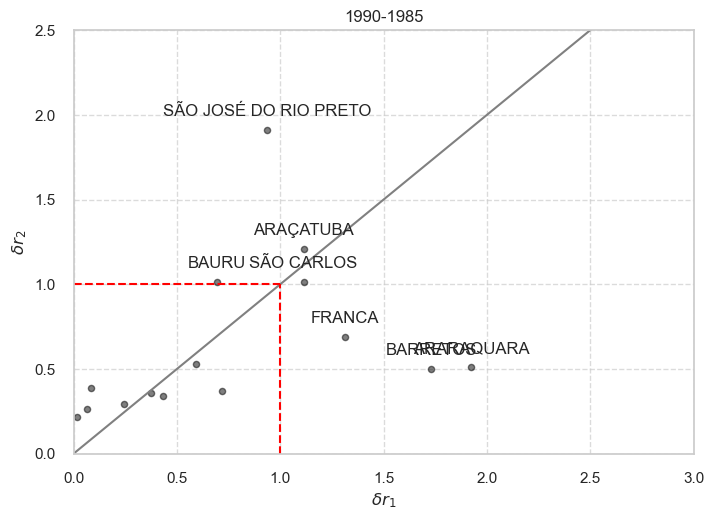

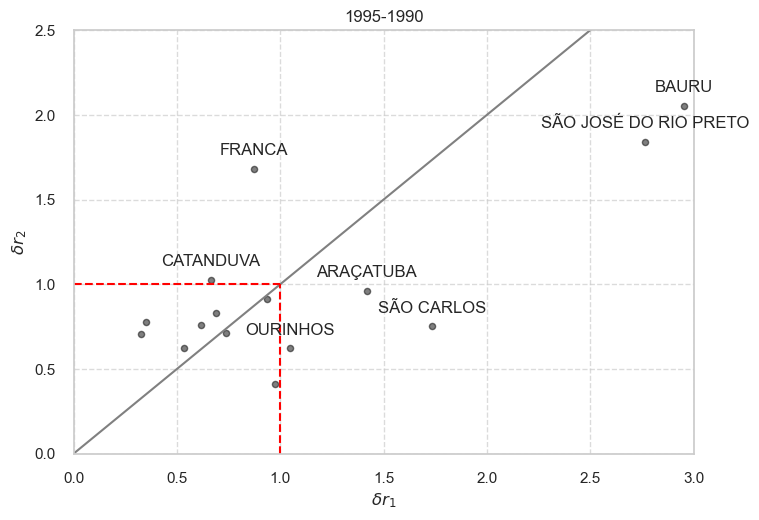

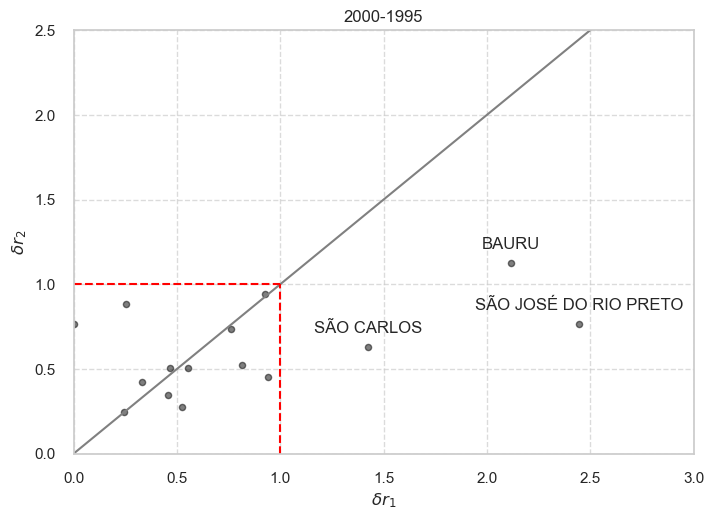

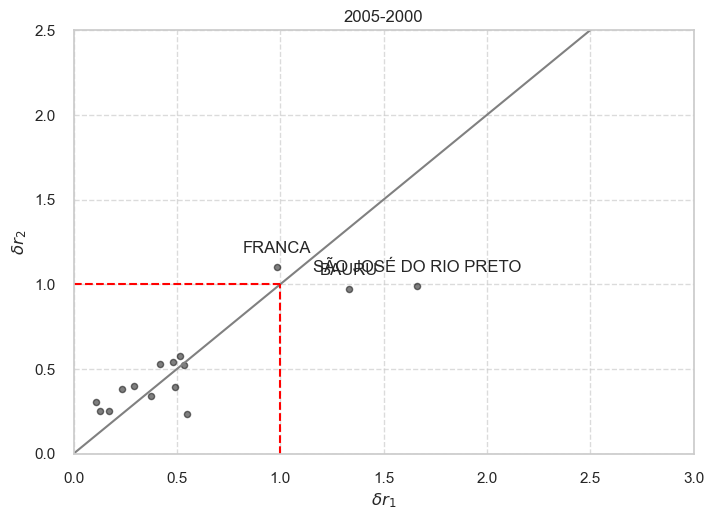

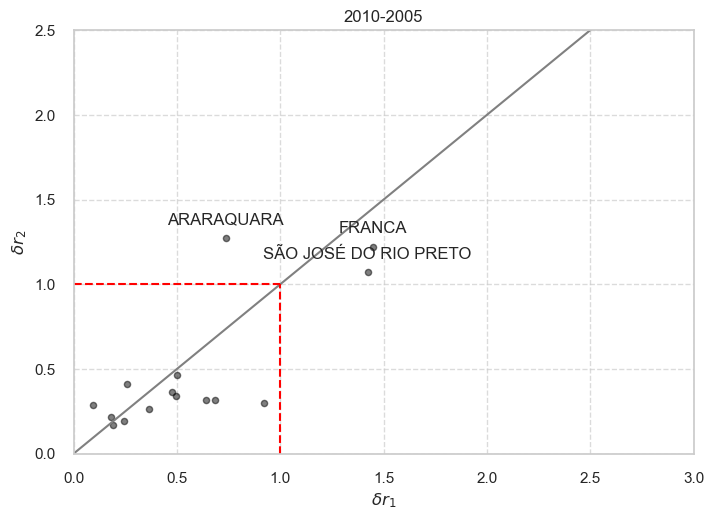

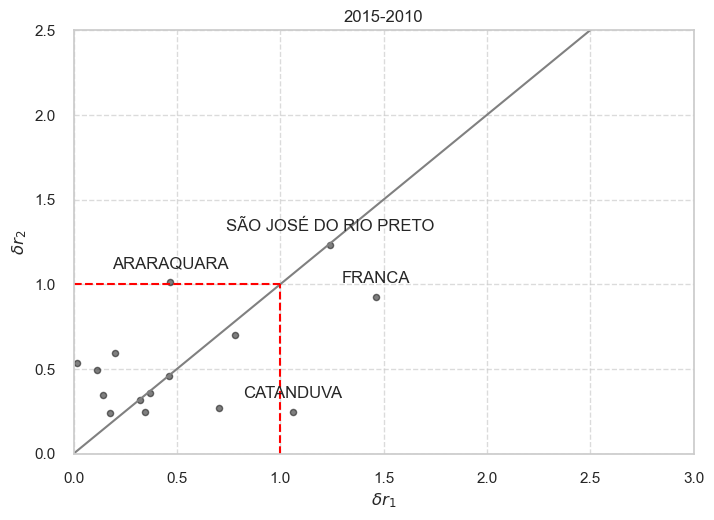

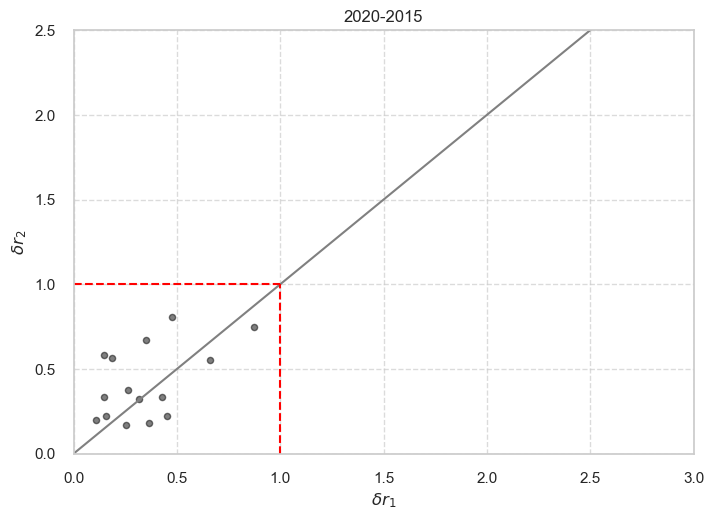

In [110]:
# Itera pelos intervalos e DataFrames
for interval, df in reversed(diff_coeffs.items()):

    # Cria um gráfico de dispersão
    ax = df.plot.scatter(x='Sr1', y='Sr2', title=interval, c='black', alpha=0.5)

    # Define os rótulos dos eixos
    ax.set_xlabel(r'$\delta r_{1}$')
    ax.set_ylabel(r'$\delta r_{2}$')

    # Define os limites dos eixos
    ax.set_xlim(0, 3)
    ax.set_ylim(0, 2.5)

    # Adiciona uma linha diagonal
    ax.plot([0, 3], [0, 3], color='gray', linestyle='-')

    # Adiciona uma linha vermelha tracejada
    ax.plot([1, 1], color='red', linestyle='--')
    ax.plot([1, 1], [0, 1], color='red', linestyle='--')
    
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

    # Anote com índice os pontos fora das linhas vermelhas tracejadas
    for index, row in df.iterrows():
        if row['Sr1'] > 1 and row['Sr2'] > 1 or (row['Sr1'] == 1 or row['Sr2'] > 1) or (row['Sr2'] == 1 or row['Sr1'] > 1):
            ax.annotate(index, (row['Sr1'], row['Sr2']), textcoords="offset points", xytext=(0, 10), ha='center')


#### Ajuste das curvas

In [111]:
# De um dicionário de Dataframes amplos para o formato DataFrame longo

# Cria uma lista vazia para armazenar DataFrames individuais
dfs_list = []

# Itera pelo dicionário e converte cada DataFrame em formato longo
for year, df in densities_dfs_dict.items():

    # Usa o método melt no DataFrame para convertê-lo em formato longo
    melted_df = df.melt(id_vars=['NM_MUNICIP'], var_name='Distance_km', value_name='Density')

    # Adiciona uma coluna 'Year'
    melted_df['Year'] = year

    # Anexa o DataFrame resultante à lista
    dfs_list.append(melted_df)

# Concatena todos os DataFrames da lista em um único DataFrame
unified_densities_df = pd.concat(dfs_list, ignore_index=True)

# Exibe as primeiras linhas do DataFrame unificado
unified_densities_df.head(3)

,NM_MUNICIP,Distance_km,Density,Year
0,ARARAQUARA,0km,1.0,1985
1,ARAÇATUBA,0km,1.0,1985
2,ASSIS,0km,1.0,1985


In [112]:
# Do dicionário de DataFrames amplos para o formato DataFrame longo

# Cria uma lista vazia para armazenar DataFrames individuais
dfs = []

# Itera pelos anos do dicionário
for year, df in smoothed_coeffs.items():

    # Adiciona uma coluna 'Year'
    df['Year'] = year

    # Anexa o DataFrame resultante à lista
    dfs.append(df)

# Concatena todos os DataFrames da lista em um único DataFrame
unified_coeffs_df = pd.concat(dfs, ignore_index=True)

# Reordena as colunas
unified_coeffs_df = unified_coeffs_df[['NM_MUNICIP', 'Year', 'alpha', 'c', 'D', 'SSR',
                              'SSM', 'SST', 'R²', 'r1', 'r2', 'f1',
                              'f2', 'ks', 'kp']]

# Exibe as primeiras linhas do DataFrame
unified_coeffs_df.head(3)

,NM_MUNICIP,Year,alpha,c,D,SSR,SSM,SST,R²,r1,r2,f1,f2,ks,kp
0,ARARAQUARA,1985,3.622040,-0.032035,4.829736,0.007007,0.899767,0.906773,0.992273,1.536833,3.292903,0.781905,0.186060,0.339306,0.363595
1,ARAÇATUBA,1985,3.812178,0.016193,4.591658,0.010017,0.934983,0.945000,0.989400,1.502711,3.088947,0.792097,0.224096,0.358081,0.345460
2,ASSIS,1985,4.827234,0.021492,4.020387,0.001703,1.025435,1.027138,0.998342,1.461776,2.558610,0.793217,0.228276,0.515065,0.272818


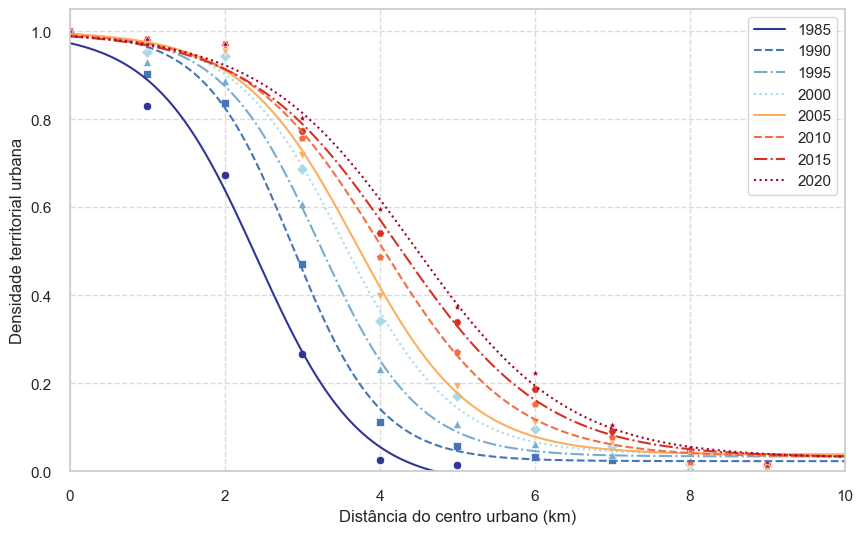

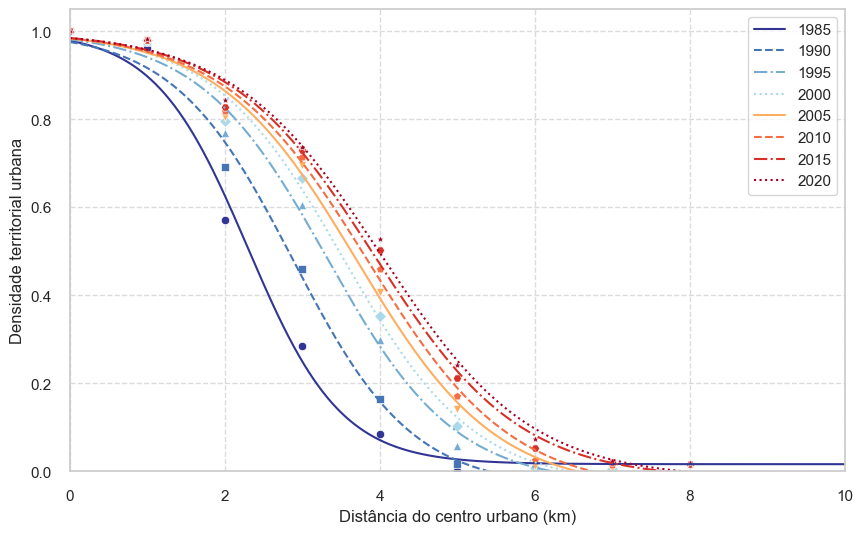

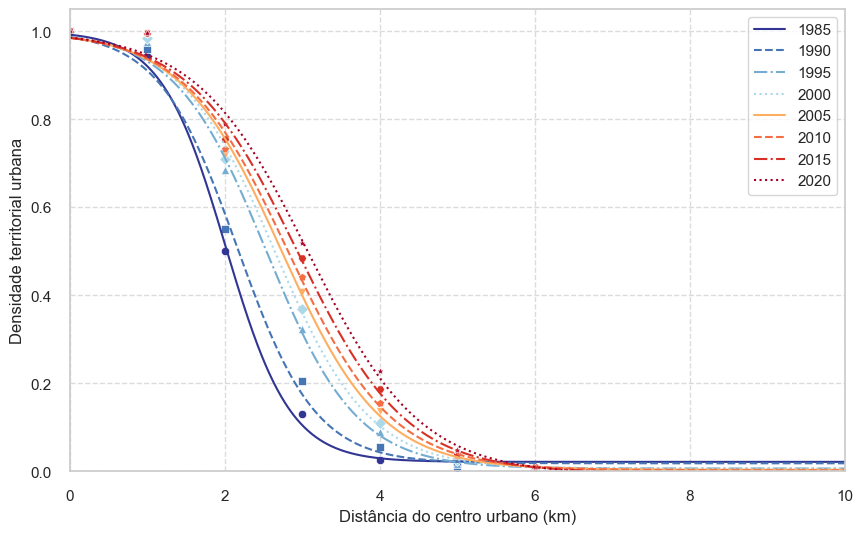

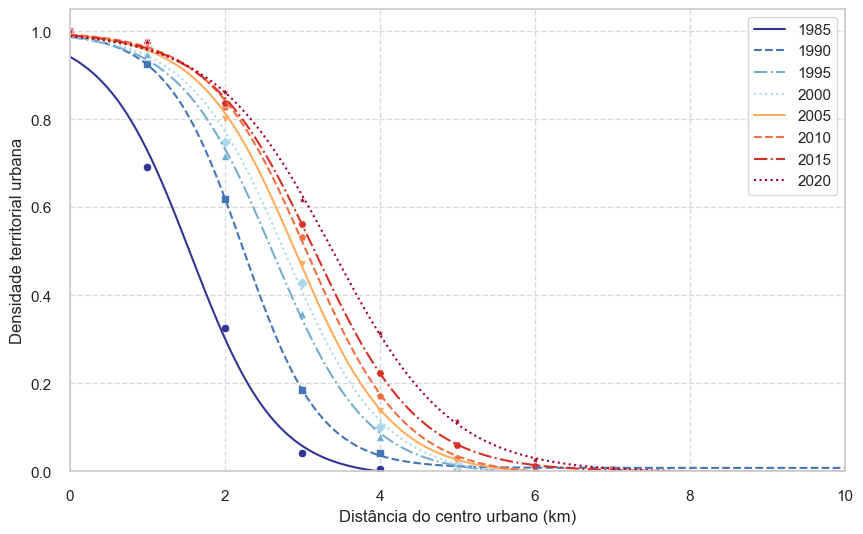

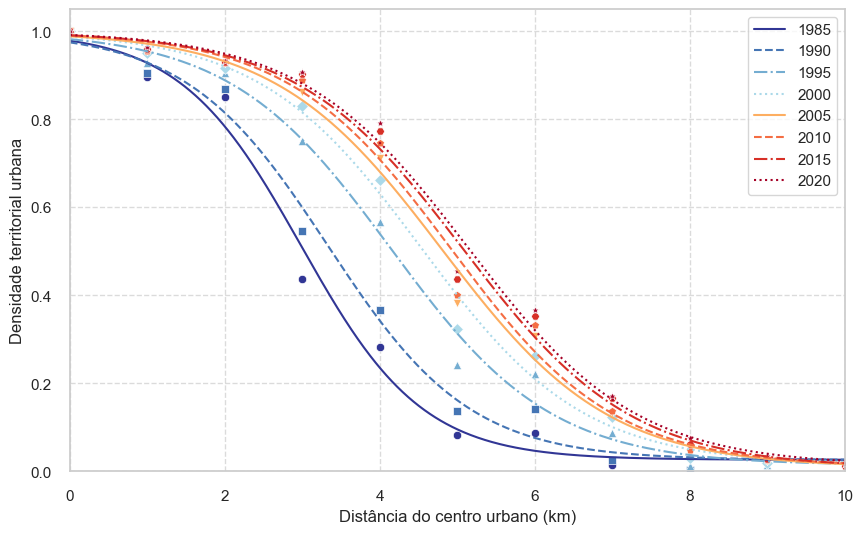

...

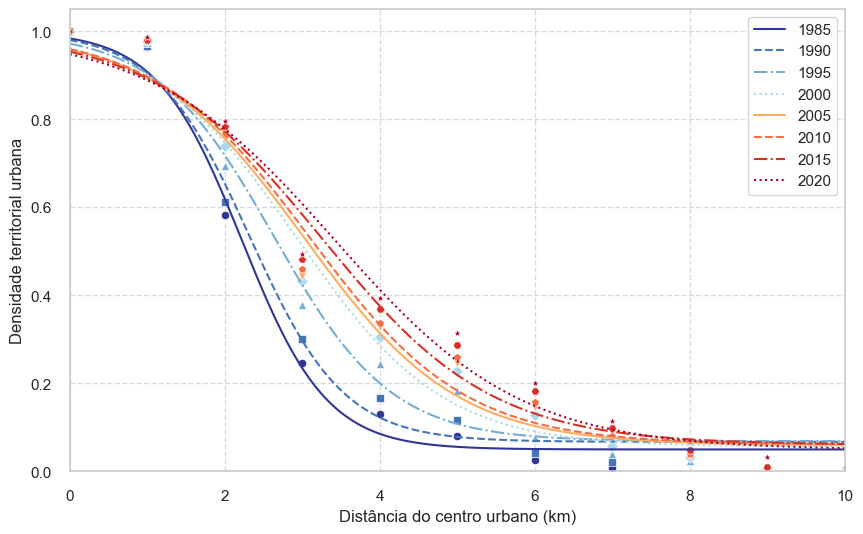

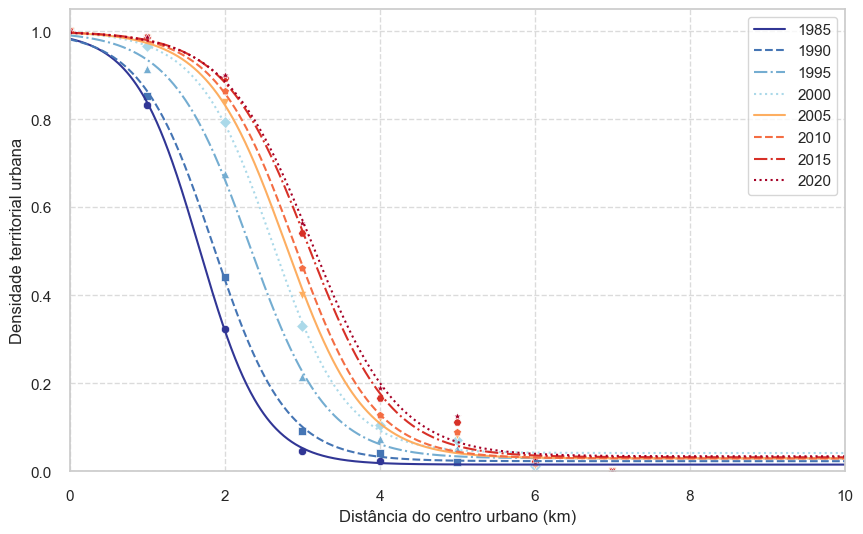

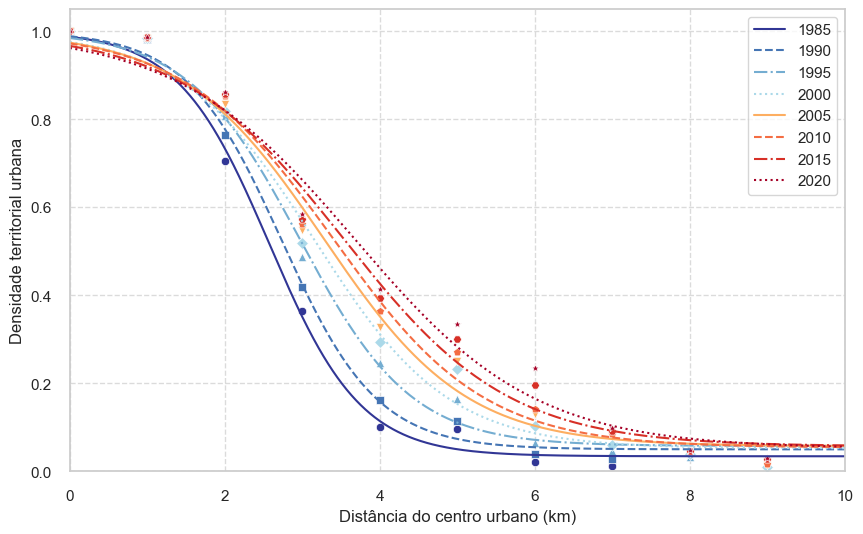

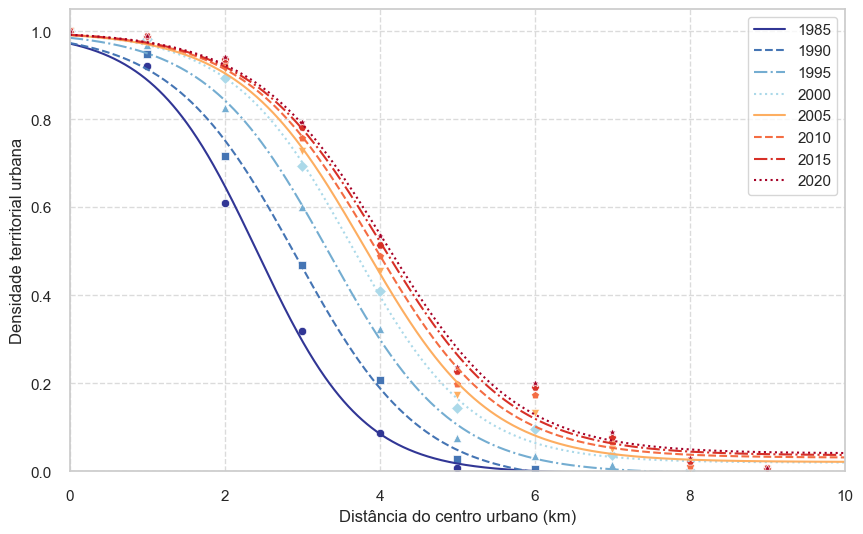

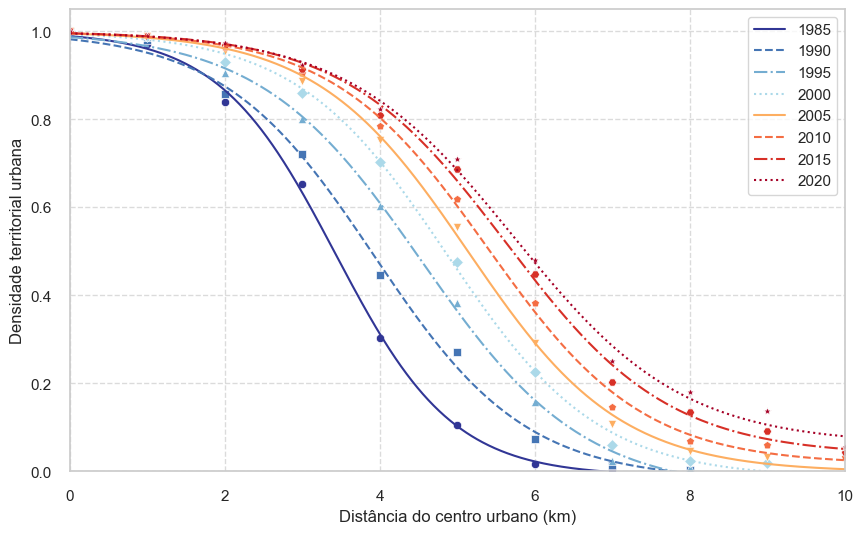

In [113]:
# Anos (1985 a 2020 em intervalos de 5 anos)
years_of_interest = np.arange(1985, 2021, 5)

# Distâncias (em quilômetros):
x_data = np.arange(0, 11, 1)

# Cria um eixo
x_high_res = np.linspace(0, 10, 1000)

# Defina cores personalizadas
custom_colors = ['#313695', '#4575b4', '#74add1', '#abd9e9',
                 '#fdae61', '#f46d43', '#d73027', '#a50026']


# Define um dicionário para mapear os anos como marcadores (símbolos)
year_marker_dict = {
    1985: 'o',
    1990: 's',
    1995: '^',
    2000: 'D',
    2005: 'v',
    2010: 'p',
    2015: 'H',
    2020: '*'
}

# Define um dicionário para mapear os anos como estilos de linhas
year_linestyle_dict = {
    1985: '-',
    1990: '--',
    1995: '-.',
    2000: ':',
    2005: '-',
    2010: '--',
    2015: '-.',
    2020: ':'
}

# Iterar pelas cidades no DataFrame
unique_cities = unified_densities_df['NM_MUNICIP'].unique()

for city in unique_cities:
    
    # Cria um gráfico para a cidade atual
    plt.figure(figsize=(10, 6))
    
    # plt.title(f'{city} (1985-2020)')
    plt.xlabel('Distância do centro urbano (km)')
    plt.ylabel('Densidade territorial urbana')
    
    plt.xlim(0, 10)
    plt.ylim(0, 1.05)

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    for year, color in zip(years_of_interest, custom_colors):
        
        # Extrai dados para a cidade e o ano atuais
        city_data = unified_densities_df.loc[
            (unified_densities_df['NM_MUNICIP'] == city) &
            (unified_densities_df['Year'] == year),
            'Density'
        ]

        # Verifica se há valores NaN e infinitos em x_data e city_data
        nan_indices_x = np.isnan(x_data)
        nan_indices_y = np.isnan(city_data)
        inf_indices_x = np.isinf(x_data)
        inf_indices_y = np.isinf(city_data)

        # Combina todos os índices com NaN ou valores infinitos
        invalid_indices = np.logical_or(np.logical_or(nan_indices_x, nan_indices_y),
                                        np.logical_or(inf_indices_x, inf_indices_y))

        # Remove linhas com valores inválidos de x_data e city_data
        x_data_cleaned = x_data[~invalid_indices]
        city_data_cleaned = city_data[~invalid_indices]

        # Calcula os coeficientes para o ano atual
        alpha = unified_coeffs_df.loc[
            (unified_coeffs_df['NM_MUNICIP'] == city) &
            (unified_coeffs_df['Year'] == year),
            'alpha'].values
        c = unified_coeffs_df.loc[
            (unified_coeffs_df['NM_MUNICIP'] == city) &
            (unified_coeffs_df['Year'] == year),
            'c'].values
        D = unified_coeffs_df.loc[
            (unified_coeffs_df['NM_MUNICIP'] == city) &
            (unified_coeffs_df['Year'] == year),
            'D'].values

        # Calcula dados suavizados para o ano atual
        y_smoothed = urban_land_density(x_high_res, alpha, c, D)

        # Gráfico de dispersão para dados com marcador personalizado
        sns.scatterplot(x=x_data_cleaned, y=city_data_cleaned, color=color,
                        marker=year_marker_dict[year])

        # Gráfico de linha para dados suavizados com estilo de linha personalizado
        sns.lineplot(x=x_high_res, y=y_smoothed, label=f'{year}',
                     color=color, linestyle=year_linestyle_dict[year])

    # Adiciona legenda para o ano atual
    plt.legend(frameon=True)

    # Salva o gráfico para a cidade atual
    plt.savefig(f'outputs/{city}.jpg', dpi=300)

    # Exibe o gráfico
    plt.show()

In [114]:
# Colunas como valores
cols = ['alpha', 'c', 'D',
        'SSR', 'SSM', 'SST', 'R²',
        'r1', 'r2', 'f1', 'f2', 'ks', 'kp']

# Remodela o DataFrame com módulo pivot
unified_coeffs_df_pivoted = unified_coeffs_df.pivot(index='NM_MUNICIP', columns='Year', values=cols)

# Adiciona prefixos aos nomes das colunas
unified_coeffs_df_pivoted.columns = unified_coeffs_df_pivoted.columns.map(lambda x: f'{x[0]}_{x[1]}')

# Exibe as dimensões do DataFrame após uso do método pivot
print(f'{unified_coeffs_df_pivoted.shape[0]} cities and {unified_coeffs_df_pivoted.shape[1]} variables (8 years x 13 columns):\n')

# Exibe o DataFrame após uso do método pivot
unified_coeffs_df_pivoted.head()

15 cities and 104 variables (8 years x 13 columns):



,alpha_1985,alpha_1990,alpha_1995,alpha_2000,alpha_2005,alpha_2010,alpha_2015,alpha_2020,c_1985,c_1990,...,ks_2015,ks_2020,kp_1985,kp_1990,kp_1995,kp_2000,kp_2005,kp_2010,kp_2015,kp_2020
NM_MUNICIP,,,,,,,,,,,,,,,,,,,,,
ARARAQUARA,3.622040,5.032964,5.052158,5.037927,4.993987,4.672658,4.419180,4.468936,-0.032035,0.023100,...,0.222046,0.214584,0.363595,0.261666,0.260672,0.261408,0.263709,0.281843,0.298009,0.294691
ARAÇATUBA,3.812178,3.734796,4.006830,4.164787,4.135794,4.152442,4.196270,4.192953,0.016193,-0.037716,...,0.238480,0.232671,0.345460,0.352618,0.328678,0.316212,0.318429,0.317152,0.313840,0.314088
ASSIS,4.827234,4.275457,4.308026,4.304708,4.227524,4.192967,4.196968,4.265862,0.021492,0.018191,...,0.313964,0.306050,0.272818,0.308027,0.305698,0.305934,0.311520,0.314087,0.313788,0.308720
BARRETOS,2.806045,4.496217,4.314612,4.422898,4.731226,4.884036,4.698113,4.451562,-0.012688,0.007761,...,0.325883,0.287826,0.469329,0.292903,0.305232,0.297759,0.278354,0.269645,0.280316,0.295842
BAURU,3.802923,3.631712,3.991751,4.337931,4.459314,4.668662,4.695372,4.769610,0.026231,0.025800,...,0.201023,0.200540,0.346301,0.362627,0.329920,0.303591,0.295327,0.282084,0.280480,0.276114


## Parte III

In [115]:
# Define as configurações globais dos gráficos
sns.set(style='whitegrid')

### Funções

Funções usadas na Parte III deste *notebook*.

In [116]:
def unite_dfs(original_df, column):
    
    """
    Concatenates a specific column from multiple DataFrames into a 
    new DataFrame.
    
    Parameters:
    - original_df (dict): Dictionary of DataFrames to be united.
    - column (str): Name of the column to be concatenated.

    Returns:
    - df_united (pd.DataFrame): New DataFrame with the specified column 
    from each input DataFrame.
    """
    
    df_united = pd.concat([original_df[key][column] for key in original_df.keys()], axis=1, keys=original_df.keys())
    return df_united

In [117]:
def plot_kde_columns(df, column_name, x_label, outliers):

    # Set the color palette
    sns.set_palette('tab10')

    # Plot KDE curves for each column
    plt.figure(figsize=(10, 6))
    sns.kdeplot(data=df[column_name], fill=False)

    # Customize the plot
    plt.xlabel(x_label)
    plt.ylabel('Densidade')

    # Add grid lines for better readability
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    # Adjust layout and display the plot
    plt.tight_layout()
    
    # Save the plot for the current coefficient
    plt.savefig(f'outputs/{column_name}_{outliers}_KDEs.jpg', dpi=300)

    # Disply the plot
    plt.show()

### Análise exploratória dos dados

Nesta seção é feita uma análise exploratória dos dados, com enfoque nas variáveis *Sprawl Ratio* (S<sub>r</sub>) e *Degree of Dispersion* (K<sub>ps</sub>).

#### Estatística descritiva

In [118]:
# Adiciona coluna a cada df do dicionário
for key in diff_coeffs:
    diff_coeffs[key]['kps'] = sprawling_degree[key]

# Exibe cada df
for interval, df in diff_coeffs.items():
    print(f'\n{interval}:\n{df}')


2020-2015:
                       delta_r1  delta_r2       Sr2       Sr1        Sr  \
NM_MUNICIP                                                                
ARARAQUARA             0.158896  0.251940  0.746926  0.871043  0.857508   
ARAÇATUBA              0.061501  0.120669  0.325139  0.317305  1.024690   
ASSIS                  0.110825  0.166716  0.336265  0.427965  0.785730   
BARRETOS               0.117360  0.355372  0.808501  0.474999  1.702110   
BAURU                  0.069584  0.061388  0.224404  0.452670  0.495734   
BIRIGUI                0.038292  0.143494  0.333444  0.147997  2.253048   
BOTUCATU               0.061265  0.213351  0.377434  0.265135  1.423550   
CATANDUVA              0.090642  0.071598  0.179051  0.365338  0.490097   
FRANCA                 0.101699  0.165729  0.551456  0.662264  0.832683   
JAÚ                    0.039287  0.109631  0.219748  0.159085  1.381323   
MARÍLIA                0.039423  0.312016  0.563166  0.185006  3.044046   
OURINHOS     

In [119]:
# Crie um dicionário vazio para armazenar as estatísticas para cada intervalo
summary_stats = {}

# Itera por cada intervalo e anexa estatísticas ao dicionário
for interval, df in diff_coeffs.items():
    summary_stats[interval] = df[['Sr', 'kps']].describe().stack()

# Converte dicionário em um DataFrame DataFrame do Pandas
summary_df = pd.DataFrame(summary_stats).T[::-1]

# Formata o índice
summary_df.index = [f'{end}-{start}' for start, end in (index.split('-') for index in summary_df.index)]

# Exibe o df resultante
summary_df.round(4)

count           mean              std             min          \
             Sr   kps       Sr     kps       Sr     kps      Sr     kps   
1985-1990  15.0  15.0   2.2495  0.9738   3.4978  0.1412  0.2649  0.6241   
1990-1995  15.0  15.0   1.1258  0.9931   0.5959  0.0947  0.4206  0.8517   
1995-2000  15.0  15.0  25.0321  0.9796  93.2398  0.0756  0.3133  0.8576   
2000-2005  15.0  15.0   1.2239  0.9988   0.6018  0.0292  0.4251  0.9348   
2005-2010  15.0  15.0   1.0183  0.9880   0.6936  0.0367  0.3223  0.9227   
2010-2015  15.0  15.0   3.5971  0.9984   8.4364  0.0562  0.2329  0.8524   
2015-2020  15.0  15.0   1.5098  1.0095   0.9859  0.0261  0.4901  0.9636   

              25%             50%             75%               max          
               Sr     kps      Sr     kps      Sr     kps        Sr     kps  
1985-1990  0.6606  0.9417  0.9615  0.9941  1.7564  1.0537   13.9797  1.1291  
1990-1995  0.6715  0.9153  0.9803  0.9962  1.3907  1.0617    2.2038  1.1440  
1995-2000  0.5260  0.9365  0.9066  0.9867  1.0475  1.0057  362.0630  1.1275  
2000-2005  0.8572  0.9825  1.1205  1.0088  1.4257  1.0190    2.8351  1.0349  
2005-2010  0.7015  0.9709  0.7761  0.9868  1.0734  1.0026    3.1006  1.0688  
2010-2015  0.8033  0.9919  0.9882  0.9990  2.3185  1.0420   33.8249  1.0577  
2015-2020  0.8092  0.9897  1.3813  1.0096  1.8748  1.0292    3.9460  1.0554

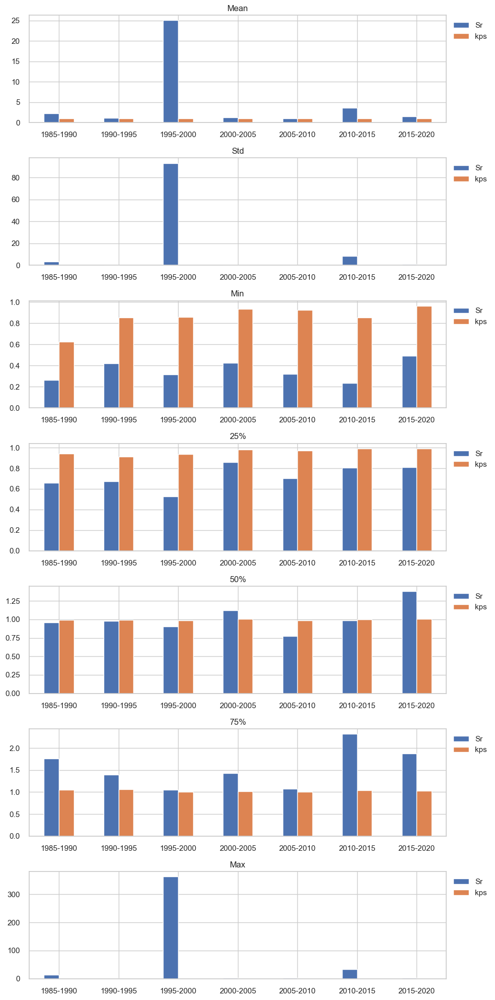

In [120]:
# Cria subplots
fig, axes = plt.subplots(nrows=7, ncols=1, figsize=(10, 20))

# Plota cada estatística em um subplot separado
for i, stat in enumerate(['mean', 'std', 'min', '25%', '50%', '75%', 'max']):
    plot = summary_df[stat].plot(kind='bar', ax=axes[i], title=stat.capitalize())
    plot.tick_params(axis='x', rotation=0)
    plot.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Ajusta o layout e exibe os gráficos
plt.tight_layout()
plt.show()

In [121]:
# Inverte ordem das chaves do dicionário
diff_coeffs_inv = {f'{end}-{start}': diff_coeffs[key] for key in diff_coeffs for start, end in (key.split('-'),)}

# Exibe dicionário com chaves invertidas
for interval, df in diff_coeffs_inv.items():
    print(f'{interval}:\n{df[["Sr", "kps"]].head(3)}')

2015-2020:
                  Sr       kps
NM_MUNICIP                    
ARARAQUARA  0.857508  0.988866
ARAÇATUBA   1.024690  1.000791
ASSIS       0.785730  0.983850
2010-2015:
                  Sr       kps
NM_MUNICIP                    
ARARAQUARA  2.170307  1.057359
ARAÇATUBA   0.709434  0.989556
ASSIS       0.984693  0.999047
2005-2010:
                  Sr       kps
NM_MUNICIP                    
ARARAQUARA  1.726784  1.068768
ARAÇATUBA   0.927233  0.995991
ASSIS       1.219621  1.008242
2000-2005:
                  Sr       kps
NM_MUNICIP                    
ARARAQUARA  1.124428  1.008799
ARAÇATUBA   1.112055  1.007010
ASSIS       1.470705  1.018257
1995-2000:
                  Sr       kps
NM_MUNICIP                    
ARARAQUARA  1.018024  1.002825
ARAÇATUBA   0.642828  0.962073
ASSIS       1.012832  1.000771
1990-1995:
                  Sr       kps
NM_MUNICIP                    
ARARAQUARA  0.980324  0.996201
ARAÇATUBA   0.677652  0.932107
ASSIS       0.965558  0.992440
1985

In [122]:
# Cria um dicionário vazio para armazenar DataFrames
dfs_dict = {}

# Especifica colunas a serem processadas
cols = ['Sr1', 'Sr2', 'Sr', 'kps']

# Preenche dicionário com DataFrames
for col in cols:
    dfs_dict[col] = unite_dfs(original_df=diff_coeffs_inv, 
                              # Invert the order of columns and use 4 decimals
                              column=col).iloc[:, ::-1].round(4)

In [123]:
# Exibe o primeiro df resultante
dfs_dict['Sr1']

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
NM_MUNICIP,,,,,,,
ARARAQUARA,1.9238,0.9340,0.9281,0.4814,0.7365,0.4669,0.8710
ARAÇATUBA,1.1131,1.4183,0.8172,0.5170,0.4998,0.3444,0.3173
ASSIS,0.0829,0.7383,0.2448,0.1708,0.1795,0.3235,0.4280
BARRETOS,1.7319,0.6877,0.4571,0.5484,0.4945,0.1410,0.4750
BAURU,0.6918,2.9549,2.1164,1.3334,0.9232,0.7800,0.4527
BIRIGUI,0.5913,0.5330,0.3300,0.3763,0.6854,0.7042,0.1480
BOTUCATU,0.7177,0.9750,0.5262,0.1079,0.2450,0.2025,0.2651
CATANDUVA,0.0154,0.6626,0.5561,0.4177,0.6405,1.0619,0.3653
FRANCA,1.3144,0.8708,0.7601,0.9843,1.4467,1.4616,0.6623


In [124]:
# Exibe o primeiro df resultante
dfs_dict['Sr2']

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
NM_MUNICIP,,,,,,,
ARARAQUARA,0.5096,0.9156,0.9448,0.5413,1.2718,1.0133,0.7469
ARAÇATUBA,1.2077,0.9611,0.5253,0.5750,0.4635,0.2443,0.3251
ASSIS,0.3885,0.7129,0.2480,0.2512,0.2190,0.3186,0.3363
BARRETOS,0.5006,0.8324,0.3481,0.2331,0.3387,0.3478,0.8085
BAURU,1.0160,2.0535,1.1282,0.9736,0.2976,0.6998,0.2244
BIRIGUI,0.5279,0.6267,0.4223,0.3426,0.3152,0.2724,0.3334
BOTUCATU,0.3700,0.4101,0.2731,0.3058,0.1902,0.5930,0.3774
CATANDUVA,0.2149,1.0279,0.5041,0.5267,0.3196,0.2473,0.1791
FRANCA,0.6891,1.6823,0.7361,1.1029,1.2229,0.9248,0.5515


In [125]:
# Exibe o primeiro df resultante
dfs_dict['Sr']

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
NM_MUNICIP,,,,,,,
ARARAQUARA,0.2649,0.9803,1.0180,1.1244,1.7268,2.1703,0.8575
ARAÇATUBA,1.0850,0.6777,0.6428,1.1121,0.9272,0.7094,1.0247
ASSIS,4.6885,0.9656,1.0128,1.4707,1.2196,0.9847,0.7857
BARRETOS,0.2891,1.2104,0.7615,0.4251,0.6849,2.4667,1.7021
BAURU,1.4686,0.6950,0.5331,0.7301,0.3223,0.8972,0.4957
BIRIGUI,0.8927,1.1757,1.2799,0.9102,0.4598,0.3869,2.2530
BOTUCATU,0.5156,0.4206,0.5190,2.8351,0.7761,2.9290,1.4236
CATANDUVA,13.9797,1.5513,0.9066,1.2609,0.4990,0.2329,0.4901
FRANCA,0.5242,1.9318,0.9684,1.1205,0.8453,0.6327,0.8327


In [126]:
# Exibe o primeiro df resultante
dfs_dict['kps']

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
NM_MUNICIP,,,,,,,
ARARAQUARA,0.7197,0.9962,1.0028,1.0088,1.0688,1.0574,0.9889
ARAÇATUBA,1.0207,0.9321,0.9621,1.0070,0.9960,0.9896,1.0008
ASSIS,1.1291,0.9924,1.0008,1.0183,1.0082,0.9990,0.9838
BARRETOS,0.6241,1.0421,0.9755,0.9348,0.9687,1.0396,1.0554
BAURU,1.0471,0.9098,0.9202,0.9728,0.9552,0.9943,0.9844
BIRIGUI,0.9715,1.0320,1.0250,0.9921,0.9227,0.9129,1.0378
BOTUCATU,0.9118,0.8850,0.9527,1.0349,0.9913,1.0566,1.0138
CATANDUVA,1.1122,1.1440,0.9867,1.0241,0.9388,0.8524,0.9636
FRANCA,0.9069,1.1050,0.9977,1.0101,0.9836,0.9650,0.9931


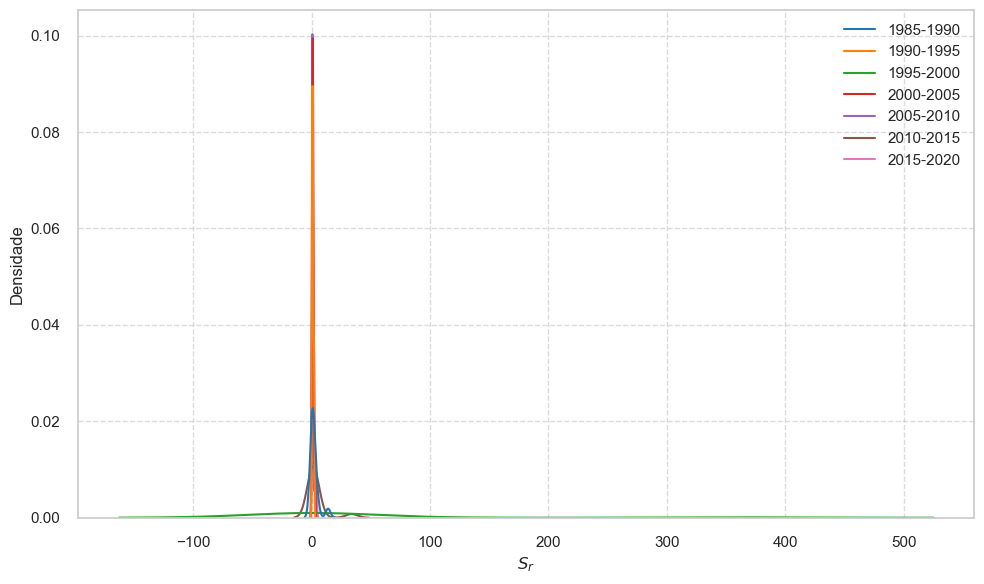

In [127]:
# Gráfico do Sr
plot_kde_columns(df=dfs_dict, column_name='Sr', x_label=r'$S_{r}$', outliers='with_outliers')

#### *Outliers*

In [128]:
# Crie um novo dicionário para valores redimensionados
scaled_df = {}

# Itera pelo dicionário e dimensiona as colunas 'Sr' e 'kps' usando maxabs_scale
for interval, df in diff_coeffs_inv.items():
    
    # Mantém o índice
    scaled_data = pd.DataFrame(index=df.index)
    
    # Mantém as colunas 'Sr' e 'kp' originais
    scaled_data['Sr'] = df['Sr']
    scaled_data['kps'] = df['kps']
    
    # Converte valores irrazoáveis de Sr em NaN
    scaled_data.loc[scaled_data['Sr'] > 10.000000, 'Sr'] = np.nan

    # Adiciona a coluna scaled Sr
    scaled_data['scaled_Sr'] = maxabs_scale(scaled_data['Sr'])
    scaled_data['scaled_kps'] = maxabs_scale(scaled_data['kps'])
    
    # Preenche o dicionário vazio
    scaled_df[interval] = scaled_data
    
# Exibe os DataFrames modificados
for key, df in scaled_df.items():
    print(f'\n{key}:\n{df}')


2015-2020:
                             Sr       kps  scaled_Sr  scaled_kps
NM_MUNICIP                                                      
ARARAQUARA             0.857508  0.988866   0.217312    0.936972
ARAÇATUBA              1.024690  1.000791   0.259680    0.948271
ASSIS                  0.785730  0.983850   0.199122    0.932219
BARRETOS               1.702110  1.055385   0.431354    1.000000
BAURU                  0.495734  0.984435   0.125631    0.932773
BIRIGUI                2.253048  1.037777   0.570975    0.983315
BOTUCATU               1.423550  1.013777   0.360761    0.960576
CATANDUVA              0.490097  0.963615   0.124202    0.913046
FRANCA                 0.832683  0.993114   0.211021    0.940997
JAÚ                    1.381323  1.009566   0.350059    0.956585
MARÍLIA                3.044046  1.038237   0.771432    0.983752
OURINHOS               1.816989  1.020375   0.460467    0.966827
PRESIDENTE PRUDENTE    3.945969  1.041959   1.000000    0.987278
SÃO CARLOS   

In [129]:
# Exibe os DataFrames modificados após dropna
for key, df in scaled_df.items():
    df.dropna(inplace=True)
    print(f'\n{key}:\n{df}')


2015-2020:
                             Sr       kps  scaled_Sr  scaled_kps
NM_MUNICIP                                                      
ARARAQUARA             0.857508  0.988866   0.217312    0.936972
ARAÇATUBA              1.024690  1.000791   0.259680    0.948271
ASSIS                  0.785730  0.983850   0.199122    0.932219
BARRETOS               1.702110  1.055385   0.431354    1.000000
BAURU                  0.495734  0.984435   0.125631    0.932773
BIRIGUI                2.253048  1.037777   0.570975    0.983315
BOTUCATU               1.423550  1.013777   0.360761    0.960576
CATANDUVA              0.490097  0.963615   0.124202    0.913046
FRANCA                 0.832683  0.993114   0.211021    0.940997
JAÚ                    1.381323  1.009566   0.350059    0.956585
MARÍLIA                3.044046  1.038237   0.771432    0.983752
OURINHOS               1.816989  1.020375   0.460467    0.966827
PRESIDENTE PRUDENTE    3.945969  1.041959   1.000000    0.987278
SÃO CARLOS   

In [130]:
# Cria um dicionário vazio para armazenar as estatísticas para cada intervalo
summary_stats_outliers = {}

# Itera por cada intervalo e anexa estatísticas ao dicionário
for interval, df in scaled_df.items():
    summary_stats_outliers[interval] = df[['Sr', 'kps']].describe().stack()

# Converte o dicionário em um DataFrame do Pandas
summary_df_outliers = pd.DataFrame(summary_stats_outliers).T[::-1]

# Formata o índice
summary_df_outliers.index = [f'{end}-{start}' for start, end in (index.split('-') for index in summary_df_outliers.index)]

# Exibe o df resultante
summary_df_outliers.round(4)

count          mean             std             min             25%  \
             Sr   kps      Sr     kps      Sr     kps      Sr     kps      Sr   
1990-1985  14.0  14.0  1.4117  0.9639  1.3547  0.1411  0.2649  0.6241  0.5924   
1995-1990  15.0  15.0  1.1258  0.9931  0.5959  0.0947  0.4206  0.8517  0.6715   
2000-1995  14.0  14.0  0.9585  0.9691  0.7755  0.0660  0.3133  0.8576  0.5225   
2005-2000  15.0  15.0  1.2239  0.9988  0.6018  0.0292  0.4251  0.9348  0.8572   
2010-2005  15.0  15.0  1.0183  0.9880  0.6936  0.0367  0.3223  0.9227  0.7015   
2015-2010  14.0  14.0  1.4380  0.9942  1.1582  0.0558  0.2329  0.8524  0.7564   
2020-2015  15.0  15.0  1.5098  1.0095  0.9859  0.0261  0.4901  0.9636  0.8092   

                      50%             75%             max          
              kps      Sr     kps      Sr     kps      Sr     kps  
1990-1985  0.9267  0.9369  0.9877  1.4028  1.0415  4.6885  1.1291  
1995-1990  0.9153  0.9803  0.9962  1.3907  1.0617  2.2038  1.1440  
2000-1995  0.9283  0.8340  0.9811  1.0167  1.0023  3.4624  1.1075  
2005-2000  0.9825  1.1205  1.0088  1.4257  1.0190  2.8351  1.0349  
2010-2005  0.9709  0.7761  0.9868  1.0734  1.0026  3.1006  1.0688  
2015-2010  0.9907  0.9864  0.9989  1.9720  1.0325  4.3976  1.0574  
2020-2015  0.9897  1.3813  1.0096  1.8748  1.0292  3.9460  1.0554

In [131]:
# Cria um dicionário vazio para armazenar DataFrames
Sr_kp_out_dict = {}

# Especifica as colunas a serem processadas
cols = ['Sr', 'kps']

# Preenche o dicionário com os DataFrames processados
for col in cols:
    Sr_kp_out_dict[col] = unite_dfs(original_df=scaled_df, 
                              # Invert the order of columns and use 4 decimals
                              column=col).iloc[:, ::-1].round(4)

In [132]:
# Sr
Sr_kp_out_dict['Sr']

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
NM_MUNICIP,,,,,,,
ARARAQUARA,0.2649,0.9803,1.0180,1.1244,1.7268,2.1703,0.8575
ARAÇATUBA,1.0850,0.6777,0.6428,1.1121,0.9272,0.7094,1.0247
ASSIS,4.6885,0.9656,1.0128,1.4707,1.2196,0.9847,0.7857
BARRETOS,0.2891,1.2104,0.7615,0.4251,0.6849,2.4667,1.7021
BAURU,1.4686,0.6950,0.5331,0.7301,0.3223,0.8972,0.4957
BIRIGUI,0.8927,1.1757,1.2799,0.9102,0.4598,0.3869,2.2530
BOTUCATU,0.5156,0.4206,0.5190,2.8351,0.7761,2.9290,1.4236
CATANDUVA,NaN,1.5513,0.9066,1.2609,0.4990,0.2329,0.4901
FRANCA,0.5242,1.9318,0.9684,1.1205,0.8453,0.6327,0.8327


In [133]:
# kp
Sr_kp_out_dict['kps']

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
NM_MUNICIP,,,,,,,
ARARAQUARA,0.7197,0.9962,1.0028,1.0088,1.0688,1.0574,0.9889
ARAÇATUBA,1.0207,0.9321,0.9621,1.0070,0.9960,0.9896,1.0008
ASSIS,1.1291,0.9924,1.0008,1.0183,1.0082,0.9990,0.9838
BARRETOS,0.6241,1.0421,0.9755,0.9348,0.9687,1.0396,1.0554
BAURU,1.0471,0.9098,0.9202,0.9728,0.9552,0.9943,0.9844
BIRIGUI,0.9715,1.0320,1.0250,0.9921,0.9227,0.9129,1.0378
BOTUCATU,0.9118,0.8850,0.9527,1.0349,0.9913,1.0566,1.0138
CATANDUVA,NaN,1.1440,0.9867,1.0241,0.9388,0.8524,0.9636
FRANCA,0.9069,1.1050,0.9977,1.0101,0.9836,0.9650,0.9931


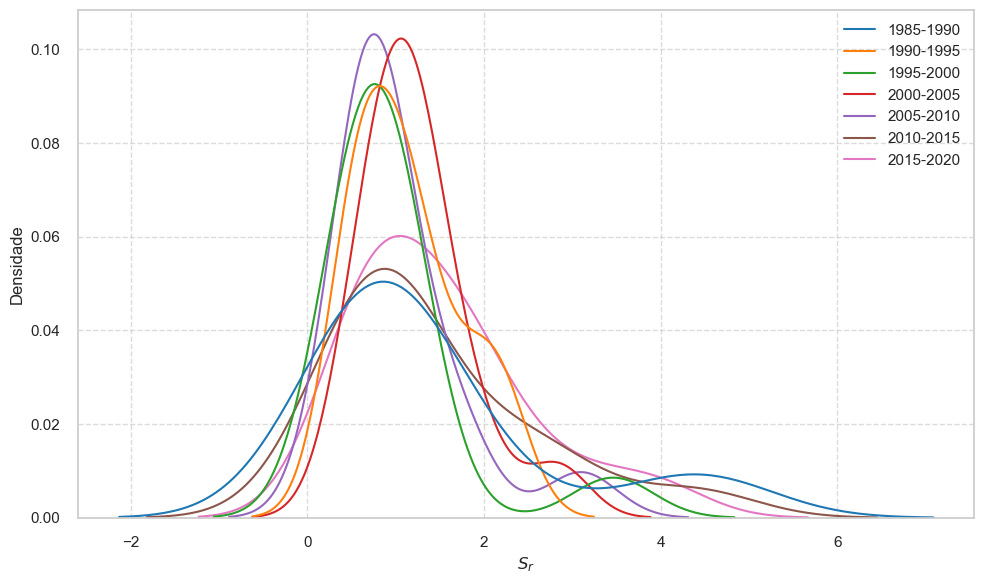

In [134]:
# Sr
plot_kde_columns(df=Sr_kp_out_dict, column_name='Sr', x_label=r'$S_{r}$', outliers='without_outliers')

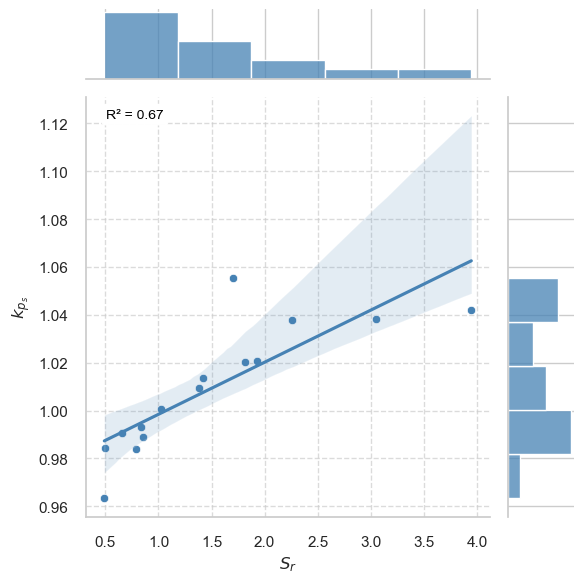

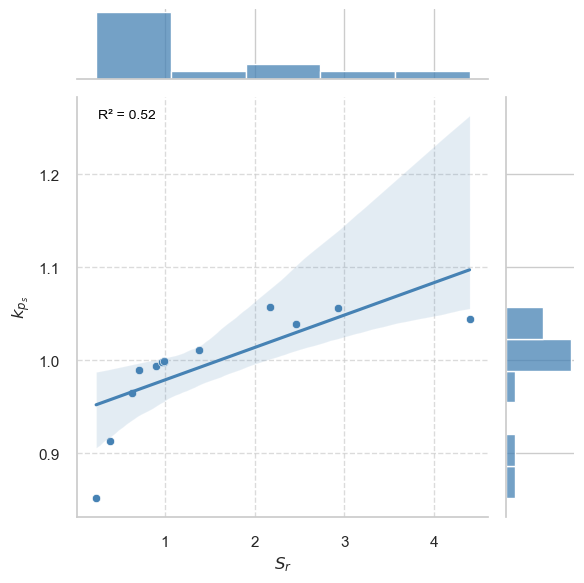

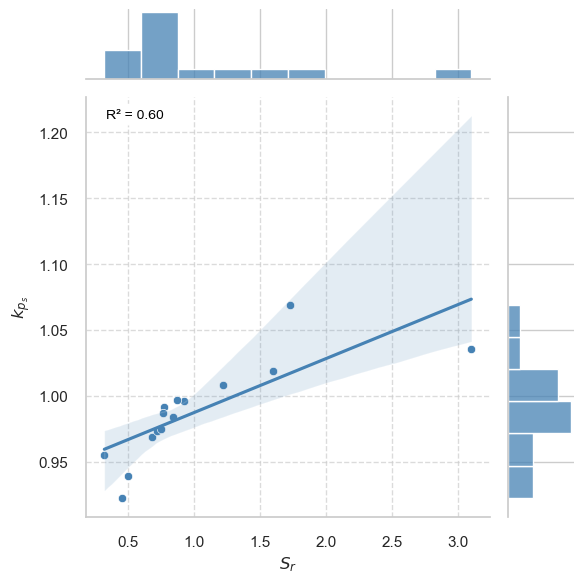

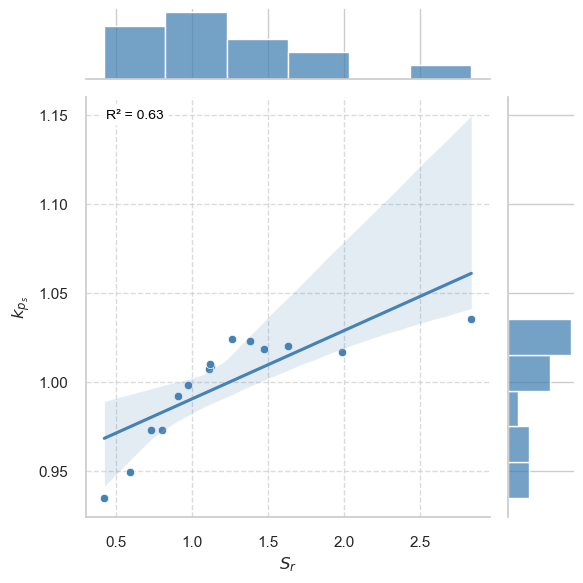

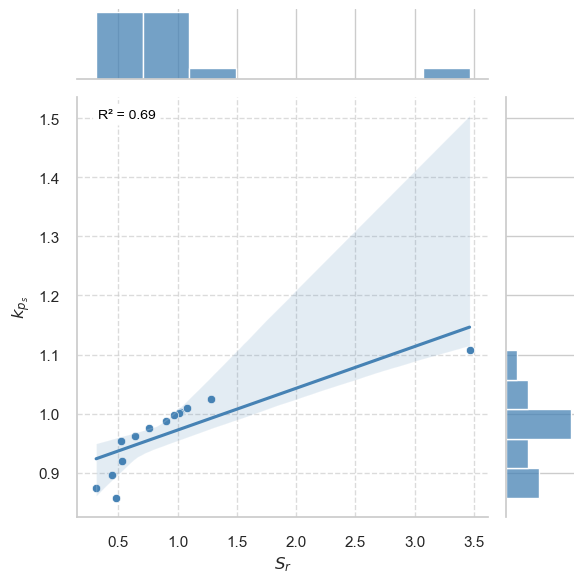

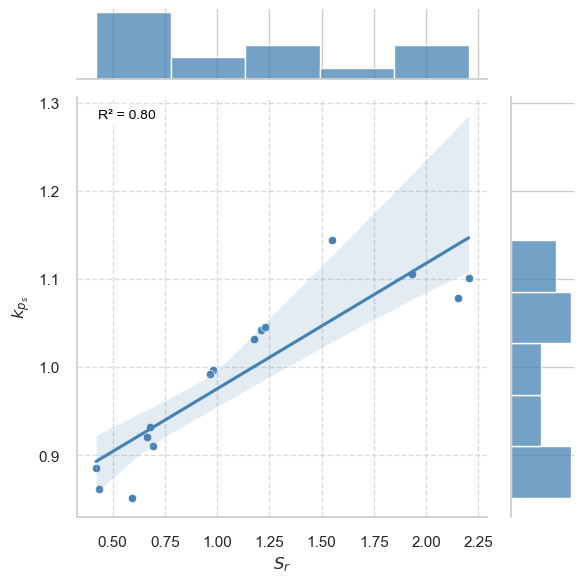

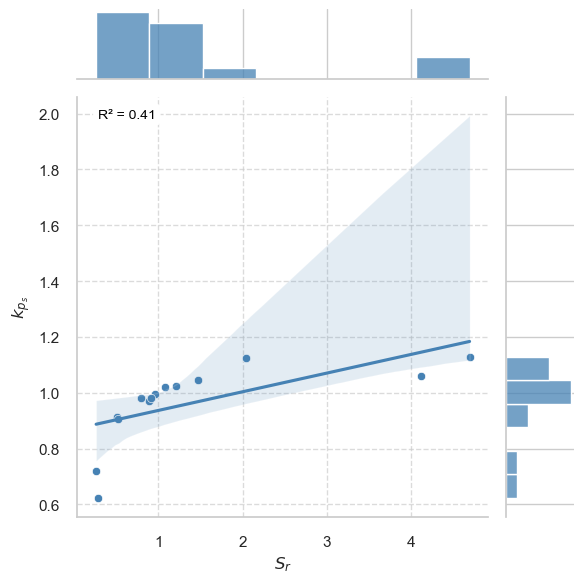

In [135]:
for interval, df in scaled_df.items():

    # Joint plot para 'Sr' e 'kp' com linha de regressão
    joint_plot = sns.jointplot(data=df, x='Sr', y='kps', kind='scatter', color='steelblue')
    
    # Adiciona linha de regressão
    sns.regplot(data=df, x='Sr', y='kps', scatter=False, ax=joint_plot.ax_joint, color='steelblue')

    # Calcula e anota R²
    corr_coefficient, _ = pearsonr(df['Sr'], df['kps'])
    r_squared = corr_coefficient ** 2
    plt.annotate(f'R² = {r_squared:.2f}', xy=(0.05, 0.95), 
                 xycoords='axes fraction', fontsize=10, 
                 color='black', bbox=dict(boxstyle='round', facecolor='white'))

    # plt.suptitle(f'{interval}')

    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.xlabel(r'$S_{r}$')
    plt.ylabel(r'$k_{p_s}$')

    plt.tight_layout()
    
    # Salva o gráfico para o intervalo atual
    plt.savefig(f'outputs/{interval}_corr_Sr_kps.jpg', dpi=300)
    plt.show()
    print()

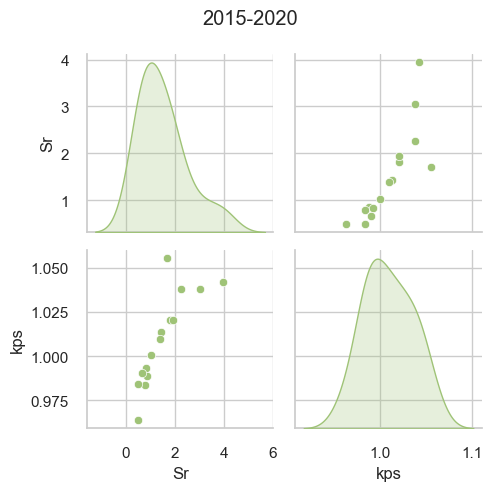

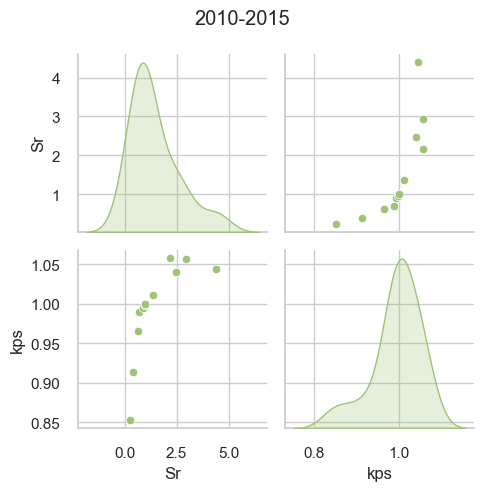

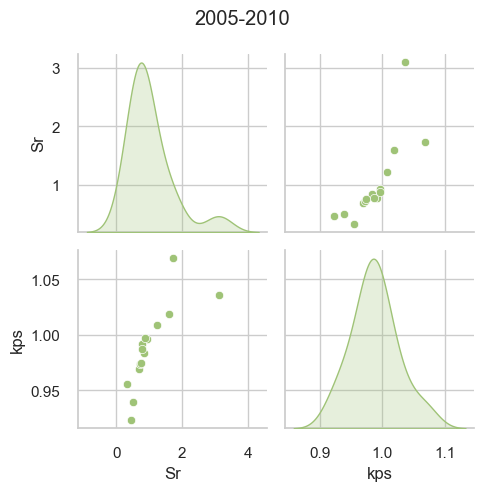

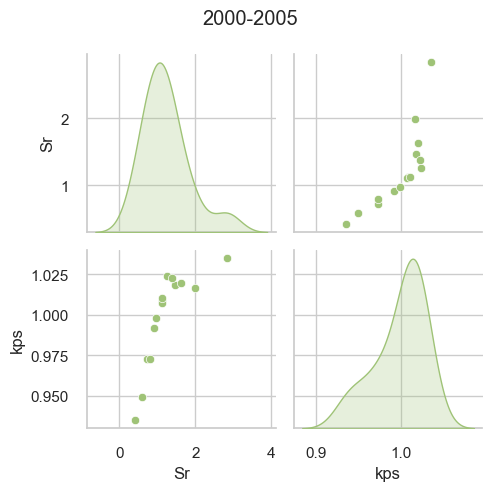

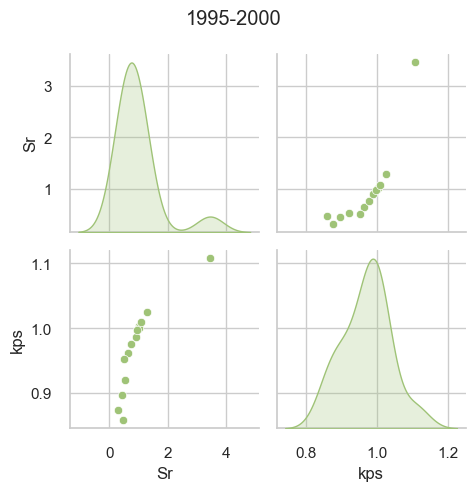

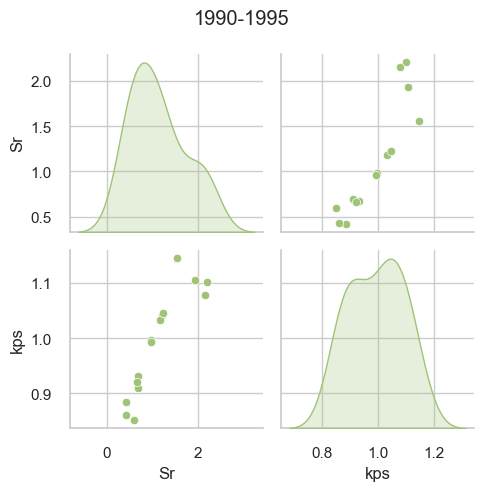

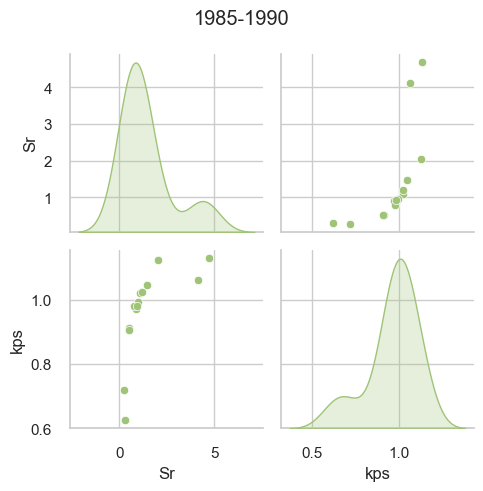

In [136]:
for interval, df in scaled_df.items():
    
    # Define cor
    custom_color = '#9fc377'

    # Define cor personalizada para todos os elementos
    sns.set_palette(sns.color_palette([custom_color]))

    # Cria um pair plot para 'Sr' e 'kp'
    sns.pairplot(df[['Sr', 'kps']], diag_kind='kde')
    
    # Define o título
    plt.suptitle(f'{interval}')

    # Ajusta o layout e exibe o gráfico
    plt.tight_layout()

    # Salva o gráfico para o intervalo atual
    # plt.savefig(f'outputs/{interval}_pairplot_Sr_kps.jpg', dpi=300)

    # Exibe o gráfico
    plt.show()
    print()

2015-2020:

Outliers Sr - standard deviation (std):

NM_MUNICIP
PRESIDENTE PRUDENTE    1.0
Name: scaled_Sr, dtype: float64

Outliers Sr - interquartile interval (iqr):

NM_MUNICIP
PRESIDENTE PRUDENTE    1.0
Name: scaled_Sr, dtype: float64

2015-2020:

Outliers Kp - standard deviation (std):

Series([], Name: scaled_kps, dtype: float64)

Outliers Kp - interquartile interval (iqr):

Series([], Name: scaled_kps, dtype: float64)



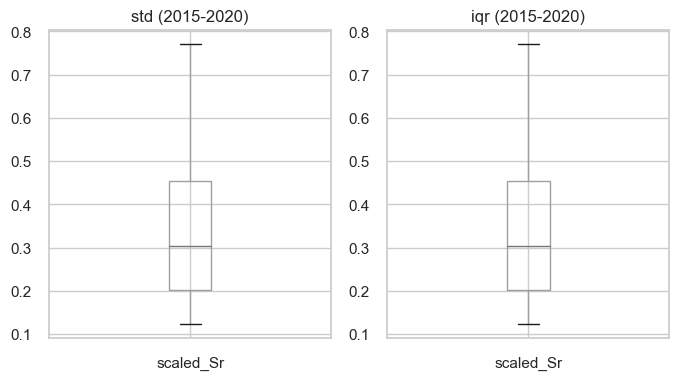

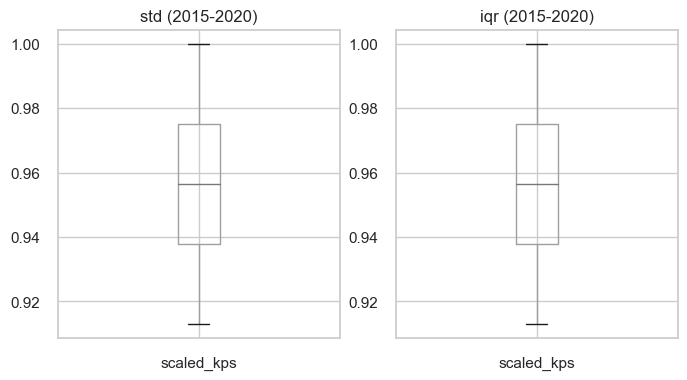


2010-2015:

Outliers Sr - standard deviation (std):

NM_MUNICIP
MARÍLIA    1.0
Name: scaled_Sr, dtype: float64

Outliers Sr - interquartile interval (iqr):

NM_MUNICIP
MARÍLIA    1.0
Name: scaled_Sr, dtype: float64

2010-2015:

Outliers Kp - standard deviation (std):

NM_MUNICIP
CATANDUVA    0.805882
Name: scaled_kps, dtype: float64

Outliers Kp - interquartile interval (iqr):

NM_MUNICIP
BIRIGUI      0.863101
CATANDUVA    0.805882
Name: scaled_kps, dtype: float64



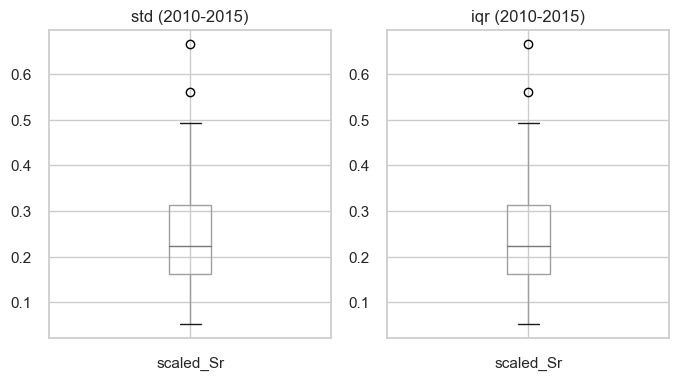

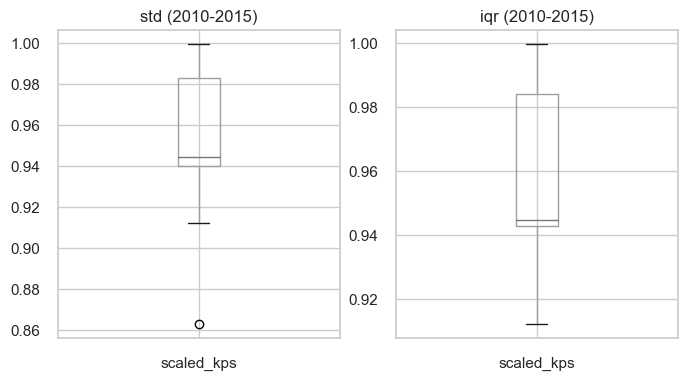


2005-2010:

Outliers Sr - standard deviation (std):

NM_MUNICIP
JAÚ    1.0
Name: scaled_Sr, dtype: float64

Outliers Sr - interquartile interval (iqr):

NM_MUNICIP
ARARAQUARA    0.556915
JAÚ           1.000000
Name: scaled_Sr, dtype: float64

2005-2010:

Outliers Kp - standard deviation (std):

NM_MUNICIP
ARARAQUARA    1.0
Name: scaled_kps, dtype: float64

Outliers Kp - interquartile interval (iqr):

NM_MUNICIP
ARARAQUARA    1.000000
BIRIGUI       0.863355
Name: scaled_kps, dtype: float64



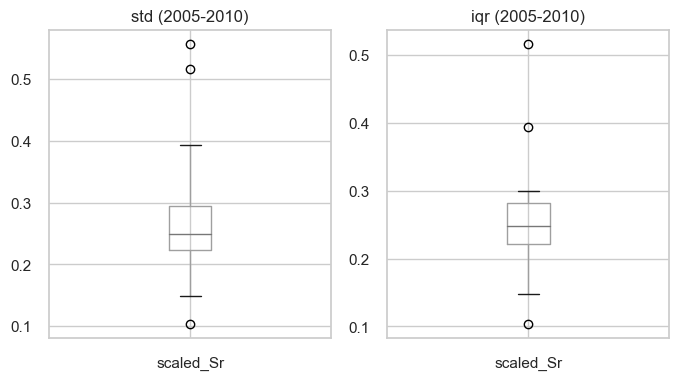

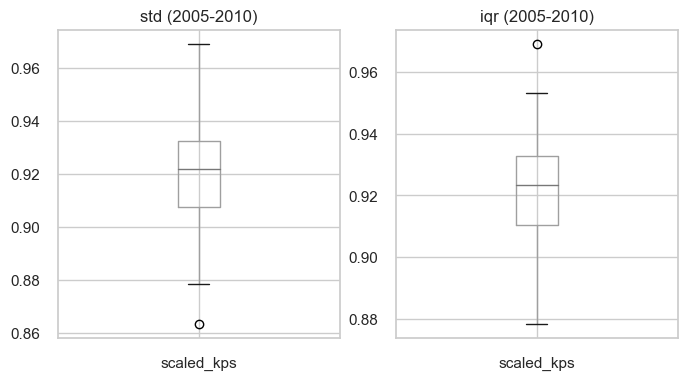


2000-2005:

Outliers Sr - standard deviation (std):

NM_MUNICIP
BOTUCATU    1.0
Name: scaled_Sr, dtype: float64

Outliers Sr - interquartile interval (iqr):

NM_MUNICIP
BOTUCATU    1.0
Name: scaled_Sr, dtype: float64

2000-2005:

Outliers Kp - standard deviation (std):

NM_MUNICIP
BARRETOS    0.903302
Name: scaled_kps, dtype: float64

Outliers Kp - interquartile interval (iqr):

Series([], Name: scaled_kps, dtype: float64)



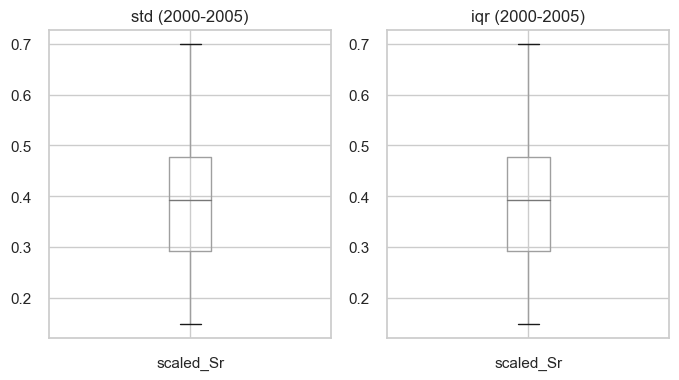

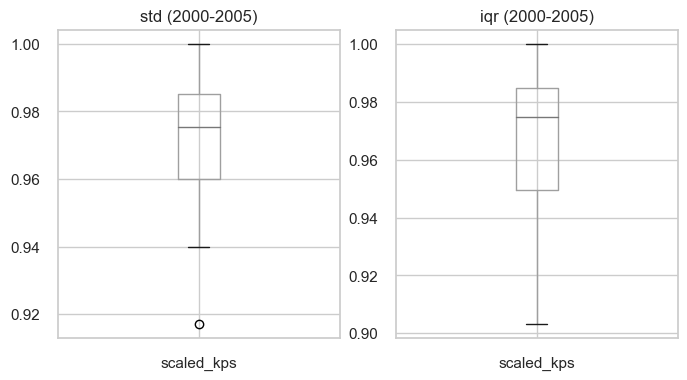


1995-2000:

Outliers Sr - standard deviation (std):

NM_MUNICIP
MARÍLIA    1.0
Name: scaled_Sr, dtype: float64

Outliers Sr - interquartile interval (iqr):

NM_MUNICIP
MARÍLIA    1.0
Name: scaled_Sr, dtype: float64

1995-2000:

Outliers Kp - standard deviation (std):

NM_MUNICIP
MARÍLIA    0.982304
Name: scaled_kps, dtype: float64

Outliers Kp - interquartile interval (iqr):

Series([], Name: scaled_kps, dtype: float64)



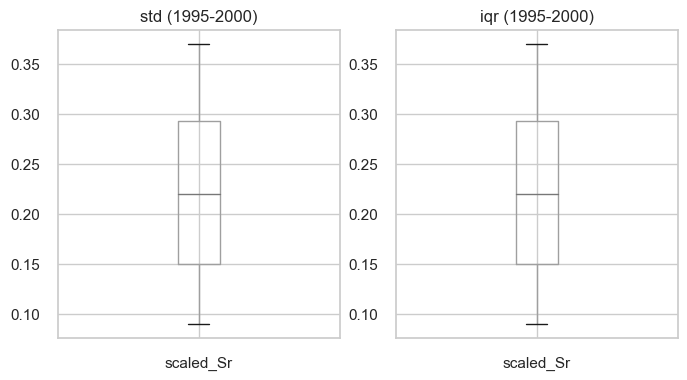

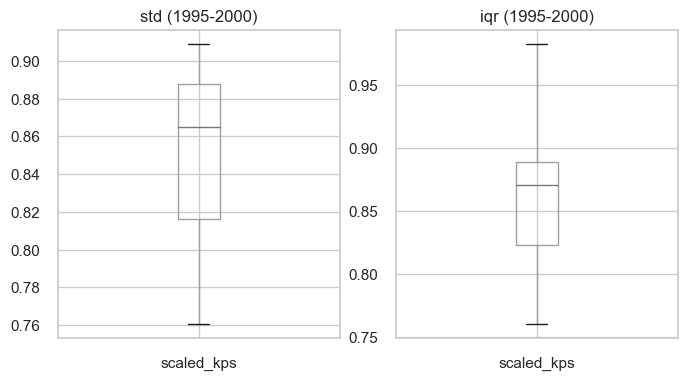


1990-1995:

Outliers Sr - standard deviation (std):

Series([], Name: scaled_Sr, dtype: float64)

Outliers Sr - interquartile interval (iqr):

Series([], Name: scaled_Sr, dtype: float64)

1990-1995:

Outliers Kp - standard deviation (std):

Series([], Name: scaled_kps, dtype: float64)

Outliers Kp - interquartile interval (iqr):

Series([], Name: scaled_kps, dtype: float64)



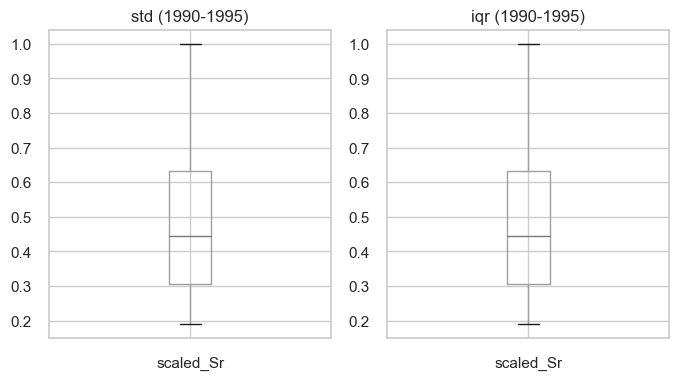

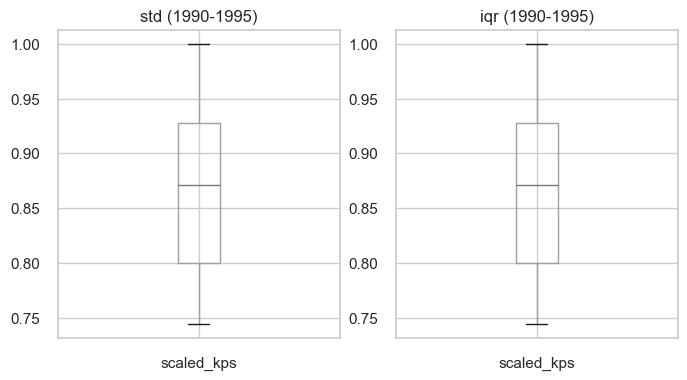


1985-1990:

Outliers Sr - standard deviation (std):

NM_MUNICIP
ASSIS    1.0
Name: scaled_Sr, dtype: float64

Outliers Sr - interquartile interval (iqr):

NM_MUNICIP
ASSIS      1.000000
MARÍLIA    0.877497
Name: scaled_Sr, dtype: float64

1985-1990:

Outliers Kp - standard deviation (std):

NM_MUNICIP
BARRETOS    0.552754
Name: scaled_kps, dtype: float64

Outliers Kp - interquartile interval (iqr):

NM_MUNICIP
ARARAQUARA    0.637402
BARRETOS      0.552754
Name: scaled_kps, dtype: float64



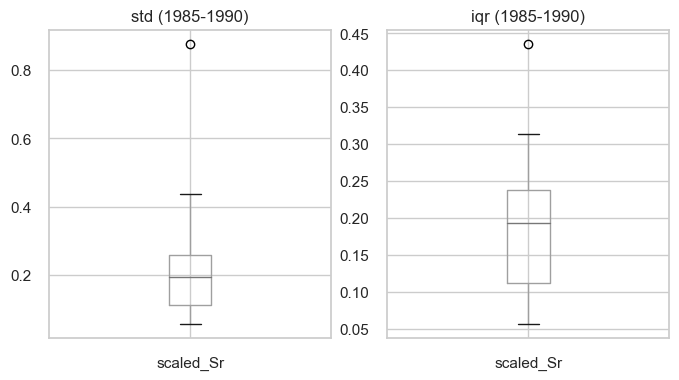

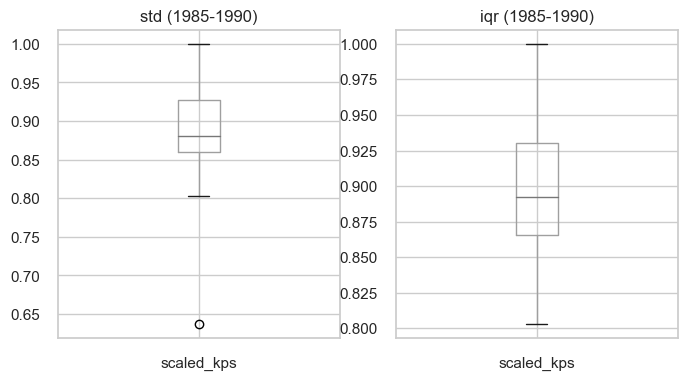

In [137]:
# Iterar por cada intervalo e DataFrame correspondente
for interval, df in scaled_df.items():
    
    # Calcula quartis e intervalo interquartil para 'scaled_Sr'
    Q1_Sr, Q3_Sr = df['scaled_Sr'].quantile([0.25, 0.75])
    IQR_Sr = Q3_Sr - Q1_Sr
    
    # Calcula quartis e intervalo interquartil para 'scaled_kp'
    Q1_kp, Q3_kp = df['scaled_kps'].quantile([0.25, 0.75])
    IQR_kp = Q3_kp - Q1_kp
    
    # Calcula média, mediana e desvio padrão para 'scaled_Sr'
    mean_Sr, median_Sr, std_Sr = df['scaled_Sr'].mean(), df['scaled_Sr'].median(), df['scaled_Sr'].std()
    
    # Calcula média, mediana e desvio padrão para 'scaled_kp'
    mean_kp, median_kp, std_kp = df['scaled_kps'].mean(), df['scaled_kps'].median(), df['scaled_kps'].std()
    
    # Identifica outliers para 'scaled_Sr' usando o desvio padrão
    outliers_std_Sr = df[
        (df['scaled_Sr'] < mean_Sr - 2 * std_Sr) | (df['scaled_Sr'] > mean_Sr + 2 * std_Sr)
    ]
    
    # Identifica outliers para 'scaled_kp' usando o desvio padrão
    outliers_std_kp = df[
        (df['scaled_kps'] < mean_kp - 2 * std_kp) | (df['scaled_kps'] > mean_kp + 2 * std_kp)
    ]
    
    # Identifica outliers para 'scaled_Sr' usando IQR
    outliers_iqr_Sr = df[
        (df['scaled_Sr'] < Q1_Sr - 1.5 * IQR_Sr) | (df['scaled_Sr'] > Q3_Sr + 1.5 * IQR_Sr)
    ]

    # Identifica outliers para 'scaled_kp' usando IQR
    outliers_iqr_kp = df[
        (df['scaled_kps'] < Q1_kp - 1.5 * IQR_kp) | (df['scaled_kps'] > Q3_kp + 1.5 * IQR_kp)
    ] 
    
    # Exibe outliers para scaled_Sr
    print(f'{interval}:\n')
    print(f'Outliers Sr - standard deviation (std):\n\n{outliers_std_Sr["scaled_Sr"]}\n')
    print(f'Outliers Sr - interquartile interval (iqr):\n\n{outliers_iqr_Sr["scaled_Sr"]}\n')
    
    # Plota boxplots para inliers usando o desvio padrão e o IQR
    plt.figure(figsize=(8, 4))
    
    plt.subplot(121)
    df[~df.index.isin(outliers_std_Sr.index)].boxplot('scaled_Sr')
    plt.title(f'std ({interval})')
    
    plt.subplot(122)
    df[~df.index.isin(outliers_iqr_Sr.index)].boxplot('scaled_Sr')
    plt.title(f'iqr ({interval})')

    # Exibe outliers para scaled_kp
    print(f'{interval}:\n')
    print(f'Outliers Kp - standard deviation (std):\n\n{outliers_std_kp["scaled_kps"]}\n')
    print(f'Outliers Kp - interquartile interval (iqr):\n\n{outliers_iqr_kp["scaled_kps"]}\n')
    
    # Plota boxplots para inliers usando o desvio padrão e o IQR
    plt.figure(figsize=(8, 4))
    
    plt.subplot(121)
    df[~df.index.isin(outliers_std_kp.index)].boxplot('scaled_kps')
    plt.title(f'std ({interval})')
    
    plt.subplot(122)
    df[~df.index.isin(outliers_iqr_kp.index)].boxplot('scaled_kps')
    plt.title(f'iqr ({interval})')
    
    plt.show()
    print()

### Análises de agrupamento (aprendizado não supervisionado)

Nesta seção são feitas análises de agrupamento (*clustering*) a partir das variáveis *Sprawl Ratio* (S<sub>r</sub>) e *Degree of Dispersion* (K<sub>ps</sub>). Para isso são utilizados quatro algoritmos: *KMeans*, *KMedoids*, *MeanShift* e *AffinityPropagation*.

`scikit-learn` reference: [2.3. Clustering](https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation):

[<ins>**Métricas de avaliação**</ins>](https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation)

[***Silhueta***](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html#sklearn.metrics.silhouette_score)
- *Faixa* : -1 a 1
- *Interpretação*:
    - **Valores próximos de 1** indicam *clusters* **bem separados**.
    - **Valores próximos de -1** sugerem agrupamento **incorreto**.
    - **Valores próximos de 0** indicam *clusters* **sobrepostos**.

[**Calinski-Harabasz**](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.calinski_harabasz_score.html#sklearn.metrics.calinski_harabasz_score)
- *Interpretação*:
    - A pontuação é **maior** quando os *clusters* são densos e **bem separados**.
  
[***Davies-Bouldin***](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html#sklearn.metrics.davies_bouldin_score)
- *Faixa* : 0 a ∞
- *Interpretação*:
    - Valores **menores** indicam **melhores** agrupamentos com *clusters* compactos e bem separados.
    - Uma pontuação **menor** no Davies-Bouldin é **desejável**.

##### **Funções**

Funções específicas para *clustering*.

In [138]:
def print_best_k_values(best_k_values_dict):
    for interval, values in best_k_values_dict.items():
        print(f'Interval: {interval} - Best K: {values["k"]} - Score: {values["score"]}')

In [139]:
def print_clusters_centers_munics(results_dict):
    
    # Iterate over each interval
    for interval, centers in results_dict['centers'].items():
        print(f"\n{interval} centers:\n")
        
        # Get the original DataFrame for the current interval
        df_interval = scaled_df[interval]
        
        # Iterate over each cluster center
        for center in centers:
            
            # Find the index of the closest point in the original DataFrame
            index_of_center = np.argmin(np.sum((df_interval[['scaled_Sr', 'scaled_kps']] - center) ** 2, axis=1))
        
            # Get the name of the municipality using the index
            municipality_name = df_interval.index[index_of_center]
        
            print(f"Cluster center at: {center} - {municipality_name}")

In [140]:
def assign_new_cluster_column(labels_dict, cls_col_name):
    
    """
    Assigns a new cluster column to the respective DataFrame 
    ased on the provided labels.

    Parameters:
        labels_dict (dict): Dictionary containing intervals as 
        keys and corresponding labels as values.
        cls_col_name (str): Name of the new cluster column.
        scaled_df (dict): Dictionary of DataFrames.
    """
    
    # Iterate through each key in the data dictionary and add a new column to the respective DataFrame
    for label_interval, label in labels_dict['labels'].items():
        if label_interval in scaled_df:
            scaled_df[label_interval][cls_col_name] = label

    # Print the modified DataFrames
    for interval, df in scaled_df.items():
        print(f'{interval}:\n{df}\n')

##### **KMeans**

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


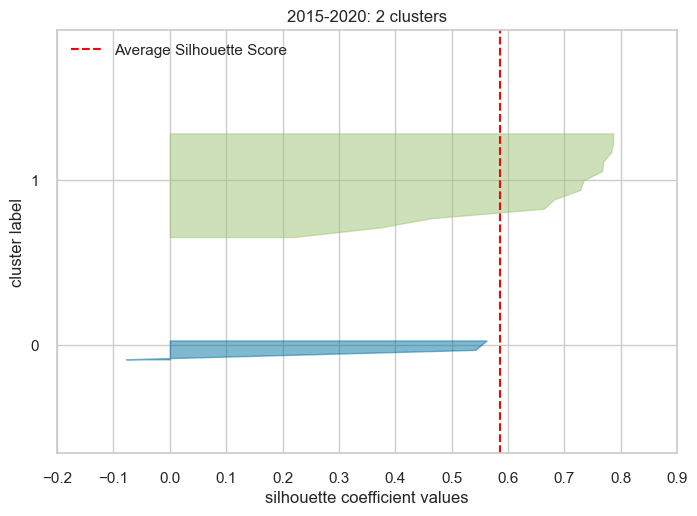

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


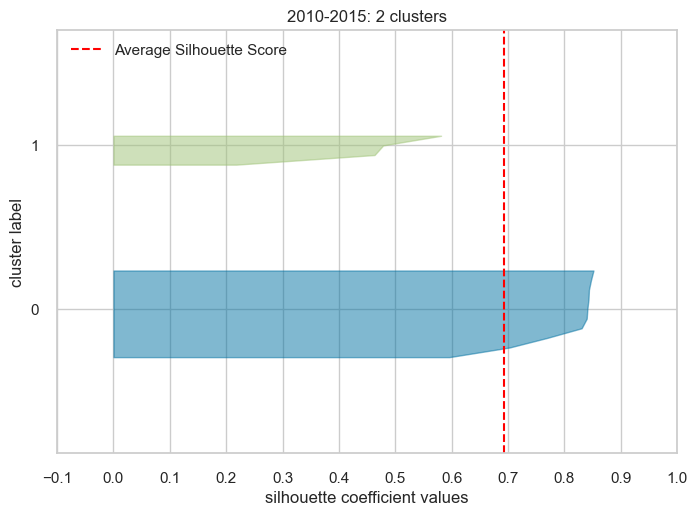

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


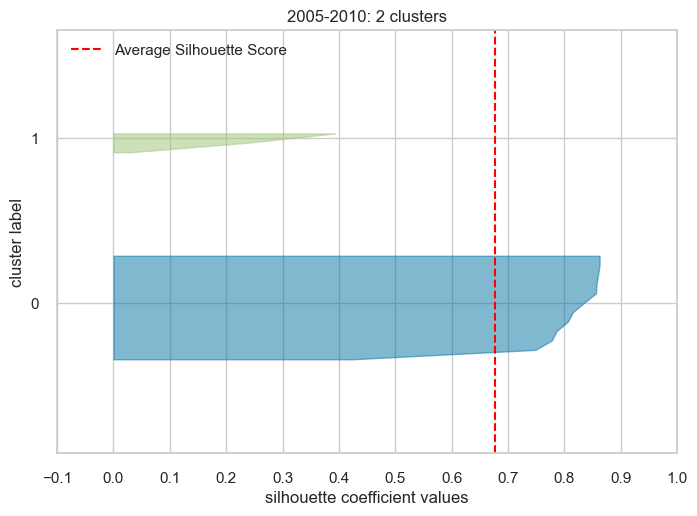

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


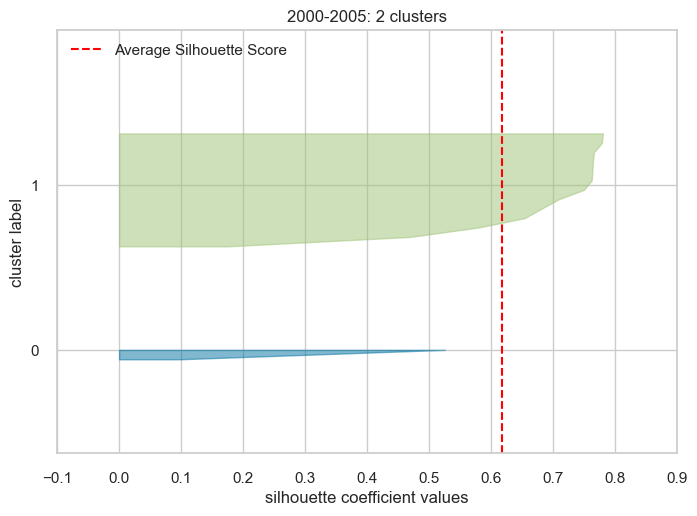

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


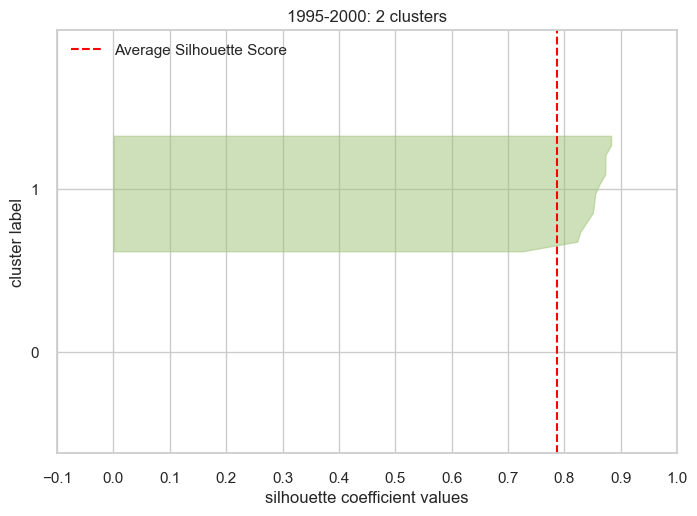

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


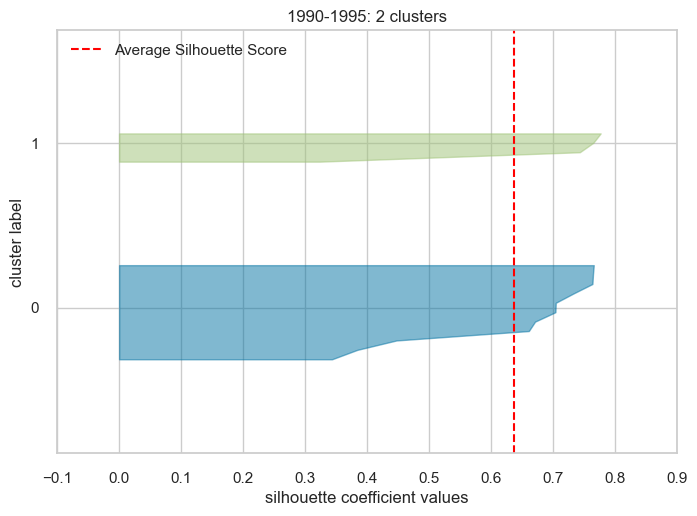

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


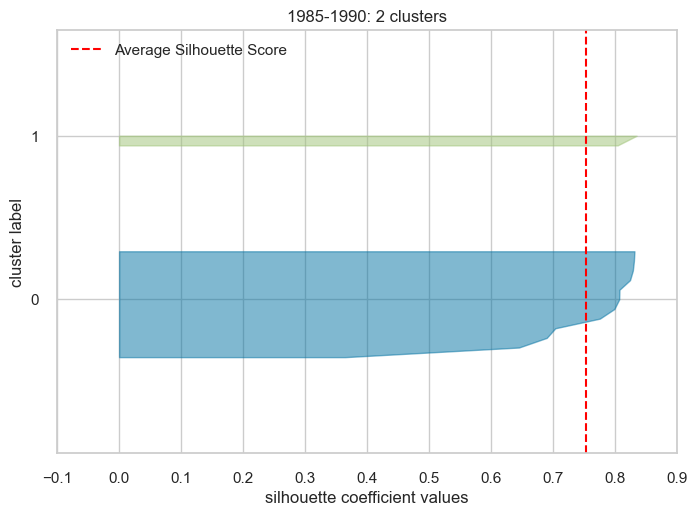

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


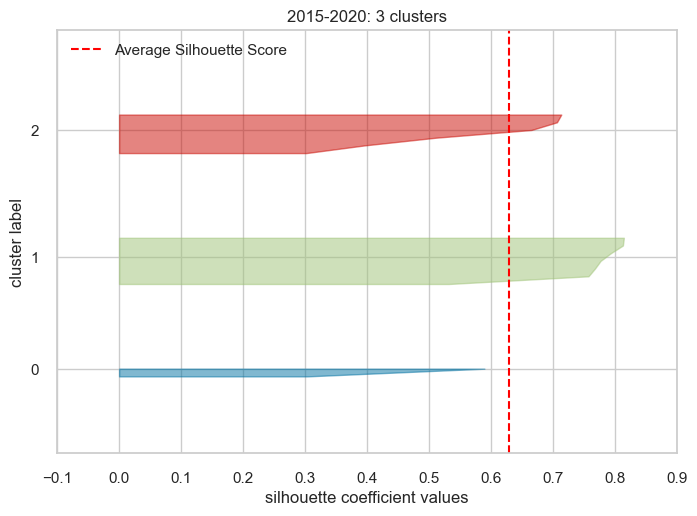

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


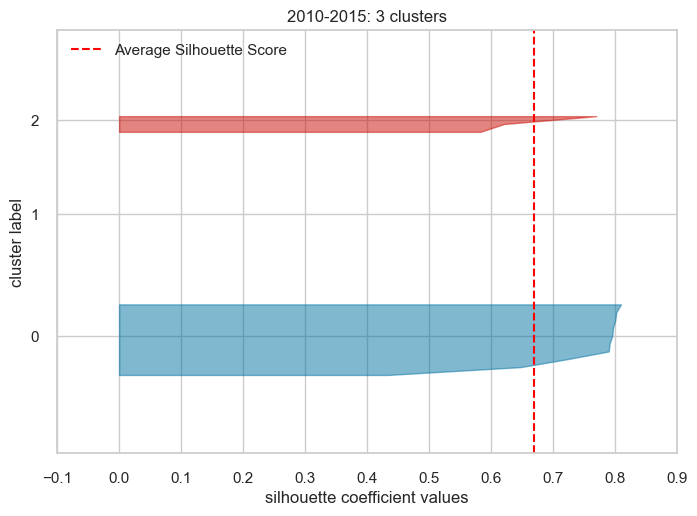

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


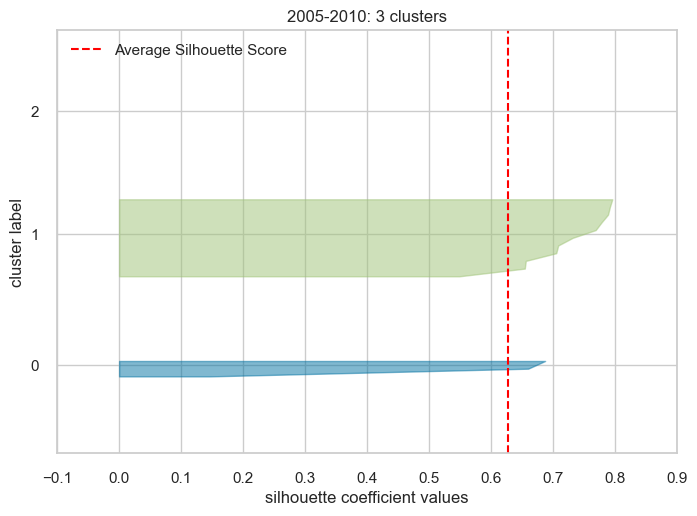

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


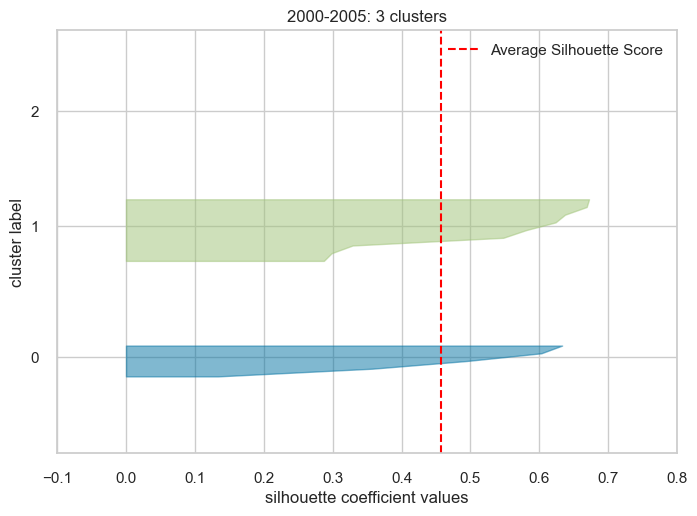

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


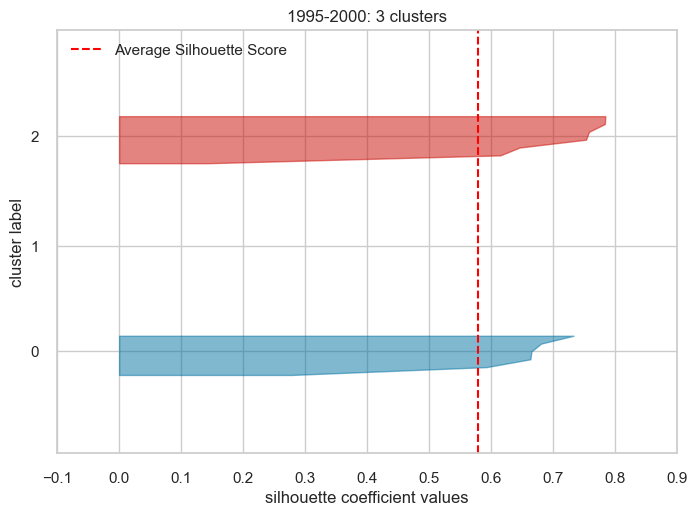

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


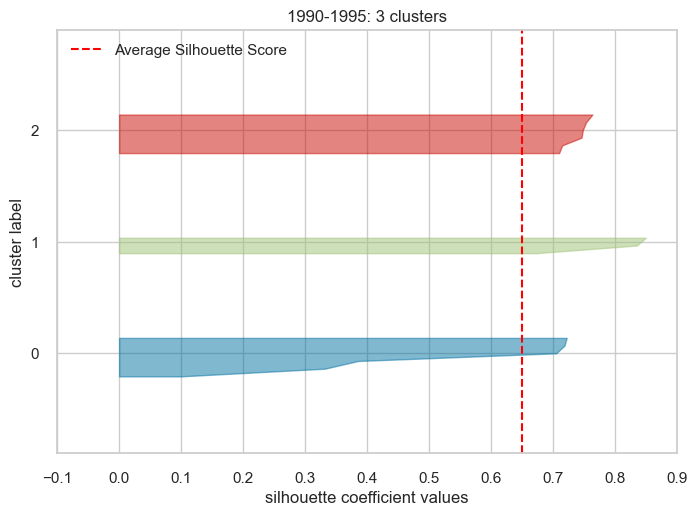

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


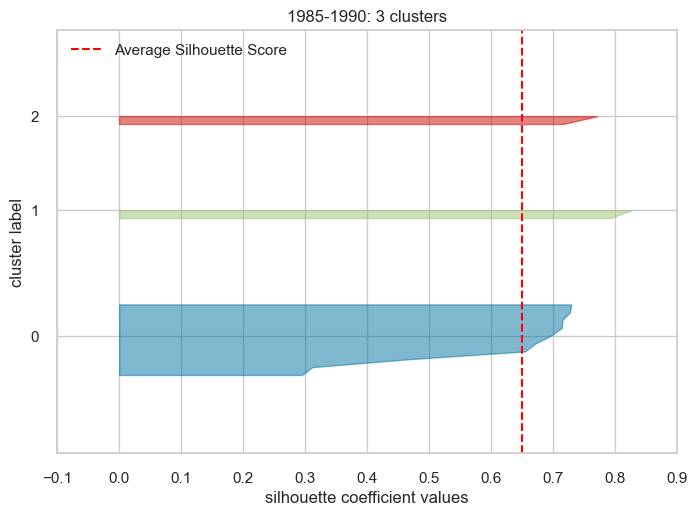

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


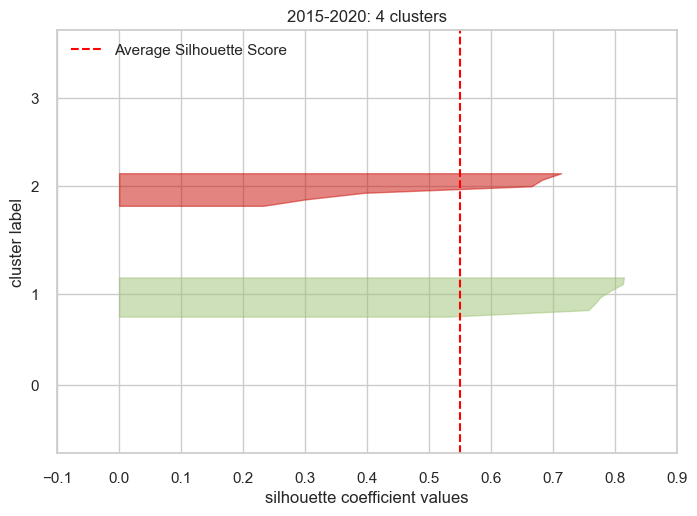

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


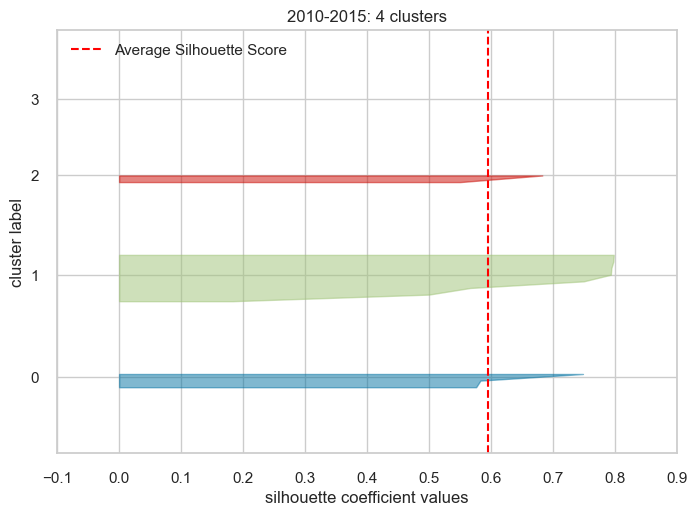

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


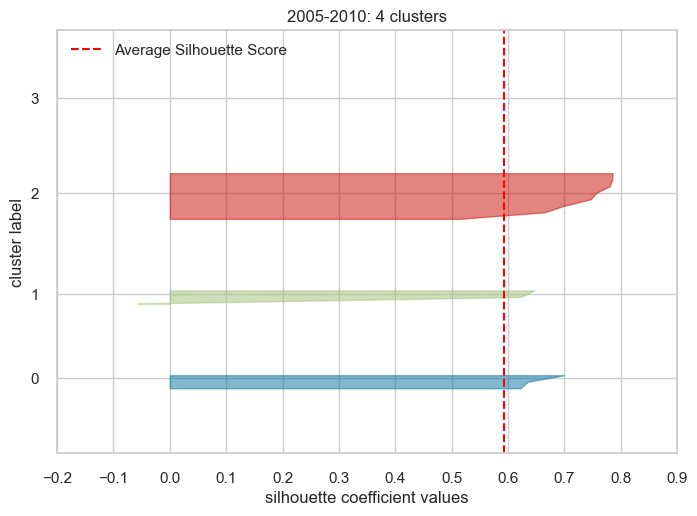

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


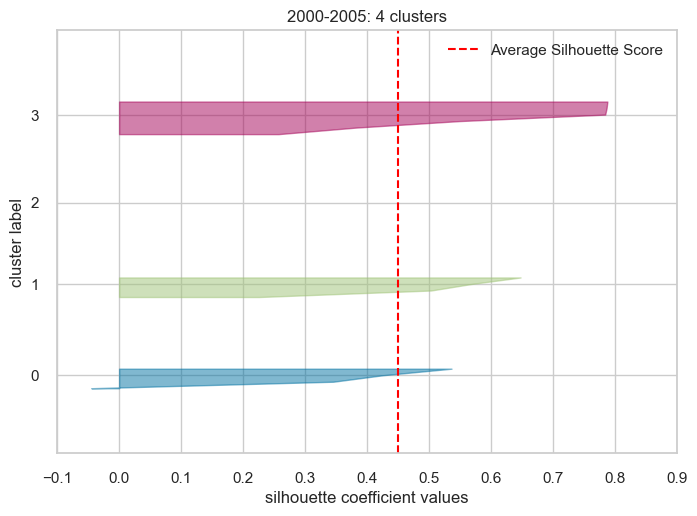

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


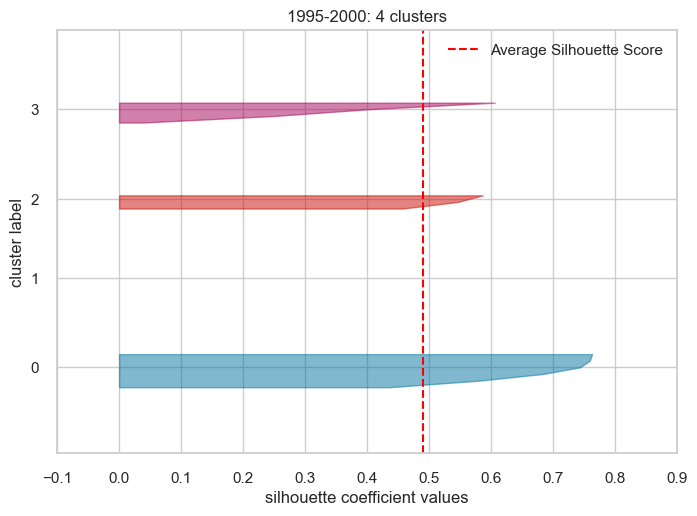

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


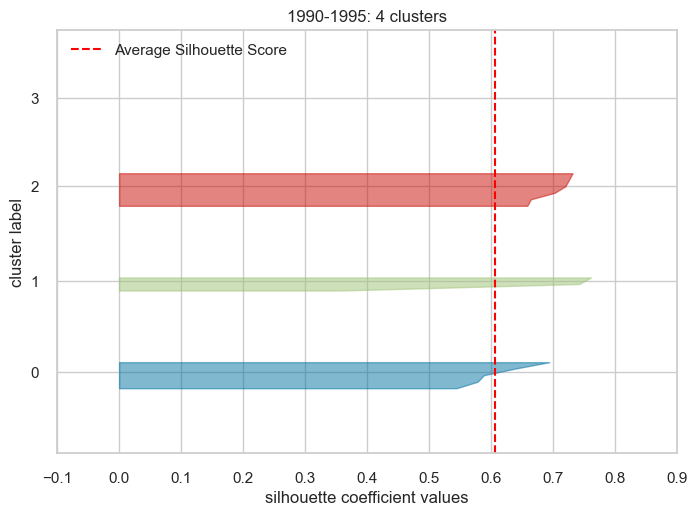

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


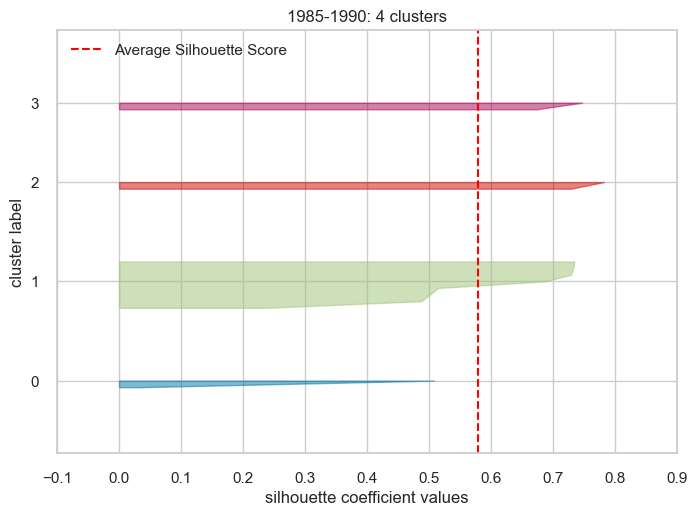

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


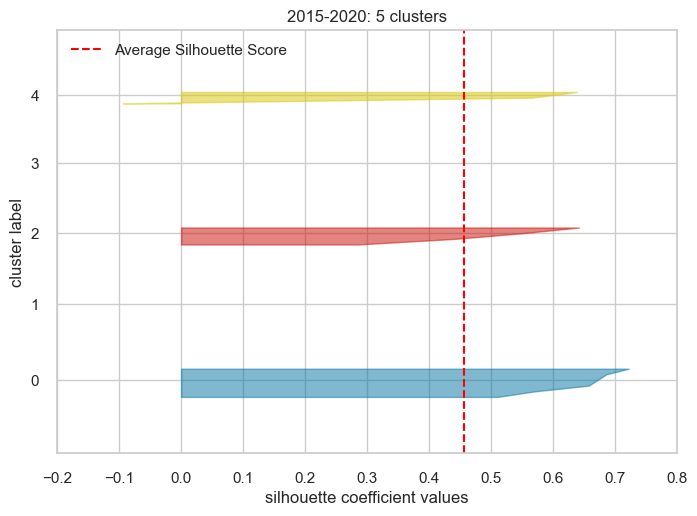

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


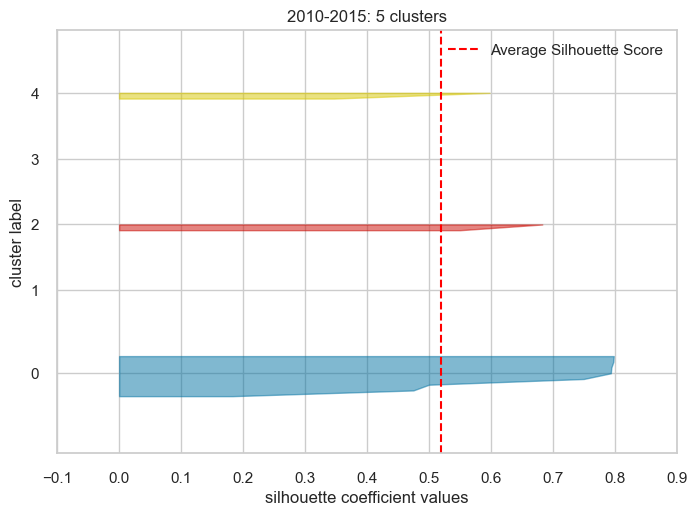

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


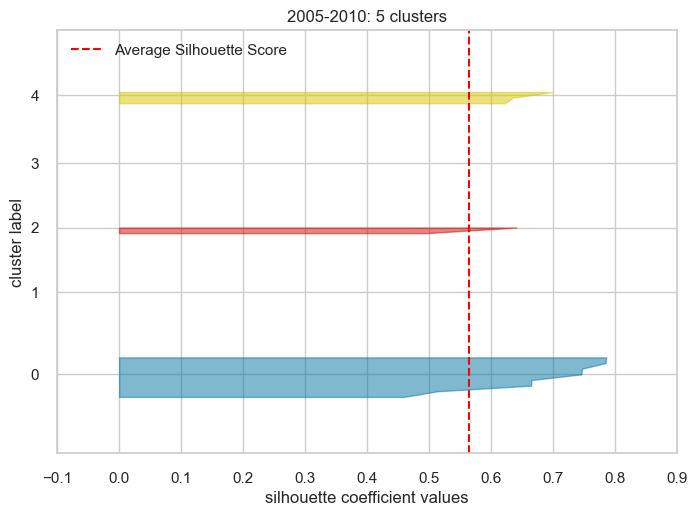

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


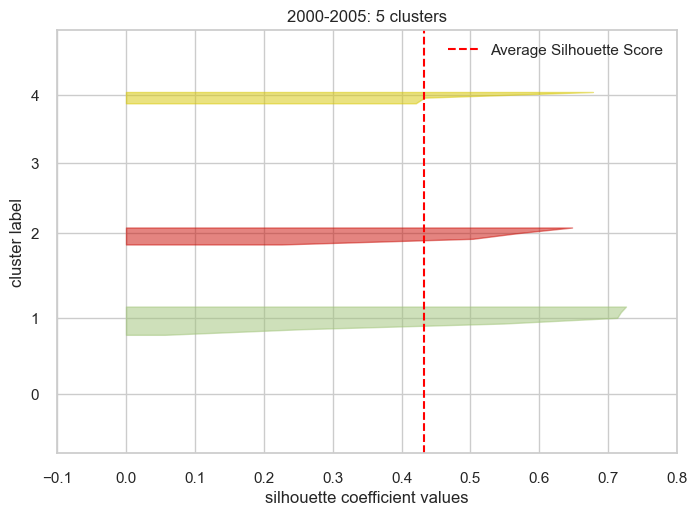

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


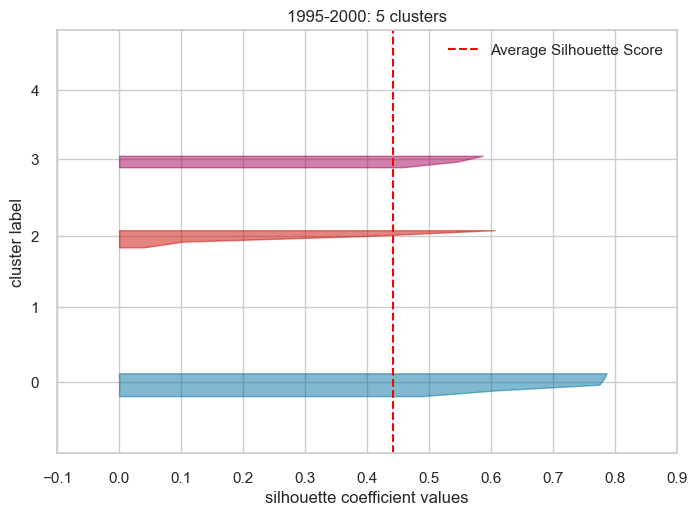

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


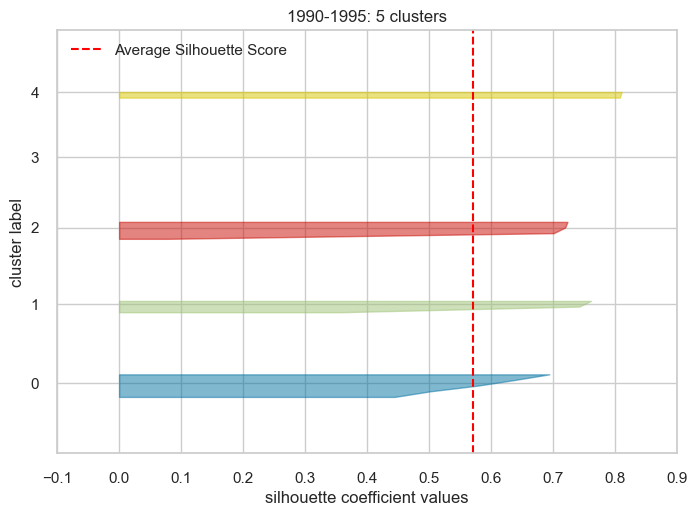

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


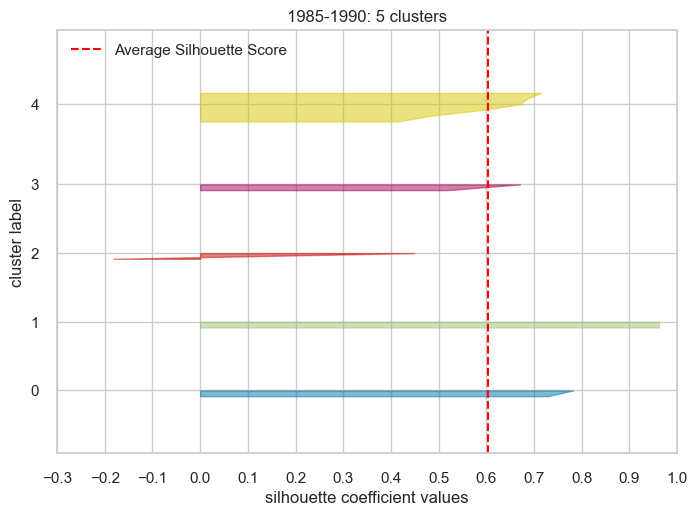

In [141]:
# Silhueta

# Dicionário para armazenar o melhor valor de k para cada intervalo
best_k_values_kmeans = {}

# Iterar sobre diferentes valores de n_clusters
for n_clusters in range(2, 6):
    
    # Itera sobre todos os DataFrames em scaled_df
    for interval, df in scaled_df.items():
        
        if 'scaled_Sr' in df.columns and 'scaled_kps' in df.columns:
            
            # Instancia o modelo de clustering com o valor atual de n_clusters
            model = KMeans(init='k-means++', n_clusters=n_clusters, n_init=10, random_state=42)

            # Instancia o SilhouetteVisualizer com um título
            title = f'{interval}: {n_clusters} clusters'
            visualizer = SilhouetteVisualizer(model, colors='yellowbrick', title=title)

            # Ajusta o modelo e mostra o visualizador
            visualizer.fit(df[['scaled_Sr', 'scaled_kps']])
            visualizer.show()

            # Obtém a pontuação da silhueta do modelo atual
            max_silhouette_score_km = visualizer.silhouette_score_

            # Confere se o intervalo atual já está no dicionário
            if interval not in best_k_values_kmeans:
                best_k_values_kmeans[interval] = {'k': n_clusters, 'score': max_silhouette_score_km}
            else:
                # Atualiza o dicionário se a nova pontuação da silhueta for melhor
                if max_silhouette_score_km > best_k_values_kmeans[interval]['score']:
                    best_k_values_kmeans[interval] = {'k': n_clusters, 'score': max_silhouette_score_km}

In [142]:
# Melhores valores de k por intervalo
print_best_k_values(best_k_values_dict=best_k_values_kmeans)

Interval: 2015-2020 - Best K: 3 - Score: 0.6292071201868988
Interval: 2010-2015 - Best K: 2 - Score: 0.6932121467427835
Interval: 2005-2010 - Best K: 2 - Score: 0.6765756243159982
Interval: 2000-2005 - Best K: 2 - Score: 0.616985103838379
Interval: 1995-2000 - Best K: 2 - Score: 0.7871666808674063
Interval: 1990-1995 - Best K: 3 - Score: 0.6501616761511524
Interval: 1985-1990 - Best K: 2 - Score: 0.7530840291045845


In [143]:
# Define semente aleatória para reprodutibilidade
np.random.seed(42)

# Inicializa dicionários para armazenar resultados do KMeans e métricas de avaliação
km_results = {'fit': {}, 'labels': {}, 'centers': {}, 'silhouette': {}, 'calinski_harabasz': {}, 'davies_bouldin': {}}

# Itera sobre cada intervalo e seu DataFrame correspondente em scaled_df
for interval, df in scaled_df.items():

    # Recupera o melhor valor de k para o intervalo atual
    best_k_value = best_k_values_kmeans[interval]['k']

    # Inicializa o cluster KMeans com parâmetros especificados
    kmeans = KMeans(n_clusters=best_k_value, init='k-means++', n_init=10, random_state=42)

    # Ajusta o KMeans ao DataFrame atual e armazena o resultado nos dicionários
    km_results['fit'][interval] = kmeans.fit(df[['scaled_Sr', 'scaled_kps']])
    km_results['labels'][interval] = kmeans.labels_
    km_results['centers'][interval] = kmeans.cluster_centers_

    # Métricas de avaliação
    km_results['silhouette'][interval] = silhouette_score(df[['scaled_Sr', 'scaled_kps']], km_results['labels'][interval])
    km_results['calinski_harabasz'][interval] = calinski_harabasz_score(df[['scaled_Sr', 'scaled_kps']], km_results['labels'][interval])
    km_results['davies_bouldin'][interval] = davies_bouldin_score(df[['scaled_Sr', 'scaled_kps']], km_results['labels'][interval])

C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\icnso\miniconda3\envs\tcc_mba\lib\site-packages\sklearn\cluster\_kmeans.py:1440: User

In [144]:
# Centros dos clusters
km_results['centers']

{'2015-2020': array([[0.88571589, 0.98551482],
        [0.18633501, 0.93468177],
        [0.44389545, 0.97238486]]),
 '2010-2015': array([[0.18574007, 0.91907719],
        [0.6801229 , 0.99221776]]),
 '2005-2010': array([[0.23779097, 0.91196948],
        [0.69098464, 0.97412785]]),
 '2000-2005': array([[0.84982397, 0.99124279],
        [0.36738314, 0.96113365]]),
 '1995-2000': array([[1.        , 0.98230386],
        [0.22119115, 0.8500534 ]]),
 '1990-1995': array([[0.53796234, 0.91080182],
        [0.95105021, 0.95695264],
        [0.2636582 , 0.78106936]]),
 '1985-1990': array([[0.19481047, 0.83446028],
        [0.93874861, 0.96955822]])}

In [145]:
# Silhueta
km_results['silhouette']

{'2015-2020': 0.6292071201868988,
 '2010-2015': 0.6932121467427835,
 '2005-2010': 0.6765756243159982,
 '2000-2005': 0.616985103838379,
 '1995-2000': 0.7871666808674063,
 '1990-1995': 0.6501616761511524,
 '1985-1990': 0.7530840291045845}

In [146]:
# Calinski-Harabasz
km_results['calinski_harabasz']

{'2015-2020': 62.24022530102132,
 '2010-2015': 38.18776622902786,
 '2005-2010': 30.389459008616257,
 '2000-2005': 22.216532350474782,
 '1995-2000': 59.252259483968636,
 '1990-1995': 71.14310854217915,
 '1985-1990': 38.14285928229541}

In [147]:
# Davies-Bouldin
km_results['davies_bouldin']

{'2015-2020': 0.41368406367734795,
 '2010-2015': 0.46145120492721,
 '2005-2010': 0.5792897701407556,
 '2000-2005': 0.5204943298479665,
 '1995-2000': 0.10882384090488476,
 '1990-1995': 0.3841861884451078,
 '1985-1990': 0.25524357981325985}

In [148]:
# Modelos
km_results['fit']

{'2015-2020': KMeans(n_clusters=3, n_init=10, random_state=42),
 '2010-2015': KMeans(n_clusters=2, n_init=10, random_state=42),
 '2005-2010': KMeans(n_clusters=2, n_init=10, random_state=42),
 '2000-2005': KMeans(n_clusters=2, n_init=10, random_state=42),
 '1995-2000': KMeans(n_clusters=2, n_init=10, random_state=42),
 '1990-1995': KMeans(n_clusters=3, n_init=10, random_state=42),
 '1985-1990': KMeans(n_clusters=2, n_init=10, random_state=42)}

In [149]:
# Rótulos
km_results['labels']

{'2015-2020': array([1, 1, 1, 2, 1, 2, 2, 1, 1, 2, 0, 2, 0, 1, 2]),
 '2010-2015': array([1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]),
 '2005-2010': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]),
 '2000-2005': array([1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]),
 '1995-2000': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]),
 '1990-1995': array([0, 2, 0, 0, 2, 0, 2, 0, 1, 0, 1, 2, 1, 2, 2]),
 '1985-1990': array([0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])}

In [150]:
# Nova coluna com rótulos
assign_new_cluster_column(labels_dict=km_results, cls_col_name='KMeans')

2015-2020:
                             Sr       kps  scaled_Sr  scaled_kps  KMeans
NM_MUNICIP                                                              
ARARAQUARA             0.857508  0.988866   0.217312    0.936972       1
ARAÇATUBA              1.024690  1.000791   0.259680    0.948271       1
ASSIS                  0.785730  0.983850   0.199122    0.932219       1
BARRETOS               1.702110  1.055385   0.431354    1.000000       2
BAURU                  0.495734  0.984435   0.125631    0.932773       1
BIRIGUI                2.253048  1.037777   0.570975    0.983315       2
BOTUCATU               1.423550  1.013777   0.360761    0.960576       2
CATANDUVA              0.490097  0.963615   0.124202    0.913046       1
FRANCA                 0.832683  0.993114   0.211021    0.940997       1
JAÚ                    1.381323  1.009566   0.350059    0.956585       2
MARÍLIA                3.044046  1.038237   0.771432    0.983752       0
OURINHOS               1.816989  1.02037

##### **KMedoids**

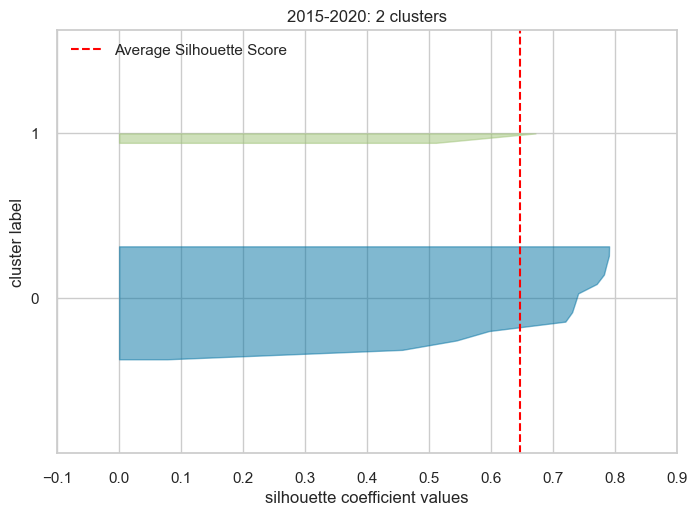

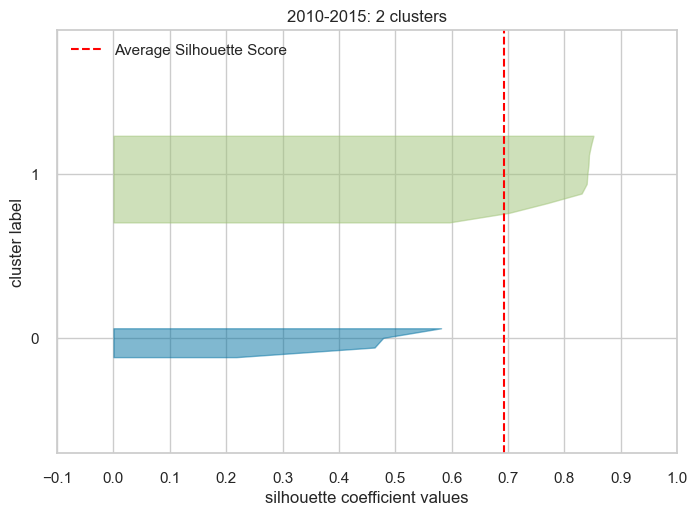

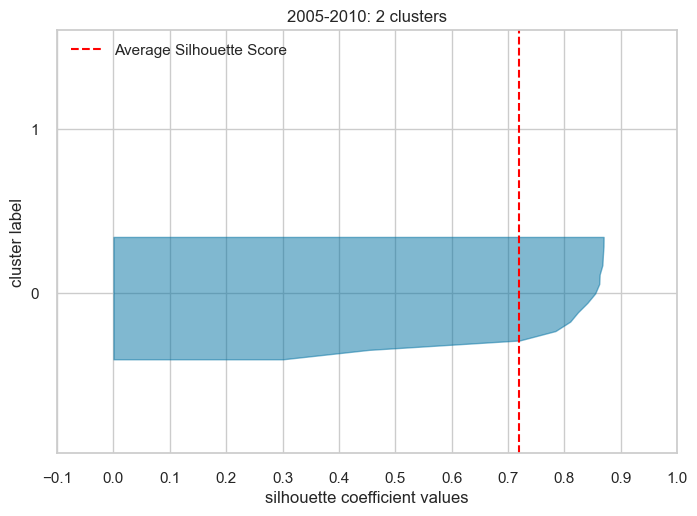

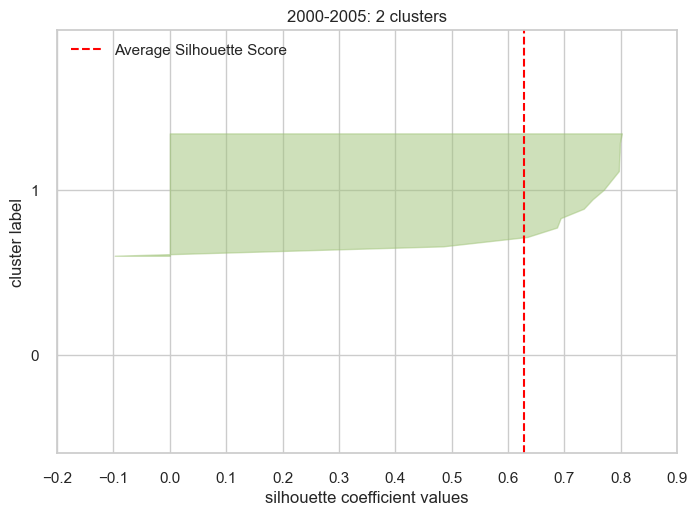

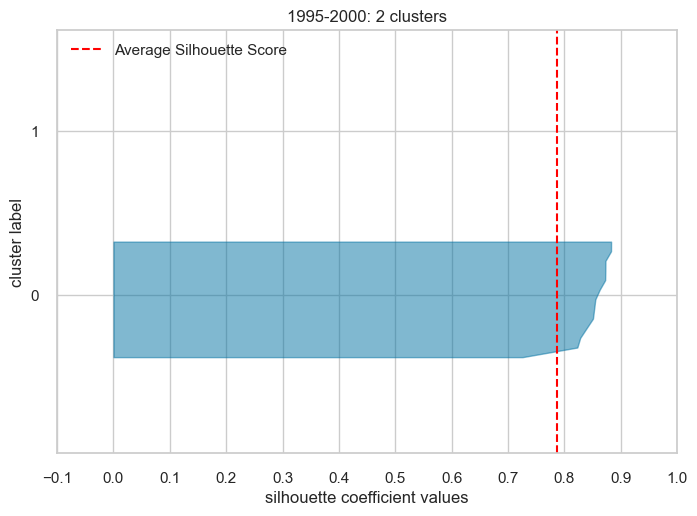

...

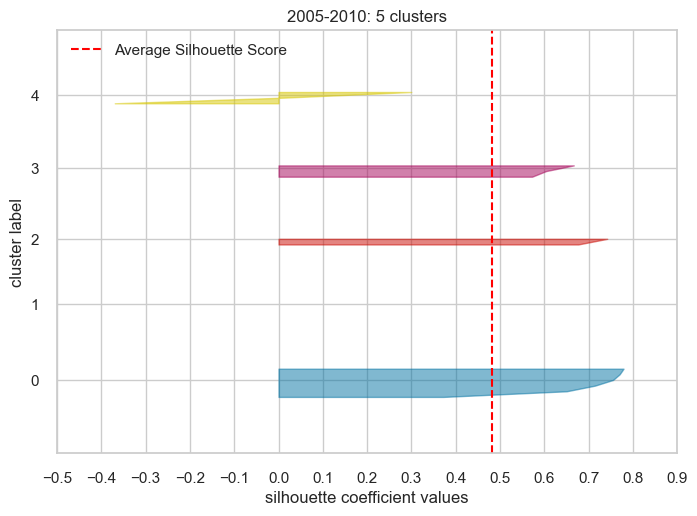

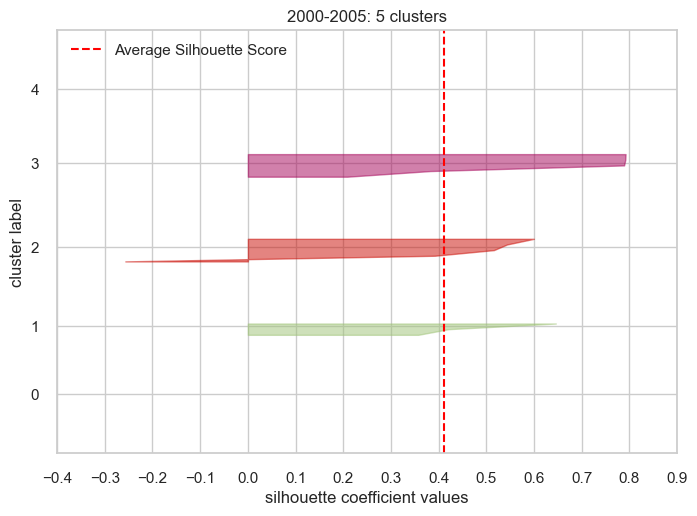

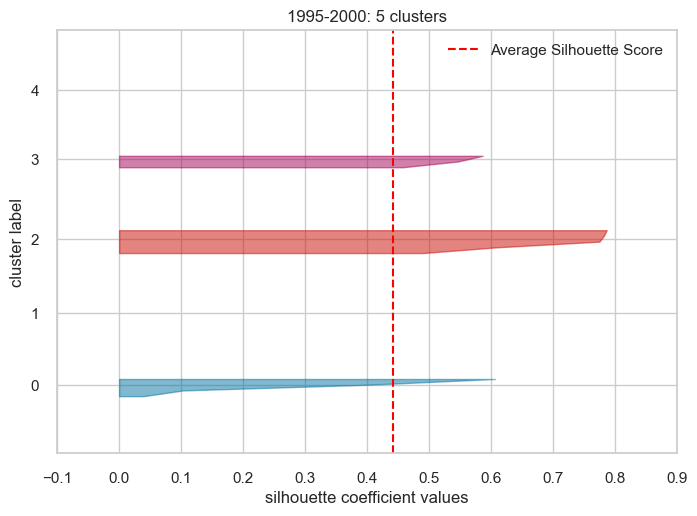

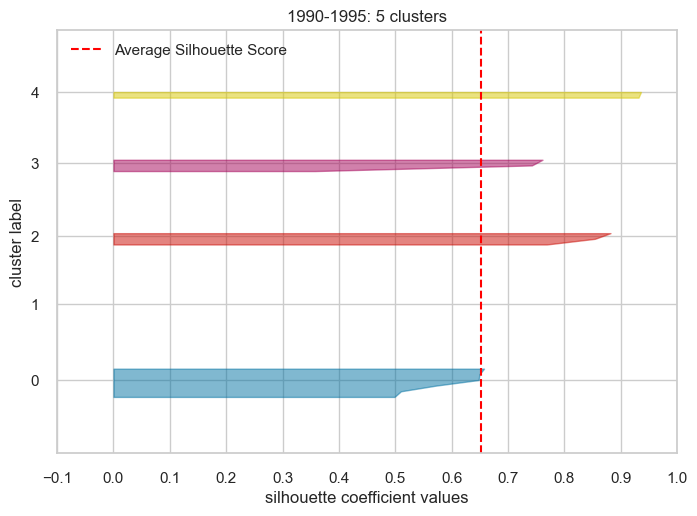

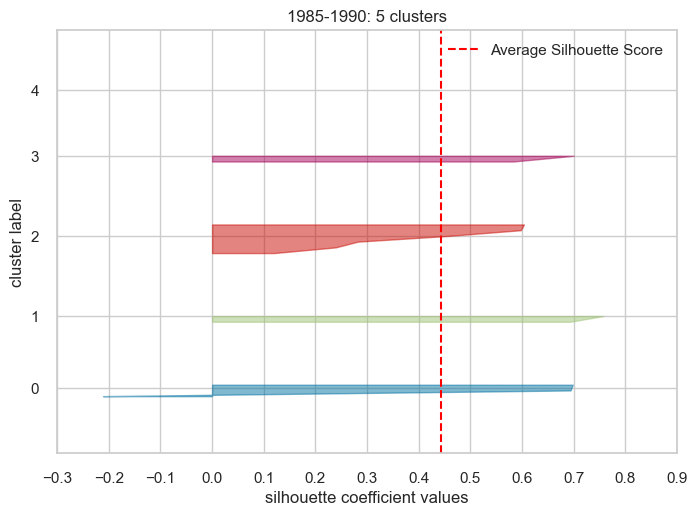

In [151]:
# Silhueta

# Dicionário para armazenar o melhor valor de k para cada intervalo
best_k_values_kmedoids = {}

# Itera sobre diferentes valores de n_clusters
for n_clusters in range(2, 6):
    
    # Itera sobre todos os DataFrames em scaled_df
    for interval, df in scaled_df.items():
        
        if 'scaled_Sr' in df.columns and 'scaled_kps' in df.columns:
            
            # Instancia o modelo de clustering com o valor atual de n_clusters
            model = KMedoids(method='pam', init='k-medoids++', n_clusters=n_clusters, max_iter=0, random_state=42)

            # Instancia o SilhouetteVisualizer com um título
            title = f'{interval}: {n_clusters} clusters'
            visualizer = SilhouetteVisualizer(model, colors='yellowbrick', title=title)

            # Ajusta o modelo e mostra o visualizador
            visualizer.fit(df[['scaled_Sr', 'scaled_kps']])
            visualizer.show()

            # Obtém a pontuação da silhueta do modelo atuall
            max_silhouette_score_kmd = visualizer.silhouette_score_

            # Confere se o intervalo atual já está no dicionário
            if interval not in best_k_values_kmedoids:
                best_k_values_kmedoids[interval] = {'k': n_clusters, 'score': max_silhouette_score_kmd}
            else:
                # Atualiza o dicionário se a nova pontuação da silhueta for melhor
                if max_silhouette_score_kmd > best_k_values_kmedoids[interval]['score']:
                    best_k_values_kmedoids[interval] = {'k': n_clusters, 'score': max_silhouette_score_kmd}

In [152]:
# Melhores valores de k por intervalo
print_best_k_values(best_k_values_dict=best_k_values_kmedoids)

Interval: 2015-2020 - Best K: 2 - Score: 0.6468191973797303
Interval: 2010-2015 - Best K: 2 - Score: 0.6932121467427835
Interval: 2005-2010 - Best K: 2 - Score: 0.719204907150507
Interval: 2000-2005 - Best K: 2 - Score: 0.6286873016251072
Interval: 1995-2000 - Best K: 2 - Score: 0.7871666808674063
Interval: 1990-1995 - Best K: 5 - Score: 0.6511815658892778
Interval: 1985-1990 - Best K: 2 - Score: 0.7530840291045845


In [153]:
# Define semente aleatória para reprodutibilidade
np.random.seed(42)

# Inicializa dicionários para armazenar resultados do KMedoids e métricas de avaliação
kmd_results = {'fit': {}, 'labels': {}, 'centers': {}, 'silhouette': {}, 'calinski_harabasz': {}, 'davies_bouldin': {}}

# Itera sobre cada intervalo e seu DataFrame correspondente em scaled_df
for interval, df in scaled_df.items():

    # Recupera o melhor valor de k para o intervalo atual
    best_k_value = best_k_values_kmedoids[interval]['k']

    # Inicializa o cluster do KMedoids com parâmetros especificados
    kmedoids = KMedoids(n_clusters=best_k_value, method='pam', 
                        init='k-medoids++', max_iter=300, random_state=42)

    # Ajusta o KMedoids ao DataFrame atual e armazena o resultado nos dicionários
    kmd_results['fit'][interval] = kmedoids.fit(df[['scaled_Sr', 'scaled_kps']])
    kmd_results['labels'][interval] = kmedoids.labels_
    kmd_results['centers'][interval] = kmedoids.cluster_centers_

    # Métricas de avaliação
    kmd_results['silhouette'][interval] = silhouette_score(df[['scaled_Sr', 'scaled_kps']], kmd_results['labels'][interval])
    kmd_results['calinski_harabasz'][interval] = calinski_harabasz_score(df[['scaled_Sr', 'scaled_kps']], kmd_results['labels'][interval])
    kmd_results['davies_bouldin'][interval] = davies_bouldin_score(df[['scaled_Sr', 'scaled_kps']], kmd_results['labels'][interval])

In [154]:
# Centros dos clusters
kmd_results['centers']

{'2015-2020': array([[0.48975687, 0.96700581],
        [0.19912221, 0.93221877]]),
 '2010-2015': array([[0.66604452, 0.99894411],
        [0.21913765, 0.94398426]]),
 '2005-2010': array([[0.24285824, 0.91199698],
        [0.5569149 , 1.        ]]),
 '2000-2005': array([[0.34395603, 0.96461689],
        [0.5750517 , 0.98538555]]),
 '1995-2000': array([[0.21992895, 0.86520196],
        [1.        , 0.98230386]]),
 '1990-1995': array([[0.19085745, 0.77364399],
        [0.70391263, 1.        ],
        [0.53348574, 0.90209659],
        [0.97657129, 0.94274254],
        [0.30188275, 0.8049677 ]]),
 '1985-1990': array([[0.19457124, 0.86918531],
        [0.87749722, 0.93911645]])}

In [155]:
# Medoides dos clusters
print_clusters_centers_munics(results_dict=kmd_results)


2015-2020 centers:

Cluster center at: [0.48975687 0.96700581] - SÃO JOSÉ DO RIO PRETO
Cluster center at: [0.19912221 0.93221877] - ASSIS

2010-2015 centers:

Cluster center at: [0.66604452 0.99894411] - BOTUCATU
Cluster center at: [0.21913765 0.94398426] - SÃO CARLOS

2005-2010 centers:

Cluster center at: [0.24285824 0.91199698] - SÃO JOSÉ DO RIO PRETO
Cluster center at: [0.5569149 1.       ] - ARARAQUARA

2000-2005 centers:

Cluster center at: [0.34395603 0.96461689] - SÃO CARLOS
Cluster center at: [0.5750517  0.98538555] - PRESIDENTE PRUDENTE

1995-2000 centers:

Cluster center at: [0.21992895 0.86520196] - BARRETOS
Cluster center at: [1.         0.98230386] - MARÍLIA

1990-1995 centers:

Cluster center at: [0.19085745 0.77364399] - BOTUCATU
Cluster center at: [0.70391263 1.        ] - CATANDUVA
Cluster center at: [0.53348574 0.90209659] - BIRIGUI
Cluster center at: [0.97657129 0.94274254] - PRESIDENTE PRUDENTE
Cluster center at: [0.30188275 0.8049677 ] - SÃO JOSÉ DO RIO PRETO

19

In [156]:
# Silhueta
kmd_results['silhouette']

{'2015-2020': 0.5082956299984915,
 '2010-2015': 0.6932121467427835,
 '2005-2010': 0.6765756243159982,
 '2000-2005': 0.4975992595778829,
 '1995-2000': 0.7871666808674063,
 '1990-1995': 0.5705146235322325,
 '1985-1990': 0.7530840291045845}

In [157]:
# Calinski-Harabasz
kmd_results['calinski_harabasz']

{'2015-2020': 17.953274225893818,
 '2010-2015': 38.18776622902786,
 '2005-2010': 30.389459008616257,
 '2000-2005': 19.042501745389586,
 '1995-2000': 59.252259483968636,
 '1990-1995': 94.22370331976923,
 '1985-1990': 38.14285928229541}

In [158]:
# Davies-Bouldin
kmd_results['davies_bouldin']

{'2015-2020': 0.5728593381318375,
 '2010-2015': 0.46145120492721,
 '2005-2010': 0.5792897701407556,
 '2000-2005': 0.6921024789617796,
 '1995-2000': 0.10882384090488476,
 '1990-1995': 0.3106167937045028,
 '1985-1990': 0.25524357981325985}

In [159]:
# Modelos
kmd_results['fit']

{'2015-2020': KMedoids(init='k-medoids++', method='pam', n_clusters=2, random_state=42),
 '2010-2015': KMedoids(init='k-medoids++', method='pam', n_clusters=2, random_state=42),
 '2005-2010': KMedoids(init='k-medoids++', method='pam', n_clusters=2, random_state=42),
 '2000-2005': KMedoids(init='k-medoids++', method='pam', n_clusters=2, random_state=42),
 '1995-2000': KMedoids(init='k-medoids++', method='pam', n_clusters=2, random_state=42),
 '1990-1995': KMedoids(init='k-medoids++', method='pam', n_clusters=5, random_state=42),
 '1985-1990': KMedoids(init='k-medoids++', method='pam', n_clusters=2, random_state=42)}

In [160]:
# Rótulos
kmd_results['labels']

{'2015-2020': array([1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], dtype=int64),
 '2010-2015': array([0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1], dtype=int64),
 '2005-2010': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], dtype=int64),
 '2000-2005': array([0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], dtype=int64),
 '1995-2000': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], dtype=int64),
 '1990-1995': array([2, 4, 2, 2, 4, 2, 0, 1, 3, 2, 3, 4, 3, 0, 4], dtype=int64),
 '1985-1990': array([0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], dtype=int64)}

In [161]:
# Nova coluna com rótulos
assign_new_cluster_column(labels_dict=kmd_results, cls_col_name='KMedoids')

2015-2020:
                             Sr       kps  scaled_Sr  scaled_kps  KMeans  \
NM_MUNICIP                                                                 
ARARAQUARA             0.857508  0.988866   0.217312    0.936972       1   
ARAÇATUBA              1.024690  1.000791   0.259680    0.948271       1   
ASSIS                  0.785730  0.983850   0.199122    0.932219       1   
BARRETOS               1.702110  1.055385   0.431354    1.000000       2   
BAURU                  0.495734  0.984435   0.125631    0.932773       1   
BIRIGUI                2.253048  1.037777   0.570975    0.983315       2   
BOTUCATU               1.423550  1.013777   0.360761    0.960576       2   
CATANDUVA              0.490097  0.963615   0.124202    0.913046       1   
FRANCA                 0.832683  0.993114   0.211021    0.940997       1   
JAÚ                    1.381323  1.009566   0.350059    0.956585       2   
MARÍLIA                3.044046  1.038237   0.771432    0.983752       0   
O

##### **MeanShift**

In [162]:
# Define semente aleatória para reprodutibilidade
np.random.seed(42)

# Inicializa dicionários para armazenar resultados do MeanShift e métricas de avaliação
ms_results = {'fit': {}, 'labels': {}, 'centers': {}, 'silhouette': {}, 'calinski_harabasz': {}, 'davies_bouldin': {}}

# Itera sobre cada intervalo e seu DataFrame correspondente em scaled_df
for interval, df in scaled_df.items():

    # Inicializa o clustering MeanShift com parâmetros especificados
    meanshift = MeanShift(n_jobs=-1, bin_seeding=True)

    # Ajusta o MeanShift ao DataFrame atual e armazena o resultado nos dicionários
    ms_results['fit'][interval] = meanshift.fit(df[['scaled_Sr', 'scaled_kps']])
    ms_results['labels'][interval] = meanshift.labels_
    ms_results['centers'][interval] = meanshift.cluster_centers_

    # Métricas de avaliação
    ms_results['silhouette'][interval] = silhouette_score(df[['scaled_Sr', 'scaled_kps']], ms_results['labels'][interval])
    ms_results['calinski_harabasz'][interval] = calinski_harabasz_score(df[['scaled_Sr', 'scaled_kps']], ms_results['labels'][interval])
    ms_results['davies_bouldin'][interval] = davies_bouldin_score(df[['scaled_Sr', 'scaled_kps']], ms_results['labels'][interval])

In [163]:
# Centros dos clusters
ms_results['centers']

{'2015-2020': array([[0.18633501, 0.93468177],
        [0.41847961, 0.97019874],
        [1.        , 0.98727809],
        [0.77143178, 0.98375154]]),
 '2010-2015': array([[0.21455767, 0.94022362],
        [0.57349719, 0.99382838],
        [1.        , 0.98738588]]),
 '2005-2010': array([[0.23561846, 0.91065645],
        [0.53647696, 0.97659183],
        [1.        , 0.9691999 ]]),
 '2000-2005': array([[0.41244874, 0.97610762],
        [0.28328124, 0.94409444],
        [0.63734982, 0.98393556],
        [1.        , 1.        ]]),
 '1995-2000': array([[0.28981699, 0.88654275],
        [0.152385  , 0.81572814],
        [1.        , 0.98230386]]),
 '1990-1995': array([[0.34619596, 0.81631312],
        [0.50477229, 0.89296218],
        [0.95105021, 0.95695264]]),
 '1985-1990': array([[0.19817386, 0.86972473],
        [0.08498456, 0.70023058],
        [0.93874861, 0.96955822]])}

In [164]:
# Silhueta
ms_results['silhouette']

{'2015-2020': 0.5495433888650508,
 '2010-2015': 0.6686125074735234,
 '2005-2010': 0.6279513588319318,
 '2000-2005': 0.42640010839950077,
 '1995-2000': 0.5782128385417701,
 '1990-1995': 0.6501616761511524,
 '1985-1990': 0.5222745566241278}

In [165]:
# Calinski-Harabasz
ms_results['calinski_harabasz']

{'2015-2020': 59.20478630094296,
 '2010-2015': 53.260602865922095,
 '2005-2010': 67.56942753592568,
 '2000-2005': 42.19168151122937,
 '1995-2000': 143.43277866817212,
 '1990-1995': 71.14310854217915,
 '1985-1990': 46.27102408183973}

In [166]:
# Davies-Bouldin
ms_results['davies_bouldin']

{'2015-2020': 0.2887961806655035,
 '2010-2015': 0.2744925178392589,
 '2005-2010': 0.3375879754207469,
 '2000-2005': 0.461707425122009,
 '1995-2000': 0.30436481195982085,
 '1990-1995': 0.3841861884451078,
 '1985-1990': 0.4908250266811003}

In [167]:
# Modelos
ms_results['fit']

{'2015-2020': MeanShift(bin_seeding=True, n_jobs=-1),
 '2010-2015': MeanShift(bin_seeding=True, n_jobs=-1),
 '2005-2010': MeanShift(bin_seeding=True, n_jobs=-1),
 '2000-2005': MeanShift(bin_seeding=True, n_jobs=-1),
 '1995-2000': MeanShift(bin_seeding=True, n_jobs=-1),
 '1990-1995': MeanShift(bin_seeding=True, n_jobs=-1),
 '1985-1990': MeanShift(bin_seeding=True, n_jobs=-1)}

In [168]:
# Rótulos
ms_results['labels']

{'2015-2020': array([0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 3, 1, 2, 0, 1], dtype=int64),
 '2010-2015': array([1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0], dtype=int64),
 '2005-2010': array([1, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0], dtype=int64),
 '2000-2005': array([0, 0, 0, 1, 1, 1, 3, 0, 0, 0, 2, 1, 2, 1, 1], dtype=int64),
 '1995-2000': array([0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 2, 1, 1, 1], dtype=int64),
 '1990-1995': array([1, 0, 1, 1, 0, 1, 0, 1, 2, 1, 2, 0, 2, 0, 0], dtype=int64),
 '1985-1990': array([1, 0, 2, 1, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0], dtype=int64)}

In [169]:
# Nova coluna com rótulos
assign_new_cluster_column(labels_dict=ms_results, cls_col_name='MeanShift')

2015-2020:
                             Sr       kps  scaled_Sr  scaled_kps  KMeans  \
NM_MUNICIP                                                                 
ARARAQUARA             0.857508  0.988866   0.217312    0.936972       1   
ARAÇATUBA              1.024690  1.000791   0.259680    0.948271       1   
ASSIS                  0.785730  0.983850   0.199122    0.932219       1   
BARRETOS               1.702110  1.055385   0.431354    1.000000       2   
BAURU                  0.495734  0.984435   0.125631    0.932773       1   
BIRIGUI                2.253048  1.037777   0.570975    0.983315       2   
BOTUCATU               1.423550  1.013777   0.360761    0.960576       2   
CATANDUVA              0.490097  0.963615   0.124202    0.913046       1   
FRANCA                 0.832683  0.993114   0.211021    0.940997       1   
JAÚ                    1.381323  1.009566   0.350059    0.956585       2   
MARÍLIA                3.044046  1.038237   0.771432    0.983752       0   
O

##### **Affinity Propagation**

In [170]:
# Define semente aleatória para reprodutibilidade
np.random.seed(42)

# Inicializa dicionários para armazenar resultados do AffinityPropagation e métricas de avaliação
ap_results = {'fit': {}, 'labels': {}, 'centers': {}, 'silhouette': {}, 'calinski_harabasz': {}, 'davies_bouldin': {}}

# Itera sobre cada intervalo e seu DataFrame correspondente em scaled_df
for interval, df in scaled_df.items():

    # Inicialize o clustering AffinityPropagation com parâmetros especificados
    aff_propg = AffinityPropagation(random_state=42)

    # Ajusta AffinityPropagation ao DataFrame atual e armazena o resultado nos dicionários
    ap_results['fit'][interval] = aff_propg.fit(df[['scaled_Sr', 'scaled_kps']])
    ap_results['labels'][interval] = aff_propg.labels_
    ap_results['centers'][interval] = aff_propg.cluster_centers_

    # Métricas de avaliação
    ap_results['silhouette'][interval] = silhouette_score(df[['scaled_Sr', 'scaled_kps']], ap_results['labels'][interval])
    ap_results['calinski_harabasz'][interval] = calinski_harabasz_score(df[['scaled_Sr', 'scaled_kps']], ap_results['labels'][interval])
    ap_results['davies_bouldin'][interval] = davies_bouldin_score(df[['scaled_Sr', 'scaled_kps']], ap_results['labels'][interval])

In [171]:
# Centros dos clusters
ap_results['centers']

{'2015-2020': array([[0.19912221, 0.93221877],
        [0.77143178, 0.98375154],
        [0.46046705, 0.96682727],
        [1.        , 0.98727809]]),
 '2010-2015': array([[0.56092557, 0.98286327],
        [0.08797568, 0.86310119],
        [1.        , 0.98738588],
        [0.22471157, 0.94418664]]),
 '2005-2010': array([[0.14830383, 0.86335487],
        [1.        , 0.9691999 ],
        [0.51603903, 0.95318367],
        [0.2481996 , 0.92334959]]),
 '2000-2005': array([[0.39224608, 0.97304698],
        [1.        , 1.        ],
        [0.5750517 , 0.98538555],
        [0.21019629, 0.91720188]]),
 '1995-2000': array([[0.29402249, 0.88942181],
        [0.1856595 , 0.85327865],
        [1.        , 0.98230386],
        [0.12804448, 0.79457983]]),
 '1990-1995': array([[0.53348574, 0.90209659],
        [0.26947365, 0.74446848],
        [0.97657129, 0.94274254]]),
 '1985-1990': array([[0.05649389, 0.63740218],
        [1.        , 1.        ],
        [0.3132365 , 0.92744975],
        [0.16

In [172]:
# Exemplares dos clusters
print_clusters_centers_munics(results_dict=ap_results)


2015-2020 centers:

Cluster center at: [0.19912221 0.93221877] - ASSIS
Cluster center at: [0.77143178 0.98375154] - MARÍLIA
Cluster center at: [0.46046705 0.96682727] - OURINHOS
Cluster center at: [1.         0.98727809] - PRESIDENTE PRUDENTE

2010-2015 centers:

Cluster center at: [0.56092557 0.98286327] - BARRETOS
Cluster center at: [0.08797568 0.86310119] - BIRIGUI
Cluster center at: [1.         0.98738588] - MARÍLIA
Cluster center at: [0.22471157 0.94418664] - OURINHOS

2005-2010 centers:

Cluster center at: [0.14830383 0.86335487] - BIRIGUI
Cluster center at: [1.        0.9691999] - JAÚ
Cluster center at: [0.51603903 0.95318367] - PRESIDENTE PRUDENTE
Cluster center at: [0.2481996  0.92334959] - SÃO CARLOS

2000-2005 centers:

Cluster center at: [0.39224608 0.97304698] - ARAÇATUBA
Cluster center at: [1. 1.] - BOTUCATU
Cluster center at: [0.5750517  0.98538555] - PRESIDENTE PRUDENTE
Cluster center at: [0.21019629 0.91720188] - SÃO JOSÉ DO RIO PRETO

1995-2000 centers:

Cluster cent

In [173]:
# Silhueta
ap_results['silhouette']

{'2015-2020': 0.5495433888650508,
 '2010-2015': 0.5377201045103625,
 '2005-2010': 0.593203735602689,
 '2000-2005': 0.4500723875313907,
 '1995-2000': 0.4640897138077006,
 '1990-1995': 0.6501616761511524,
 '1985-1990': 0.5354917815550327}

In [174]:
# Calinski-Harabasz
ap_results['calinski_harabasz']

{'2015-2020': 59.20478630094296,
 '2010-2015': 79.54304118379603,
 '2005-2010': 105.16937450454223,
 '2000-2005': 45.5232770628688,
 '1995-2000': 160.8023306644231,
 '1990-1995': 71.14310854217915,
 '1985-1990': 74.33690067683341}

In [175]:
# Davies-Bouldin
ap_results['davies_bouldin']

{'2015-2020': 0.2887961806655035,
 '2010-2015': 0.3441969643855666,
 '2005-2010': 0.32707577180568015,
 '2000-2005': 0.4330882007125849,
 '1995-2000': 0.4166763046371482,
 '1990-1995': 0.3841861884451078,
 '1985-1990': 0.4719922783667687}

In [176]:
# Modelos
ap_results['fit']

{'2015-2020': AffinityPropagation(random_state=42),
 '2010-2015': AffinityPropagation(random_state=42),
 '2005-2010': AffinityPropagation(random_state=42),
 '2000-2005': AffinityPropagation(random_state=42),
 '1995-2000': AffinityPropagation(random_state=42),
 '1990-1995': AffinityPropagation(random_state=42),
 '1985-1990': AffinityPropagation(random_state=42)}

In [177]:
# Rótulos
ap_results['labels']

{'2015-2020': array([0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 1, 2, 3, 0, 2], dtype=int64),
 '2010-2015': array([0, 3, 3, 0, 3, 1, 0, 1, 1, 3, 2, 3, 3, 3], dtype=int64),
 '2005-2010': array([2, 3, 2, 3, 0, 0, 3, 0, 3, 1, 3, 3, 2, 3, 3], dtype=int64),
 '2000-2005': array([0, 0, 2, 3, 3, 0, 1, 0, 0, 2, 2, 3, 2, 0, 3], dtype=int64),
 '1995-2000': array([0, 1, 0, 1, 3, 0, 1, 0, 0, 0, 2, 3, 3, 3], dtype=int64),
 '1990-1995': array([0, 1, 0, 0, 1, 0, 1, 0, 2, 0, 2, 1, 2, 1, 1], dtype=int64),
 '1985-1990': array([0, 3, 1, 0, 2, 3, 3, 3, 3, 1, 2, 3, 3, 2], dtype=int64)}

In [178]:
# Nova coluna com rótulos
assign_new_cluster_column(labels_dict=ap_results, cls_col_name='AffinityPropagation')

2015-2020:
                             Sr       kps  scaled_Sr  scaled_kps  KMeans  \
NM_MUNICIP                                                                 
ARARAQUARA             0.857508  0.988866   0.217312    0.936972       1   
ARAÇATUBA              1.024690  1.000791   0.259680    0.948271       1   
ASSIS                  0.785730  0.983850   0.199122    0.932219       1   
BARRETOS               1.702110  1.055385   0.431354    1.000000       2   
BAURU                  0.495734  0.984435   0.125631    0.932773       1   
BIRIGUI                2.253048  1.037777   0.570975    0.983315       2   
BOTUCATU               1.423550  1.013777   0.360761    0.960576       2   
CATANDUVA              0.490097  0.963615   0.124202    0.913046       1   
FRANCA                 0.832683  0.993114   0.211021    0.940997       1   
JAÚ                    1.381323  1.009566   0.350059    0.956585       2   
MARÍLIA                3.044046  1.038237   0.771432    0.983752       0   
O

#### Análise estatística dos *clusters*

##### **Funções**

Funções específicas para análise estatística dos *clusters*.

In [179]:
def clusters_sizes(col):
    
    """
    Computes and returns a DataFrame containing cluster sizes for each interval.

    Parameters:
    - col (str): The column by which the clusters are grouped.

    Returns:
    - pd.DataFrame: A DataFrame displaying cluster sizes for each interval.
    """
    
    # Dictionary to store cluster sizes
    sizes = {}
    
    # Iterate over intervals and corresponding DataFrames
    for interval, df in scaled_df.items():
        sizes[interval] = df.groupby(col).size()
    
    # Concatenate DataFrames along columns (axis=1)
    clusters_counts = pd.concat(sizes.values(), axis=1, keys=sizes.keys())
    
    # Fill NaN values with 0
    clusters_counts = clusters_counts.fillna(0)
    
    # Convert all numbers in the DataFrame to integers
    clusters_counts = clusters_counts.astype(int)

    # Get the number of interval
    num_intervals = len(sizes)
    
    # Define the viridis color map
    viridis_cmap = plt.get_cmap('viridis')
    
    # Manually set the cluster colors
    cluster_colors = {
        
        -1: 'black',
        0: viridis_cmap(0.1),
        1: viridis_cmap(0.3),
        2: viridis_cmap(0.5),
        3: viridis_cmap(0.7),
        4: viridis_cmap(0.9),
        5: viridis_cmap(1.0),
        6: 'pink'
        
    }
    
    # Create subplots with 2 rows and 4 columns
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8))
    
    # Flatten the 2D array of subplots to a 1D array
    axes = axes.flatten()
    
    # Iterate over each year and plot the data
    for i, (interval, cluster_counts) in enumerate(sizes.items()):
        
        # Get the manually set colors for each cluster
        colors = [cluster_colors[cluster] for cluster in cluster_counts.index]
        
        # Create a bar plot with categorical x-axis, manually set colors, and adjusted alpha
        axes[i].bar(cluster_counts.index, cluster_counts.values, 
                    tick_label=cluster_counts.index, color=colors, alpha=0.85)
        
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')

        axes[i].grid(axis='x', linestyle='--', alpha=0.7)
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)
        
        axes[i].set_title(f'{interval}')
        
    # Remove the last subplot in the second row
    fig.delaxes(axes[-1])
    
    # Set a common title for all subplots
    fig.suptitle(f'\nQuantity of clusters per interval - {col}\n\n', fontsize=16)
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    
    # Show the plots
    plt.show()
    
    # Display the resulting table
    return clusters_counts[clusters_counts.columns[::-1]]

In [180]:
def clusters_descriptions(col):
    
    """
    Generate descriptive statistics for a given column within different intervals.

    Parameters:
    - column (str): The column name for which descriptive statistics are computed.

    Returns:
    - dict: A dictionary containing descriptive statistics for each interval.
    """

    # Initialize an empty dictionary to store descriptions for each interval
    descriptions = {}

    # Iterate over intervals and corresponding DataFrames
    for interval, df in scaled_df.items():
        
        # Use groupby to group the DataFrame by the specified column
        # Compute descriptive statistics and transpose the result for better readability
        descriptions[interval] = df.groupby(col)[['scaled_Sr', 'scaled_kps']].describe().T

    # Return the dictionary of descriptions
    return descriptions

In [181]:
def print_clusters_descriptions(descriptions_dict):
    for interval, description in descriptions_dict.items():
        print(f'\n{interval}:\n\n{description}\n')

In [182]:
def kde_plot_clusters(col):
    
    for interval, df in scaled_df.items():
        
        # Set up the matplotlib figure with two subplots
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))
        
        # Plot KDE for scaled_Sr
        sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True, 
                    common_norm=False, palette='pastel', alpha=0.5, linewidth=0, ax=axes[0])
        axes[0].set_xlabel(r'$S_{r}$')
        axes[0].set_ylabel('Density')
        axes[0].grid(axis='x', linestyle='--', alpha=0.7)
        axes[0].grid(axis='y', linestyle='--', alpha=0.7)

        # Plot KDE for scaled_kp
        sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True, 
                    common_norm=False, palette='pastel', alpha=0.5, linewidth=0, ax=axes[1])
        axes[1].set_xlabel(r'$k_{p_s}$')
        axes[1].set_ylabel('Density')
        axes[1].grid(axis='x', linestyle='--', alpha=0.7)
        axes[1].grid(axis='y', linestyle='--', alpha=0.7)
        
        # Add a common title
        fig.suptitle(f'{interval}')

        # Adjust layout
        plt.tight_layout()

        # Show the plots
        plt.show()

In [183]:
def box_plot_clusters(col, y_label, col_label):
    
    for interval, df in scaled_df.items():
        
        # Set the style for the plots
        sns.set(style='whitegrid')
        
        # Create subplots for each _cls category
        fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(15, 5))
        
        # Iterate through each _cls category and plot the data using bar plots
        for idx, cls in enumerate(['KMeans', 'KMedoids', 'MeanShift', 'AffinityPropagation']):
            
            sns.boxplot(x=df[cls], y=df[col], ax=axes[idx], palette='pastel')
            
            # Customize x-axis labels using the dictionary
            axes[idx].set_xlabel(cls)
            axes[idx].set_ylabel(y_label)
            axes[idx].grid(axis='x', linestyle='--', alpha=0.7)
            axes[idx].grid(axis='y', linestyle='--', alpha=0.7)
            
        # Add a common suptitle for all subplots
        fig.suptitle(f'{interval}', fontsize=16)
    
        # Adjust layout to prevent overlapping
        plt.tight_layout()
        plt.show()
        print()

In [184]:
def violin_plot_clusters(col, y_label, col_label):
    
    for interval, df in scaled_df.items():
        
        # Set the style for the plots
        sns.set(style='whitegrid')
        
        # Create subplots for each _cls category
        fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(15, 5))
        
        # Iterate through each _cls category and plot the data using bar plots
        for idx, cls in enumerate(['KMeans', 'KMedoids', 'MeanShift', 'AffinityPropagation']):
            
            sns.violinplot(x=df[cls], y=df[col], ax=axes[idx], palette='pastel')
            
            # Customize x-axis labels using the dictionary
            axes[idx].set_xlabel(cls)
            axes[idx].set_ylabel(y_label)
            axes[idx].grid(axis='x', linestyle='--', alpha=0.7)
            axes[idx].grid(axis='y', linestyle='--', alpha=0.7)
            
        # Add a common suptitle for all subplots
        fig.suptitle(f'{interval}', fontsize=16)
    
        # Adjust layout to prevent overlapping
        plt.tight_layout()
        plt.show()
        print()

In [185]:
def density_plot_clusters(col, y_label, col_label):
    
    for interval, df in scaled_df.items():
        
        # Set the style for the plots
        sns.set(style='whitegrid')
        
        # Create subplots for each _cls category
        fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(15, 5))
        
        # Iterate through each _cls category and plot the data using bar plots
        for idx, cls in enumerate(['KMeans', 'KMedoids', 'MeanShift', 'AffinityPropagation']):
            
            sns.kdeplot(x=df[cls], y=df[col], ax=axes[idx], cmap='Oranges', fill=True)
            
            # Customize x-axis labels using the dictionary
            axes[idx].set_xlabel(cls)
            axes[idx].set_ylabel(y_label)
            axes[idx].grid(axis='x', linestyle='--', alpha=0.7)
            axes[idx].grid(axis='y', linestyle='--', alpha=0.7)
            
        # Add a common suptitle for all subplots
        fig.suptitle(f'{interval}', fontsize=16)
    
        # Adjust layout to prevent overlapping
        plt.tight_layout()
        plt.show()
        print()

##### Visualização e descrição dos *clusters*

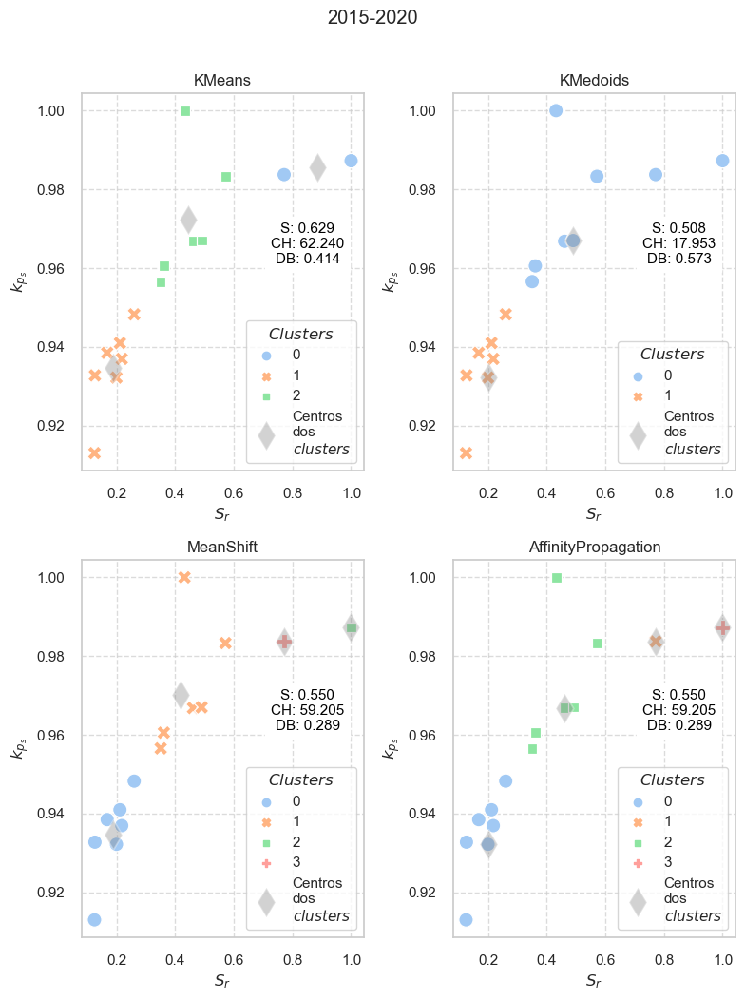

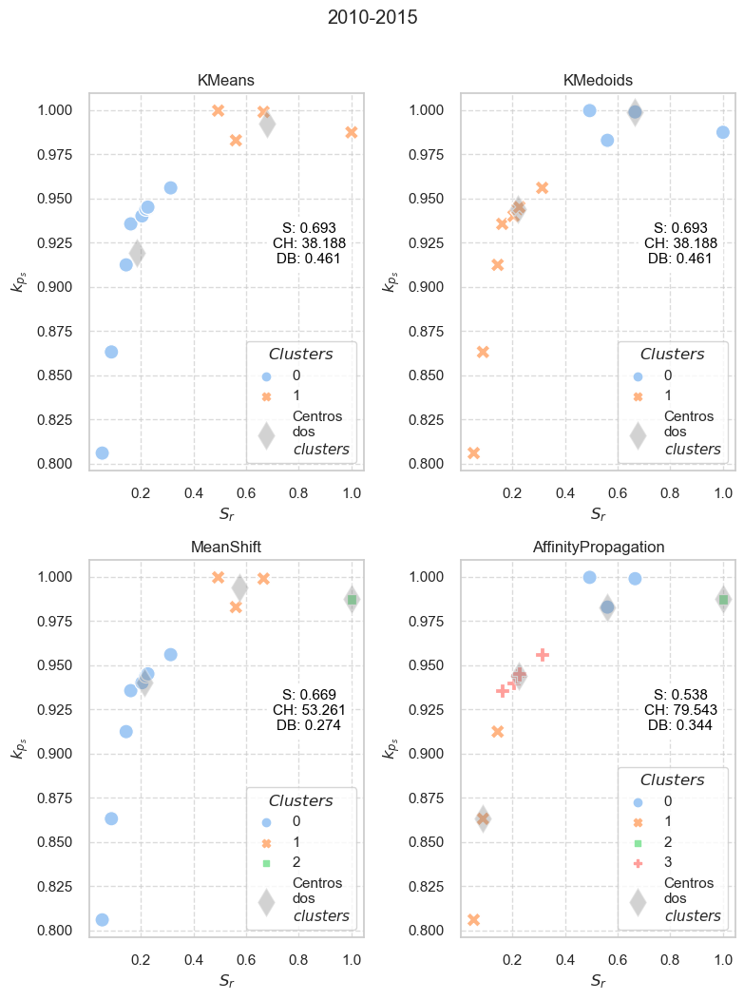

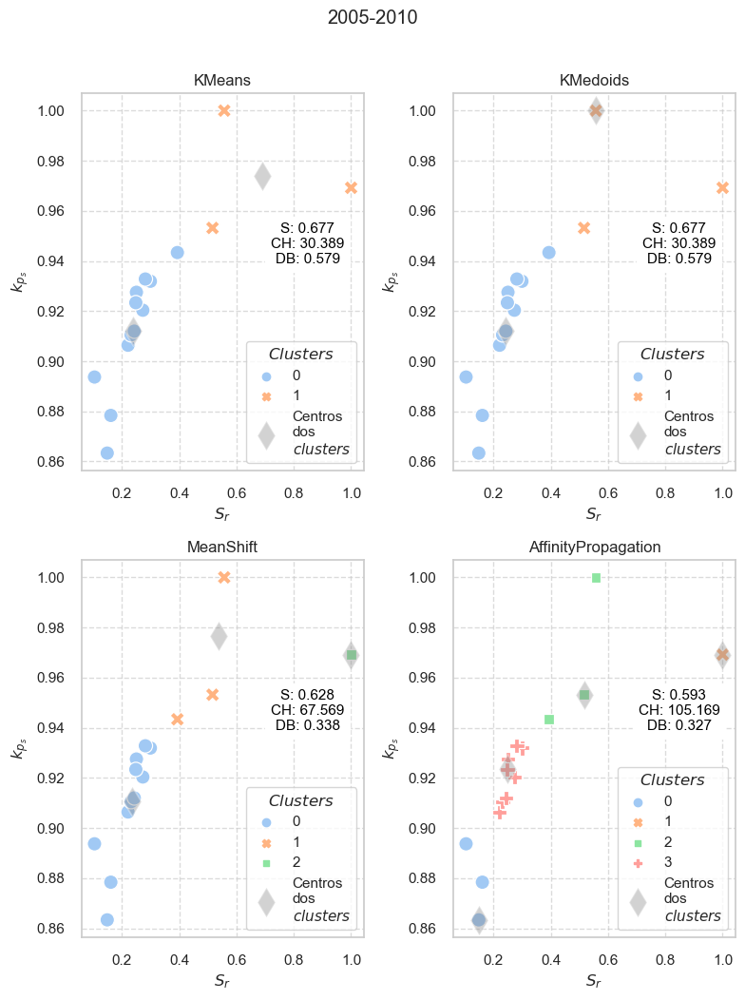

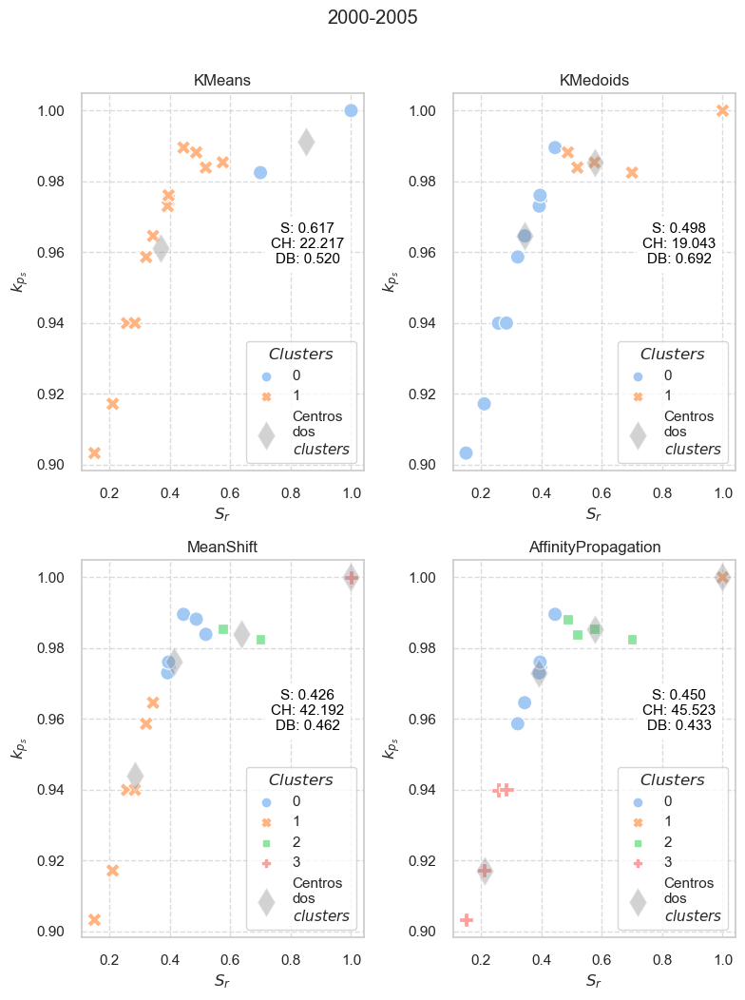

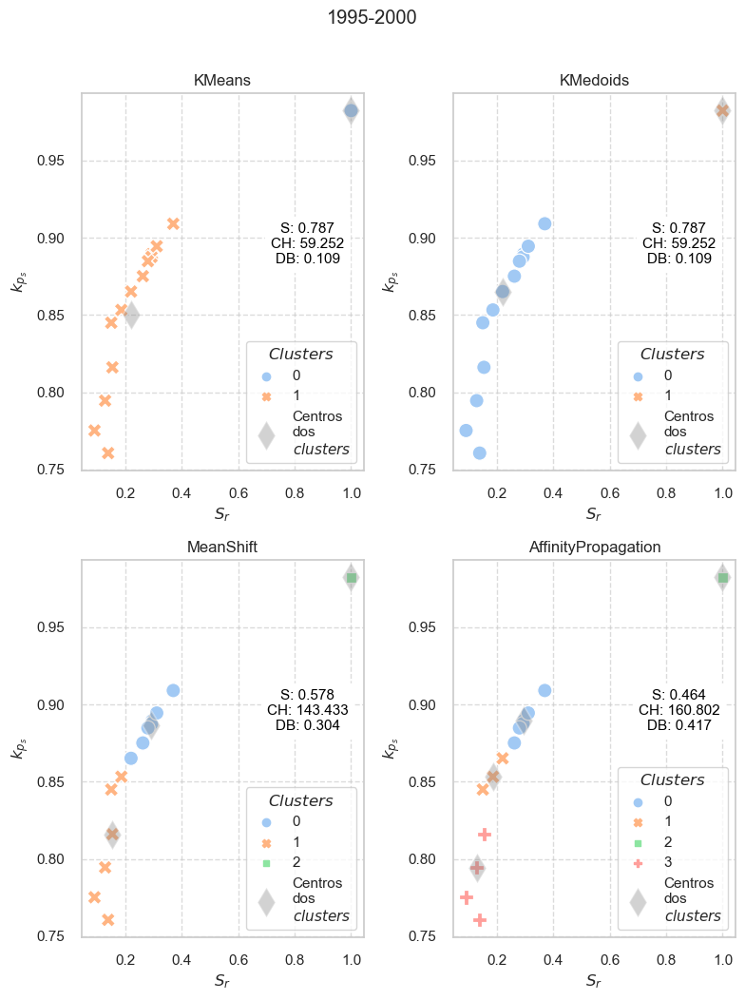

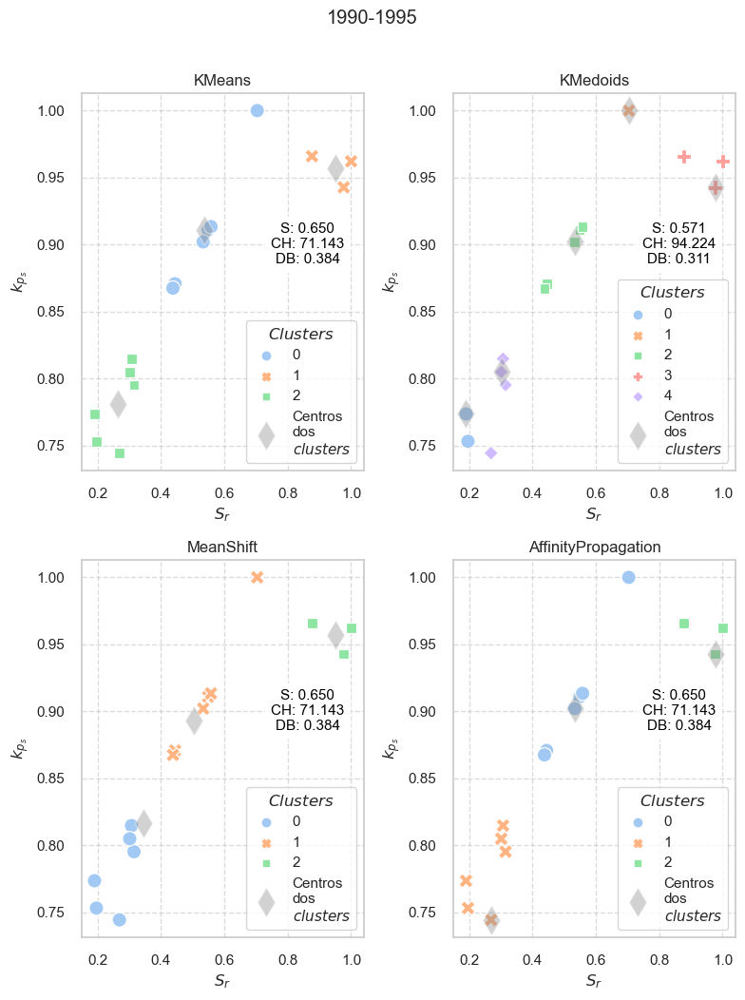

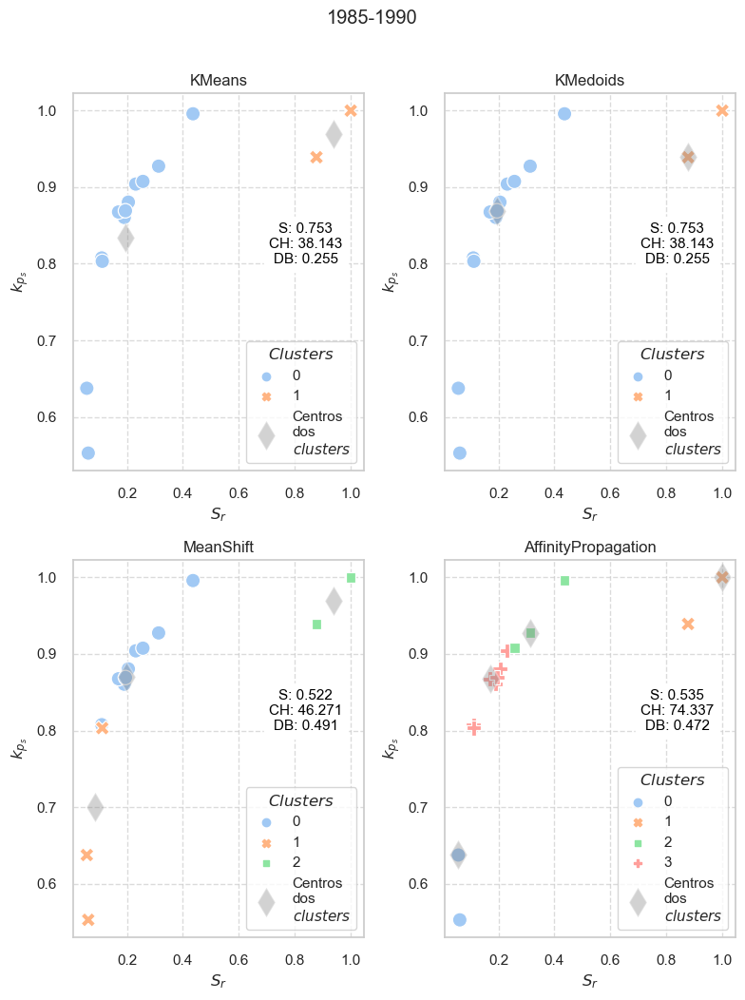

In [186]:
# Colunas de interesse
columns_of_interest = ['KMeans', 'KMedoids', 'MeanShift', 'AffinityPropagation']

for interval, df in scaled_df.items():
    
    # Cria uma grade de subplots
    fig, axes = plt.subplots(2, 2, figsize=(8, 10))  # 2 linhas, 2 colunas
    
    for i, column in enumerate(columns_of_interest):
        row = i // 2  # Determina a linha do subplot atual
        col = i % 2   # Determina a coluna do subplot atual
        
        # Gráfico de dispersão
        sns.scatterplot(x='scaled_Sr', y='scaled_kps', hue=column, data=df, style=column, 
                        markers=True, palette='pastel', legend='full', s=120, ax=axes[row, col])
        
        axes[row, col].set_title(column)
        axes[row, col].set_xlabel(r'$S_{r}$')
        axes[row, col].set_ylabel(r'$k_{p_s}$')
        
        # Define a grade
        axes[row, col].grid(axis='x', linestyle='--', alpha=0.7)
        axes[row, col].grid(axis='y', linestyle='--', alpha=0.7)
        
        # Adiciona os centros dos cluster
        if column == 'KMeans':
            algorithm_centers = km_results['centers']
        elif column == 'KMedoids':
            algorithm_centers = kmd_results['centers']
        elif column == 'MeanShift':
            algorithm_centers = ms_results['centers']
        elif column == 'AffinityPropagation':
            algorithm_centers = ap_results['centers']
            
        # Verifica se existem centros de cluster para o intervalo e algoritmo atuais
        if interval in algorithm_centers and algorithm_centers[interval] is not None:
            centers_data = algorithm_centers[interval]
            sns.scatterplot(x=centers_data[:, 0], y=centers_data[:, 1], color='gray', 
                            marker='d', s=250, ax=axes[row, col], alpha=0.35, 
                            label='Centros\ndos'+'\n'+r'$\it{clusters}$')

        # Condição para métricas de avaliação
        if column == 'KMeans':
            sil_value = km_results['silhouette']
            ch_value = km_results['calinski_harabasz']
            db_value = km_results['davies_bouldin']
        elif column == 'KMedoids':
            sil_value = kmd_results['silhouette']
            ch_value = kmd_results['calinski_harabasz']
            db_value = kmd_results['davies_bouldin']
        elif column == 'MeanShift':
            sil_value = ms_results['silhouette']
            ch_value = ms_results['calinski_harabasz']
            db_value = ms_results['davies_bouldin']
        elif column == 'AffinityPropagation':
            sil_value = ap_results['silhouette']
            ch_value = ap_results['calinski_harabasz']
            db_value = ap_results['davies_bouldin']
        
        # Verifica se existe um valor de métrica para o intervalo e algoritmo atuais
        if interval in sil_value and sil_value[interval] is not None:
            silhouette_text = f'S: {sil_value[interval]:.3f}'
            ch_text = f'CH: {ch_value[interval]:.3f}'
            db_text = f'DB: {db_value[interval]:.3f}'
            axes[row, col].text(0.80, 0.60, silhouette_text + '\n' + ch_text + '\n' + db_text, 
                                transform=axes[row, col].transAxes,
                                ha='center', va='center', fontsize=11, color='black',
                                bbox=dict(facecolor='white'))

    # Ajustae legenda fora do loop
    for ax in axes.flatten():
        legend = ax.legend(title=r'$\it{Clusters}$', 
                           frameon=True, loc='lower right')
    
    # Ajusta layout
    plt.tight_layout()
    plt.suptitle(interval, y=1.05)

    # Salva os gráficos
    plt.savefig(f'outputs/{interval}_clusters_plots.jpg', dpi=300)

    # Exibe e fecha janela de figura
    plt.show()
    plt.close()

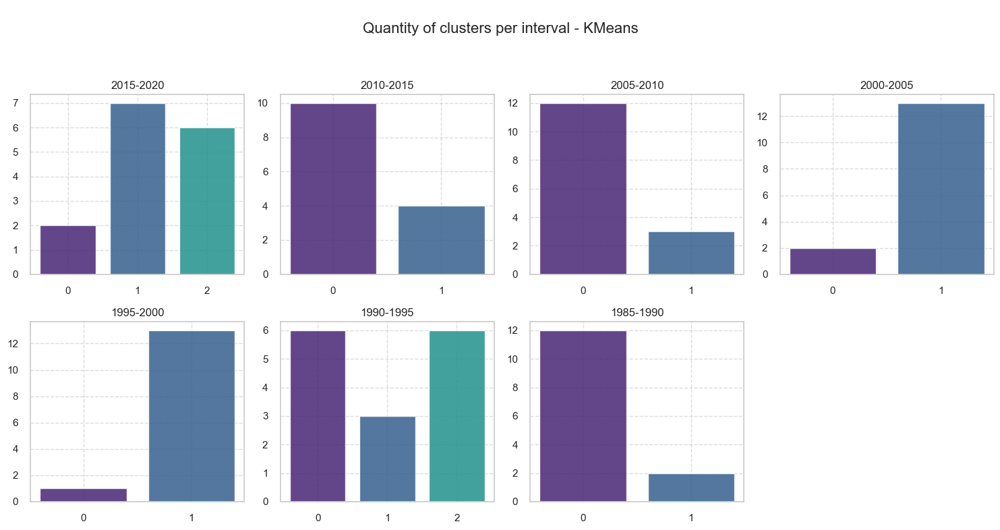

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
KMeans,,,,,,,
0,12,6,1,2,12,10,2
1,2,3,13,13,3,4,7
2,0,6,0,0,0,0,6


In [187]:
# KMeans clusters
clusters_sizes(col='KMeans')

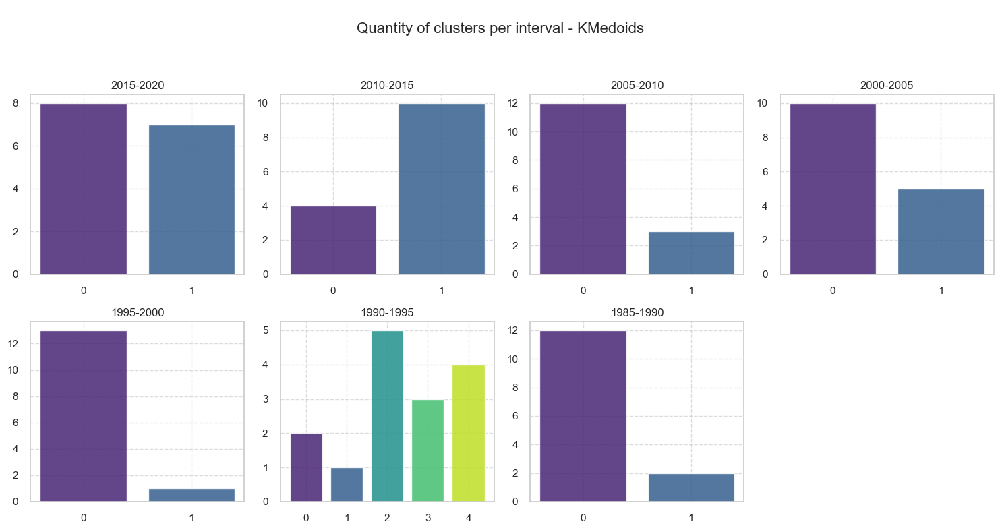

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
KMedoids,,,,,,,
0,12,2,13,10,12,4,8
1,2,1,1,5,3,10,7
2,0,5,0,0,0,0,0
3,0,3,0,0,0,0,0
4,0,4,0,0,0,0,0


In [188]:
# KMedoids clusters
clusters_sizes(col='KMedoids')

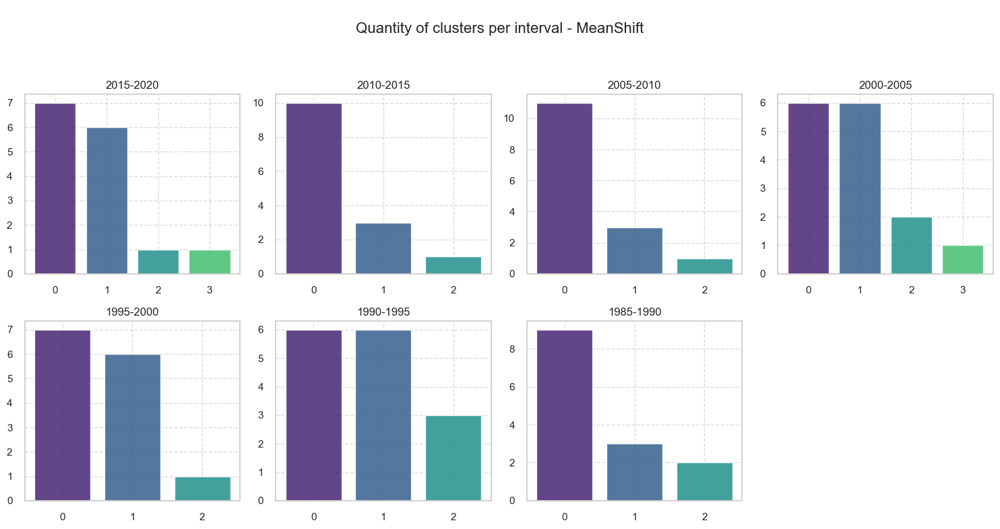

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
MeanShift,,,,,,,
0,9,6,7,6,11,10,7
1,3,6,6,6,3,3,6
2,2,3,1,2,1,1,1
3,0,0,0,1,0,0,1


In [189]:
# MeanShift clusters
clusters_sizes(col='MeanShift')

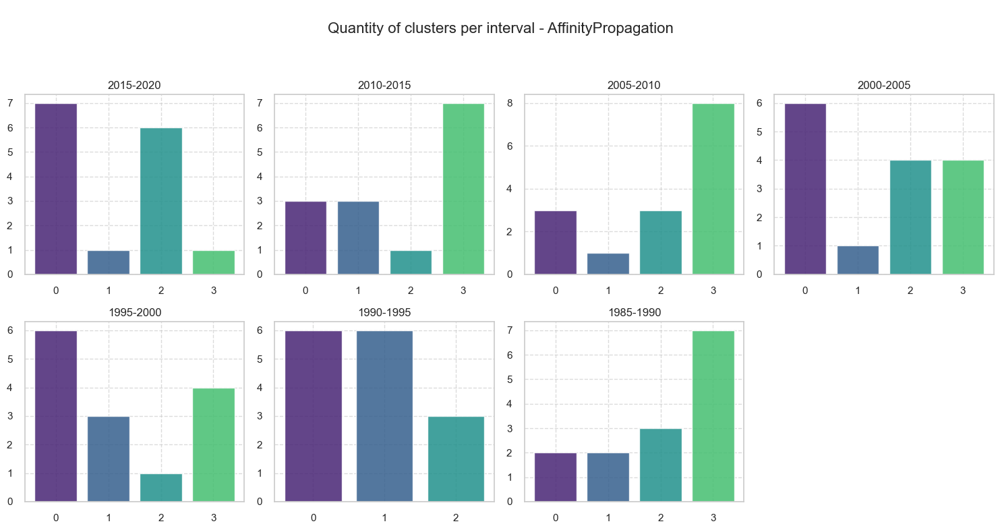

,1985-1990,1990-1995,1995-2000,2000-2005,2005-2010,2010-2015,2015-2020
AffinityPropagation,,,,,,,
0,2,6,6,6,3,3,7
1,2,6,3,1,1,3,1
2,3,3,1,4,3,1,6
3,7,0,4,4,8,7,1


In [190]:
# AffinityPropagation clusters
clusters_sizes(col='AffinityPropagation')

In [191]:
# Descrição dos clusters KMeans
km_descrs = clusters_descriptions(col='KMeans')
print_clusters_descriptions(descriptions_dict=km_descrs)


2015-2020:

KMeans                   0         1         2
scaled_Sr  count  2.000000  7.000000  6.000000
           mean   0.885716  0.186335  0.443895
           std    0.161622  0.050028  0.082947
           min    0.771432  0.124202  0.350059
           25%    0.828574  0.146503  0.378409
           50%    0.885716  0.199122  0.445911
           75%    0.942858  0.214167  0.482434
           max    1.000000  0.259680  0.570975
scaled_kps count  2.000000  7.000000  6.000000
           mean   0.985515  0.934682  0.972385
           std    0.002494  0.010971  0.016316
           min    0.983752  0.913046  0.956585
           25%    0.984633  0.932496  0.962139
           50%    0.985515  0.936972  0.966917
           75%    0.986396  0.939746  0.979238
           max    0.987278  0.948271  1.000000


2010-2015:

KMeans                    0         1
scaled_Sr  count  10.000000  4.000000
           mean    0.185740  0.680123
           std     0.075897  0.224757
           min     0.0

In [192]:
# Descrição dos clusters KMedoids
kmd_descrs = clusters_descriptions(col='KMedoids')
print_clusters_descriptions(descriptions_dict=kmd_descrs)


2015-2020:

KMedoids                 0         1
scaled_Sr  count  8.000000  7.000000
           mean   0.554351  0.186335
           std    0.224668  0.050028
           min    0.350059  0.124202
           25%    0.413706  0.146503
           50%    0.475112  0.199122
           75%    0.621089  0.214167
           max    1.000000  0.259680
scaled_kps count  8.000000  7.000000
           mean   0.975667  0.934682
           std    0.015099  0.010971
           min    0.956585  0.913046
           25%    0.965264  0.932496
           50%    0.975161  0.936972
           75%    0.984633  0.939746
           max    1.000000  0.948271


2010-2015:

KMedoids                 0          1
scaled_Sr  count  4.000000  10.000000
           mean   0.680123   0.185740
           std    0.224757   0.075897
           min    0.493521   0.052964
           25%    0.544075   0.148238
           50%    0.613485   0.211575
           75%    0.749533   0.224513
           max    1.000000   0.313153
sc

In [193]:
# Descrição dos clusters MeanShift
ms_descrs = clusters_descriptions(col='MeanShift')
print_clusters_descriptions(descriptions_dict=ms_descrs)


2015-2020:

MeanShift                0         1         2         3
scaled_Sr  count  7.000000  6.000000  1.000000  1.000000
           mean   0.186335  0.443895  1.000000  0.771432
           std    0.050028  0.082947       NaN       NaN
           min    0.124202  0.350059  1.000000  0.771432
           25%    0.146503  0.378409  1.000000  0.771432
           50%    0.199122  0.445911  1.000000  0.771432
           75%    0.214167  0.482434  1.000000  0.771432
           max    0.259680  0.570975  1.000000  0.771432
scaled_kps count  7.000000  6.000000  1.000000  1.000000
           mean   0.934682  0.972385  0.987278  0.983752
           std    0.010971  0.016316       NaN       NaN
           min    0.913046  0.956585  0.987278  0.983752
           25%    0.932496  0.962139  0.987278  0.983752
           50%    0.936972  0.966917  0.987278  0.983752
           75%    0.939746  0.979238  0.987278  0.983752
           max    0.948271  1.000000  0.987278  0.983752


2010-2015:

Mean

In [194]:
# Descrição dos clusters AffinityPropagation
db_descrs = clusters_descriptions(col='AffinityPropagation')
print_clusters_descriptions(descriptions_dict=db_descrs)


2015-2020:

AffinityPropagation         0         1         2         3
scaled_Sr  count     7.000000  1.000000  6.000000  1.000000
           mean      0.186335  0.771432  0.443895  1.000000
           std       0.050028       NaN  0.082947       NaN
           min       0.124202  0.771432  0.350059  1.000000
           25%       0.146503  0.771432  0.378409  1.000000
           50%       0.199122  0.771432  0.445911  1.000000
           75%       0.214167  0.771432  0.482434  1.000000
           max       0.259680  0.771432  0.570975  1.000000
scaled_kps count     7.000000  1.000000  6.000000  1.000000
           mean      0.934682  0.983752  0.972385  0.987278
           std       0.010971       NaN  0.016316       NaN
           min       0.913046  0.983752  0.956585  0.987278
           25%       0.932496  0.983752  0.962139  0.987278
           50%       0.936972  0.983752  0.966917  0.987278
           75%       0.939746  0.983752  0.979238  0.987278
           max       0.9482

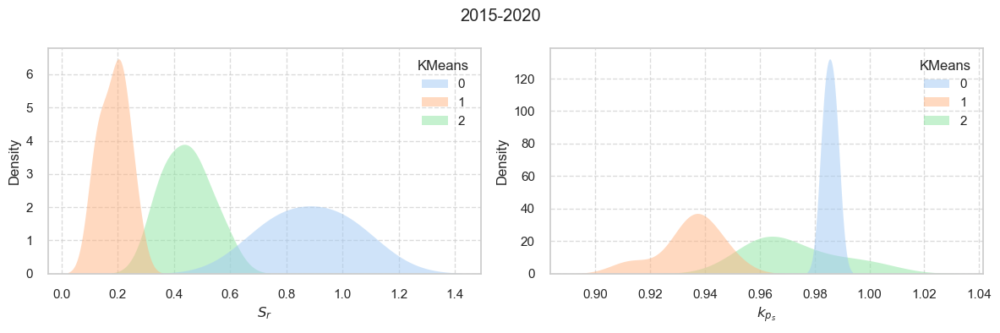

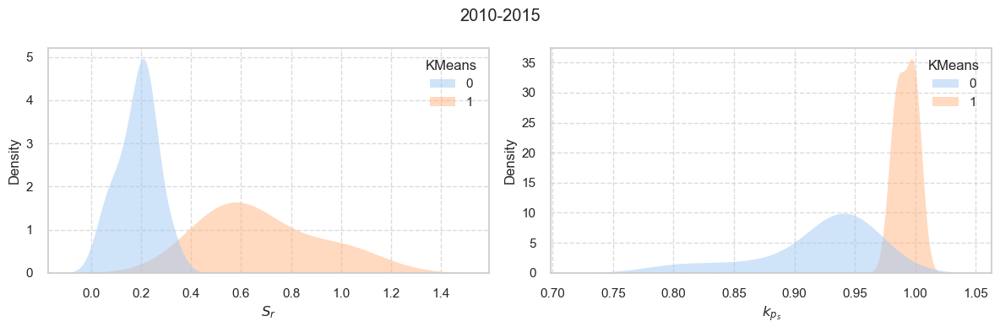

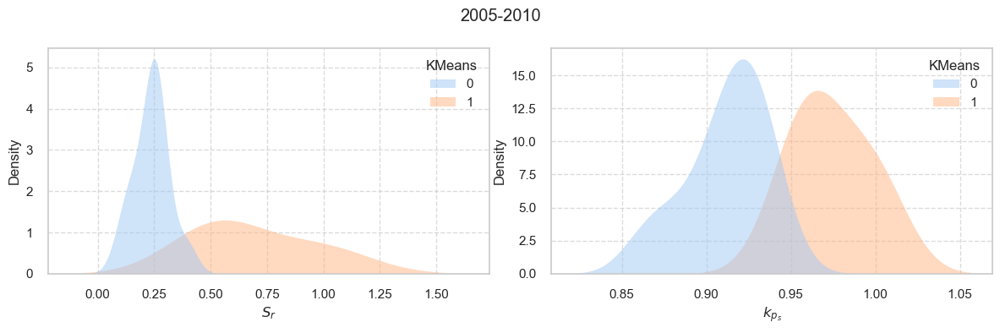

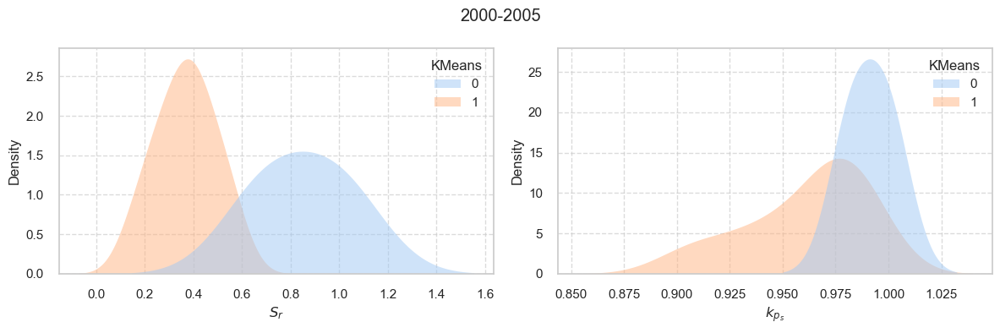

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


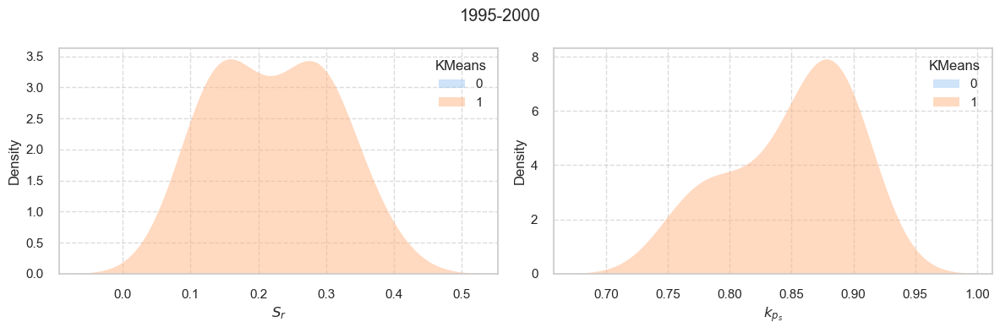

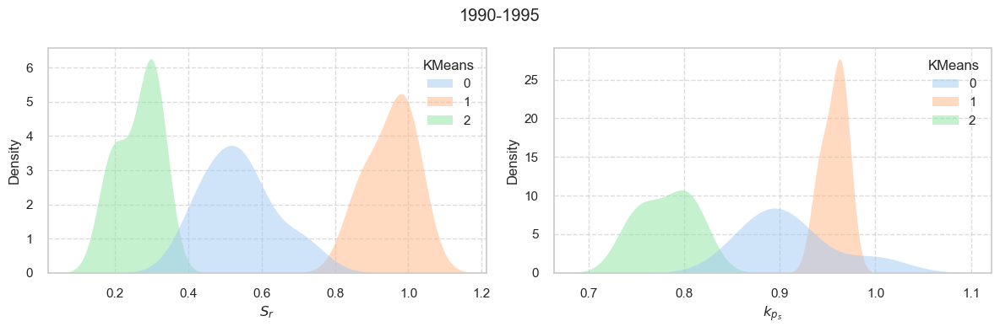

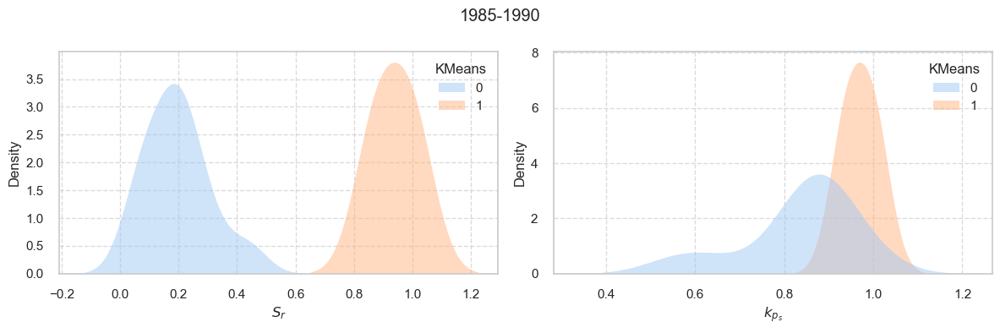

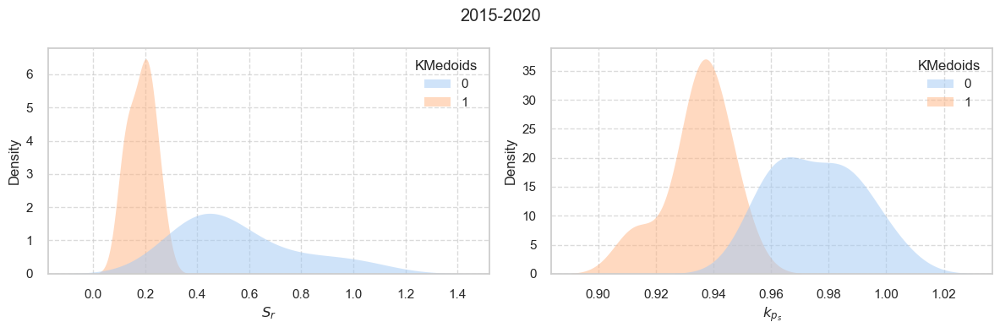

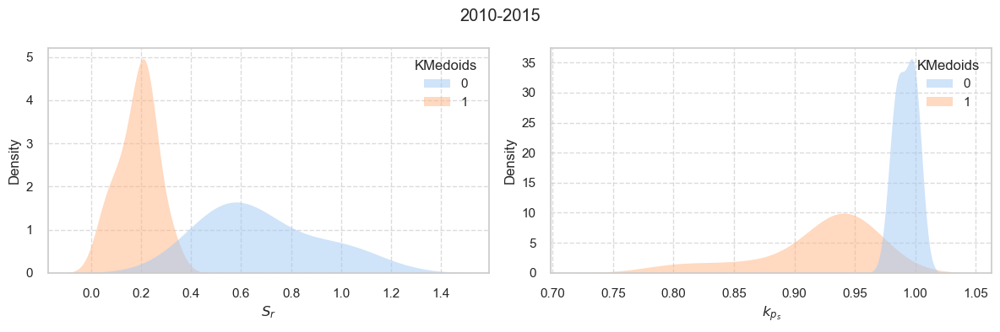

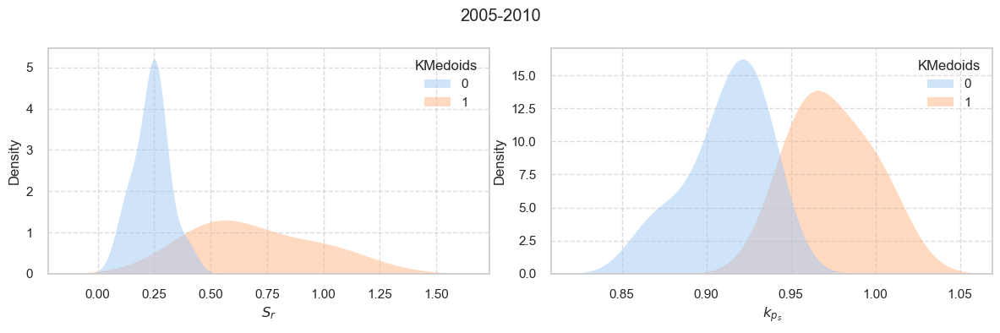

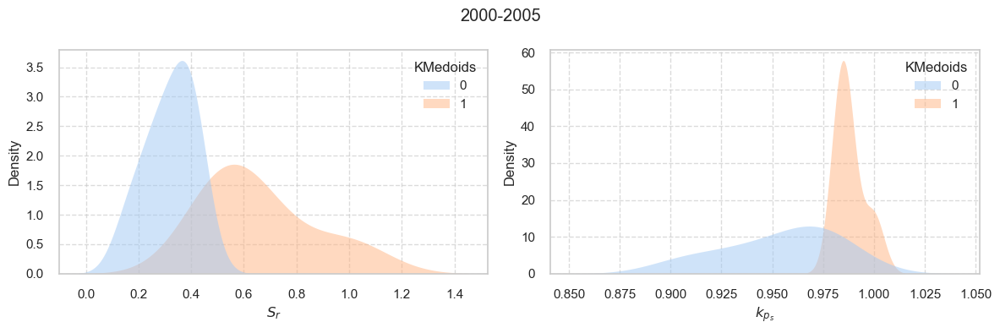

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


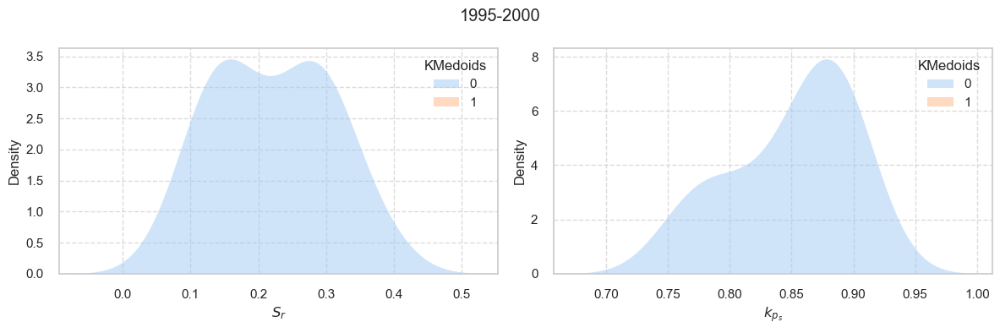

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


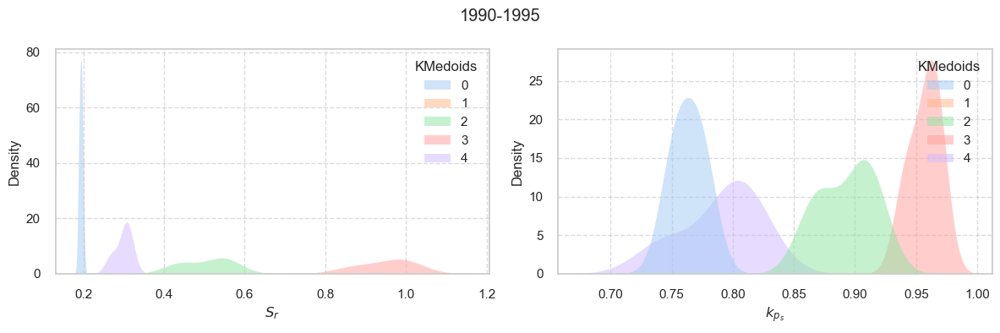

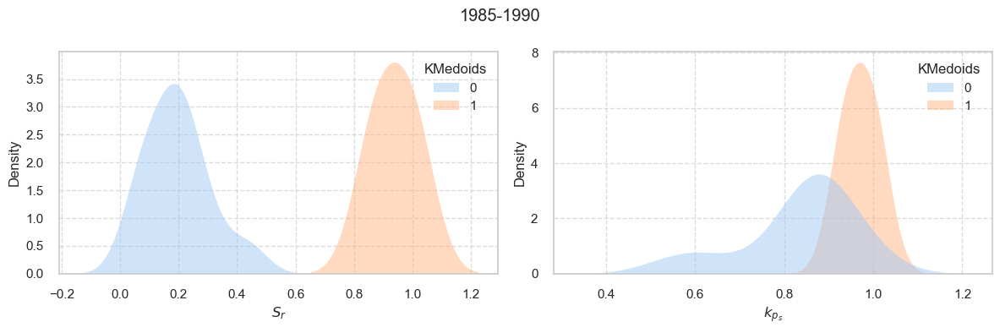

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


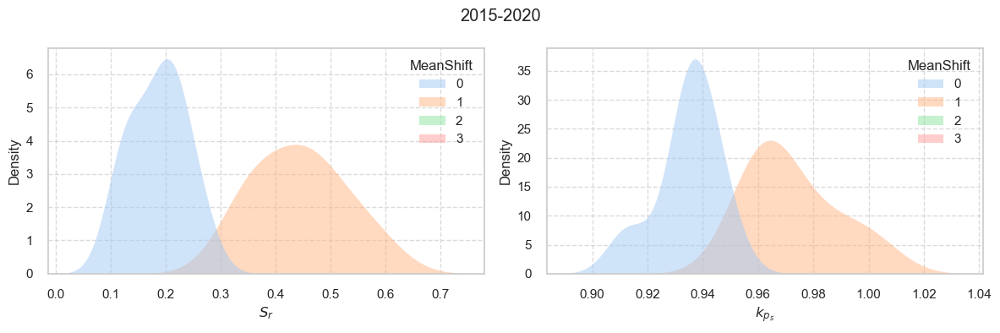

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


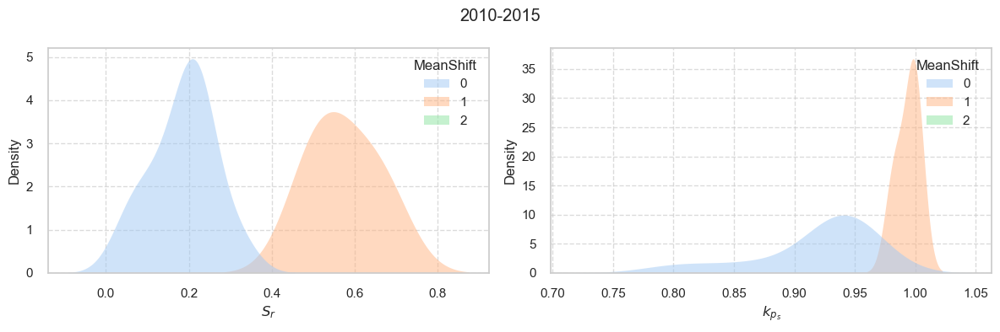

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


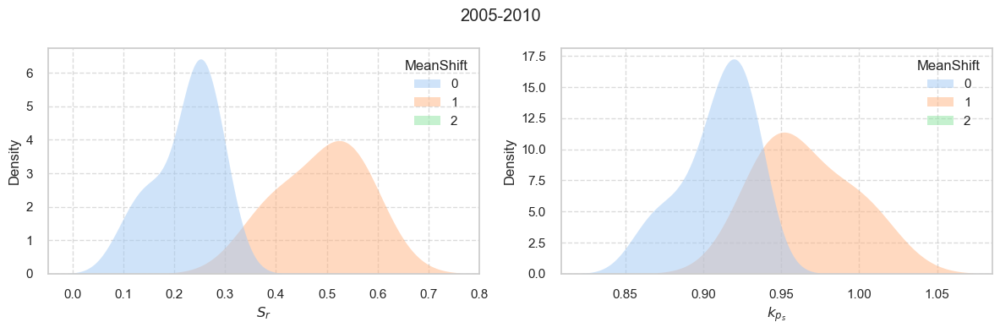

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


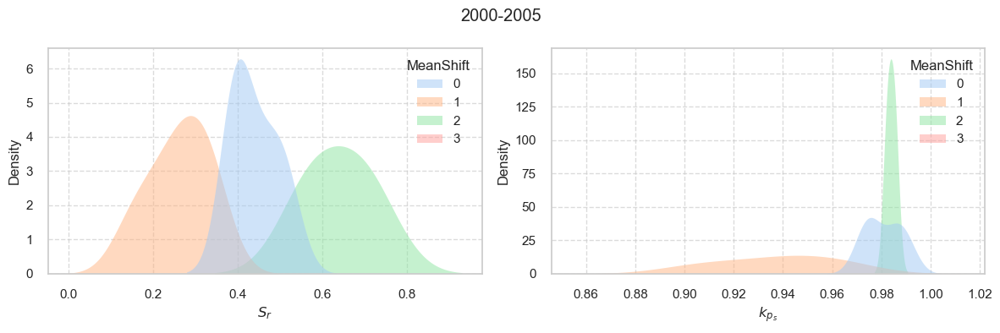

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


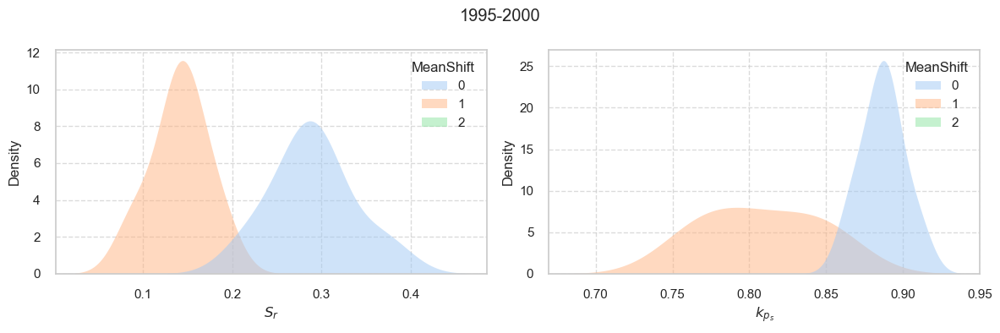

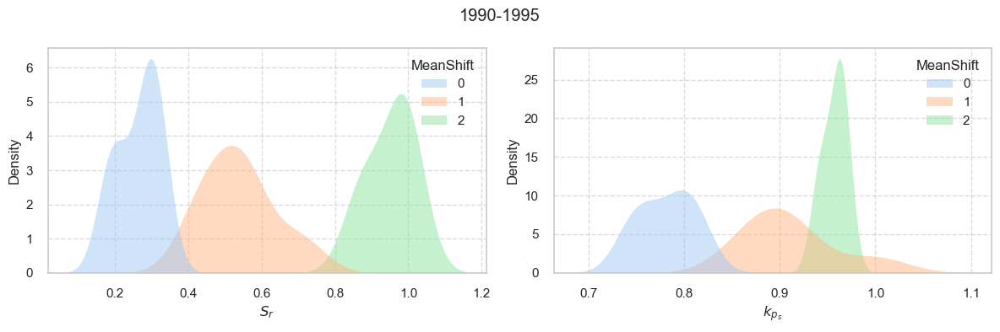

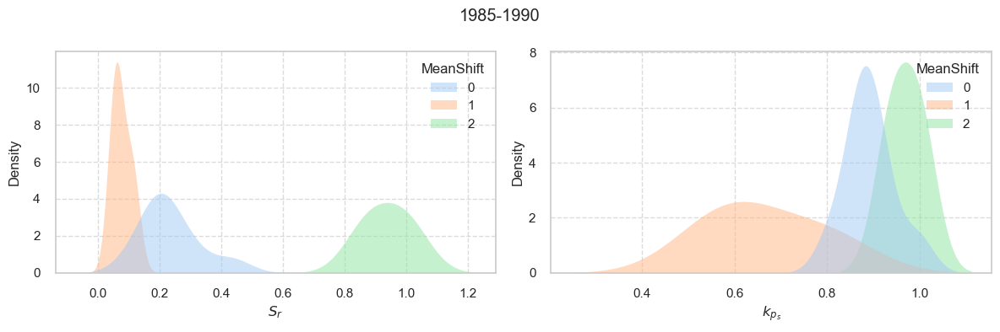

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


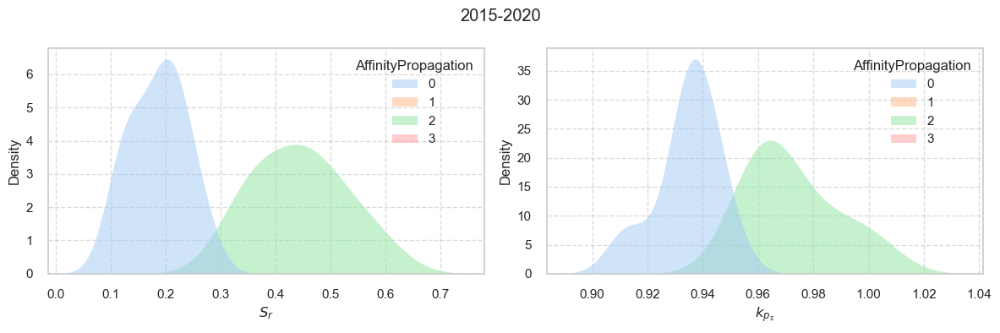

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


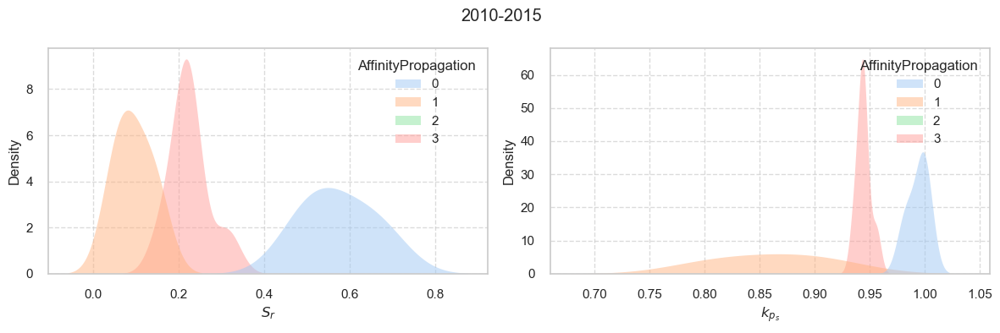

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


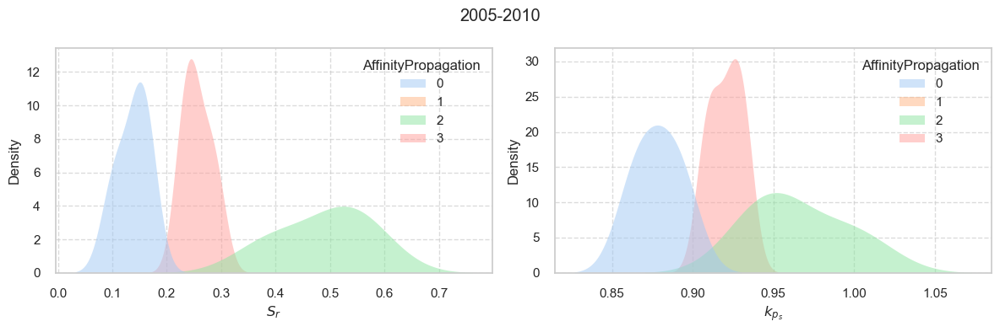

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


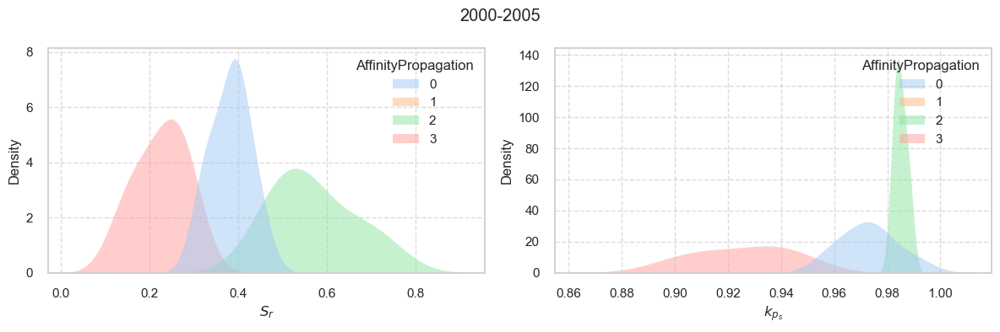

C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_Sr', hue=col, fill=True,
C:\Users\icnso\AppData\Local\Temp\ipykernel_3020\2481160545.py:17: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x='scaled_kps', hue=col, fill=True,


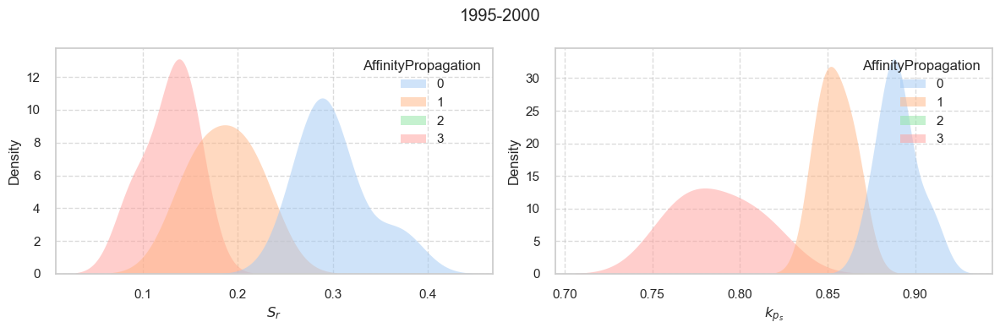

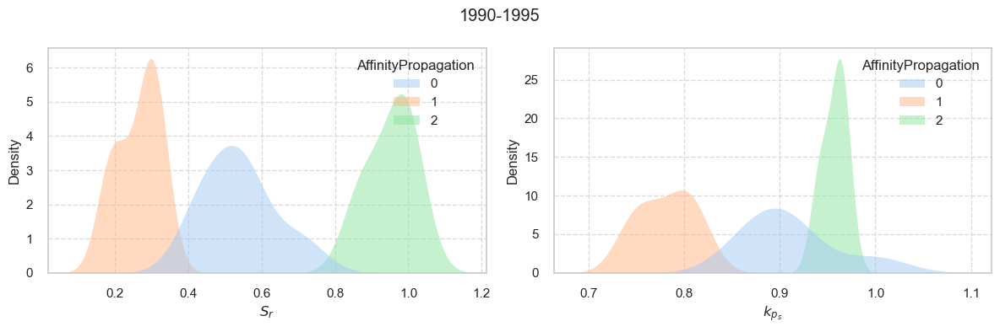

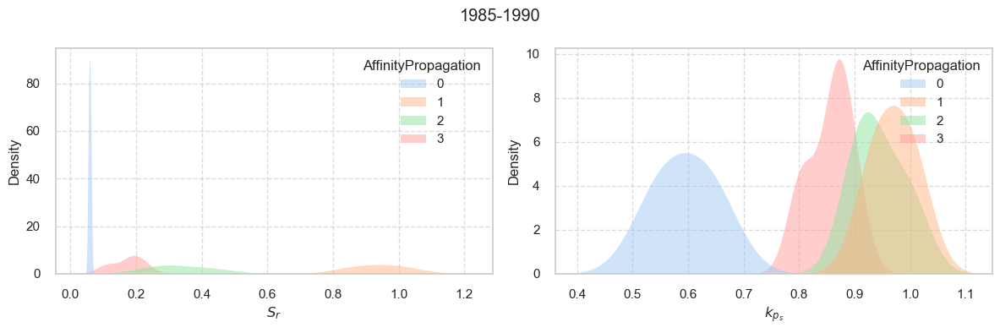

In [195]:
# Gráfico de KDE para cada algoritmo de agrupamento por intervalo
methods = ['KMeans', 'KMedoids', 'MeanShift', 'AffinityPropagation']
for method in methods:
    kde_plot_clusters(col=method)

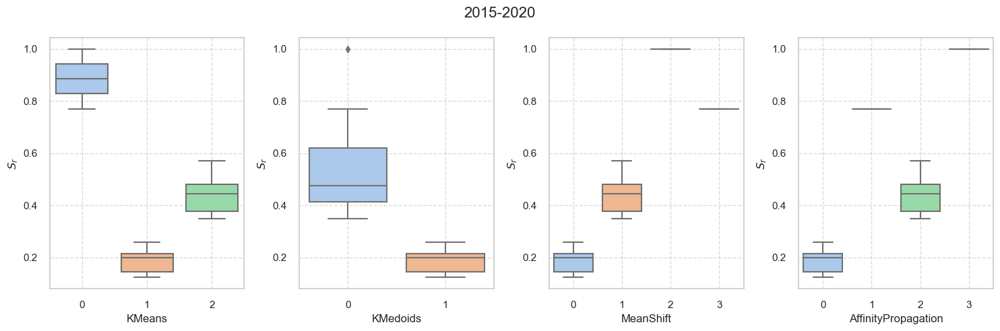

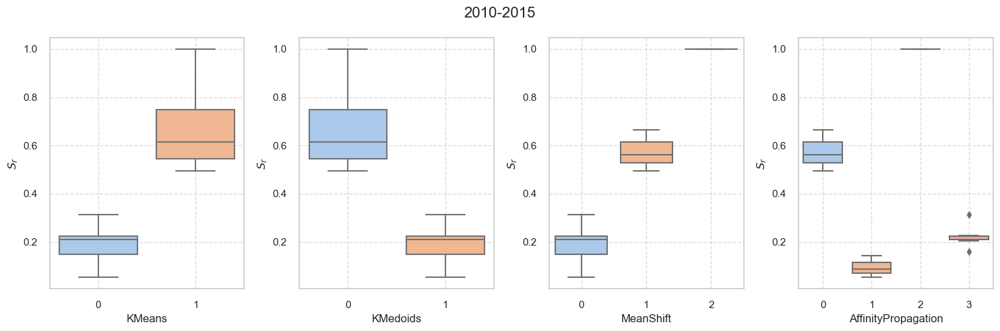

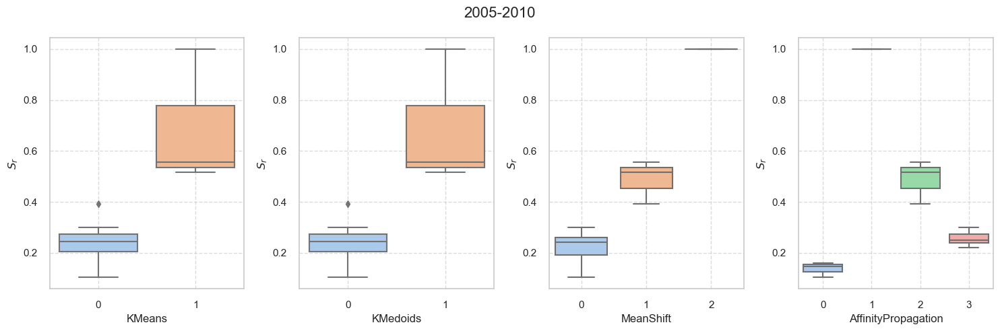

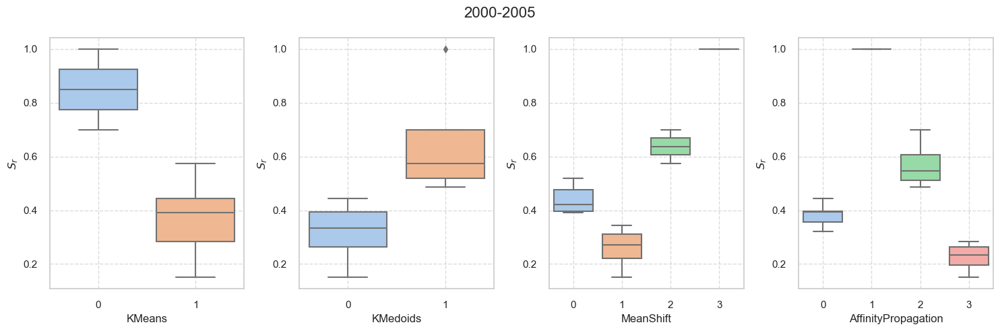

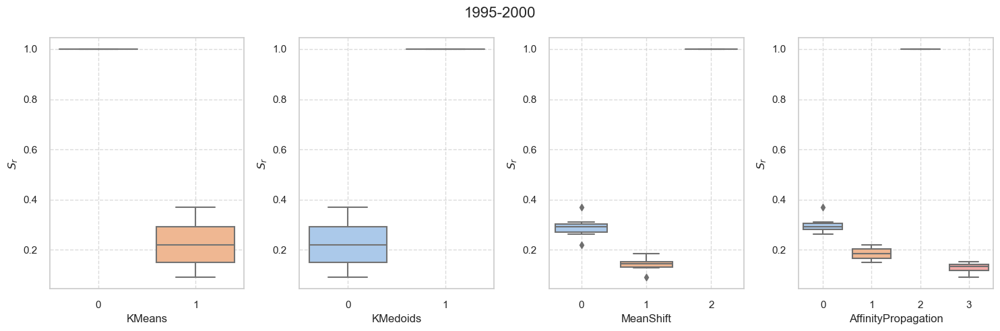

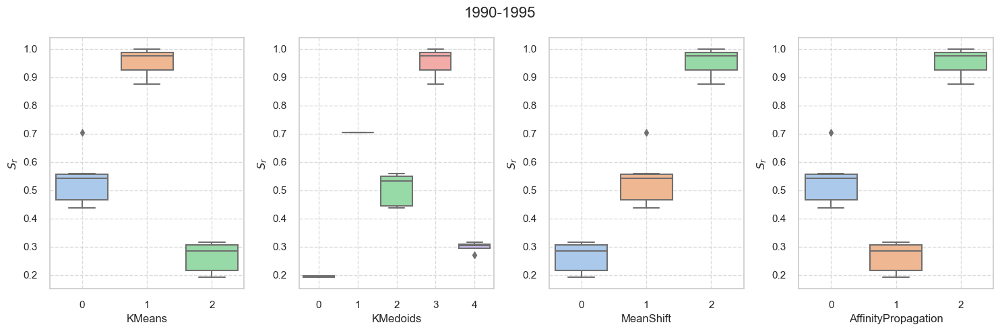

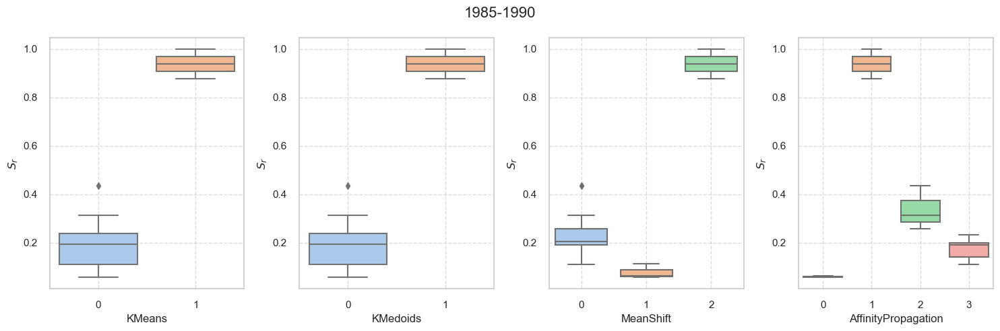

In [196]:
# Box plots para Sr
box_plot_clusters(col='scaled_Sr', y_label=r'$S_{r}$', col_label='Sr')

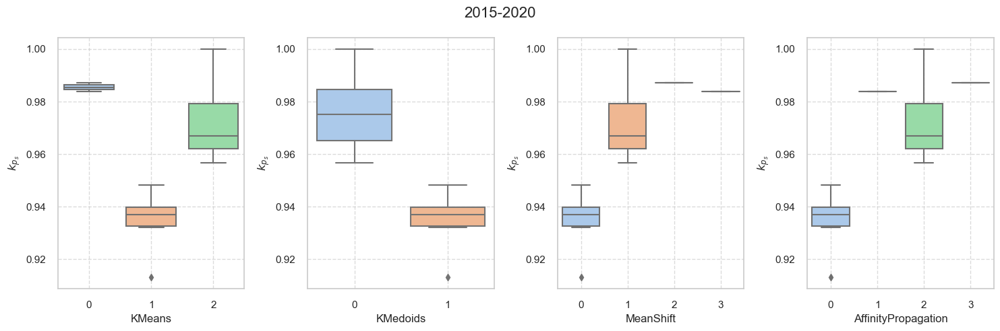

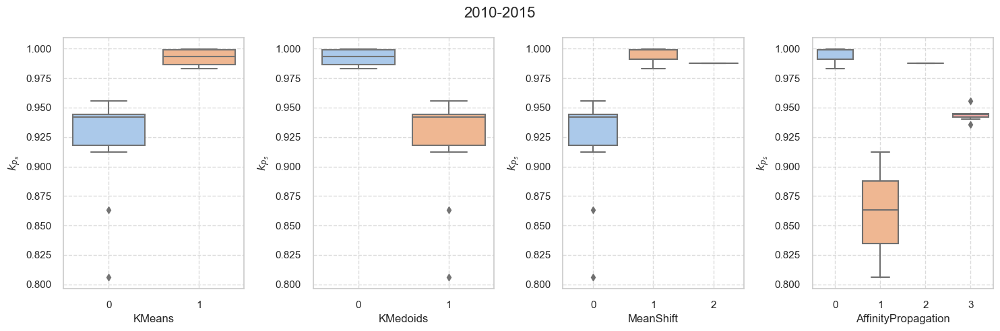

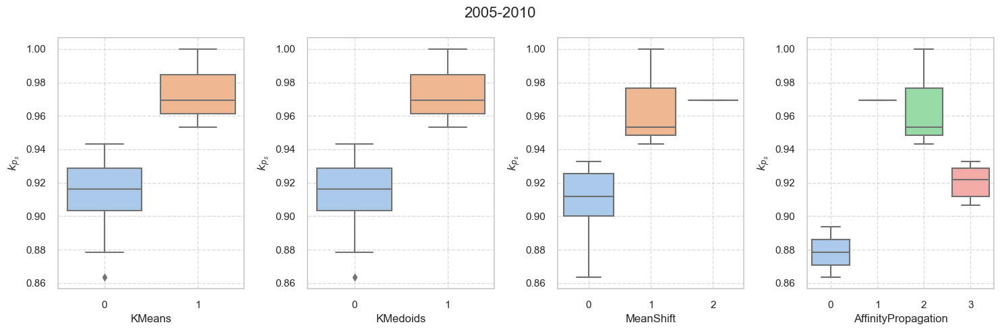

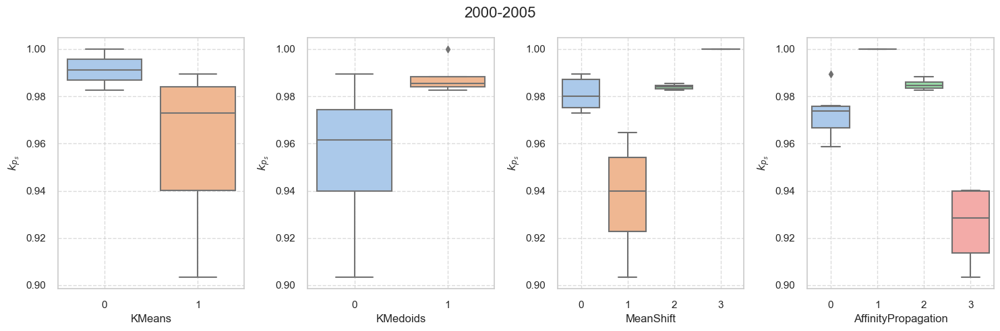

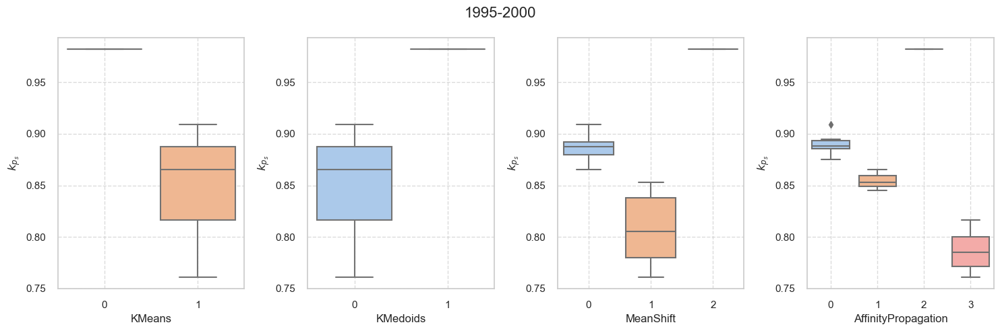

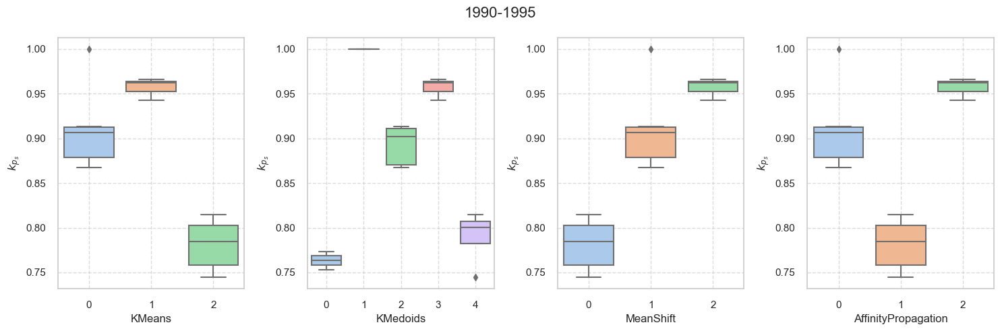

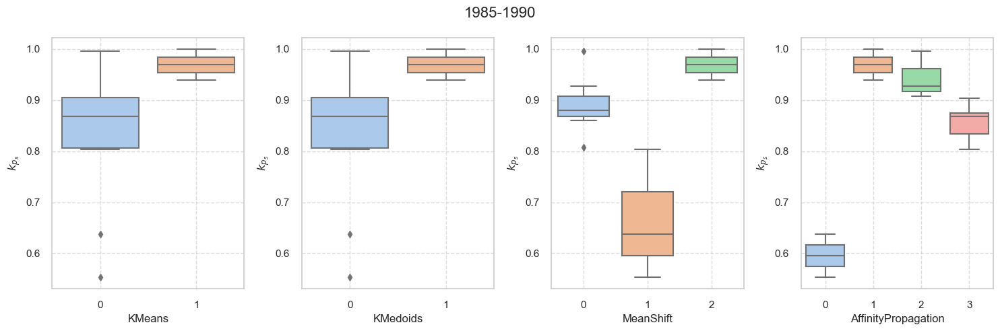

In [197]:
# Box plots para Kp
box_plot_clusters(col='scaled_kps', y_label=r'$k_{p_s}$', col_label='Kps')

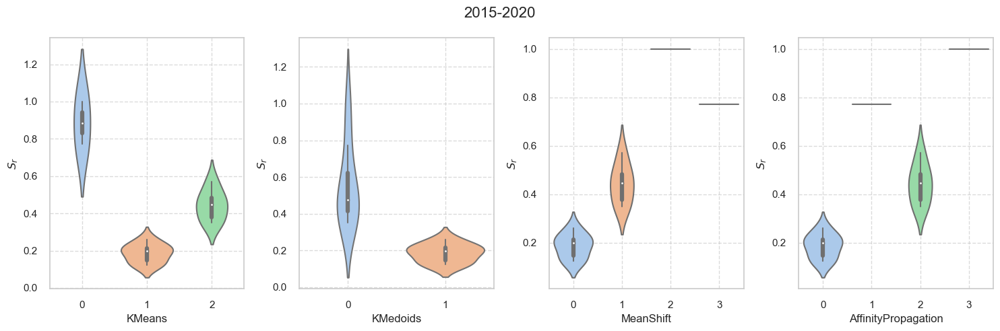

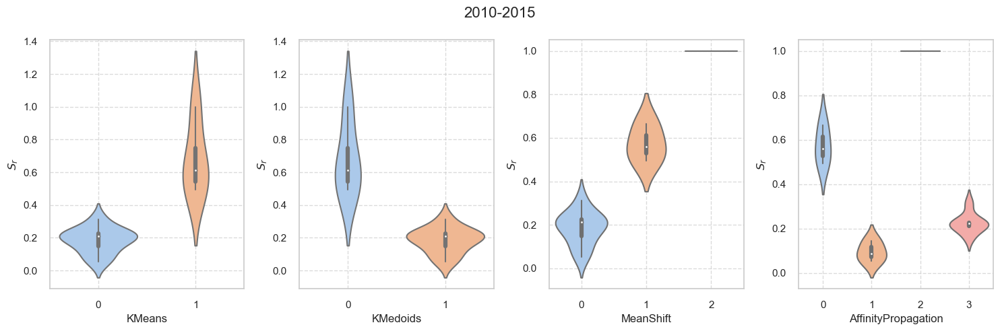

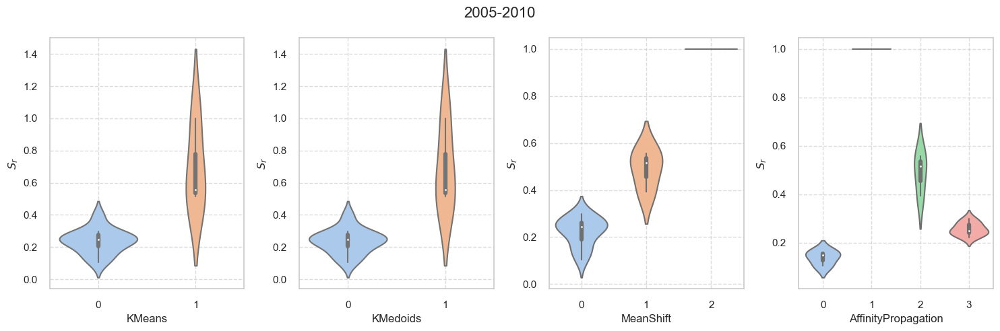

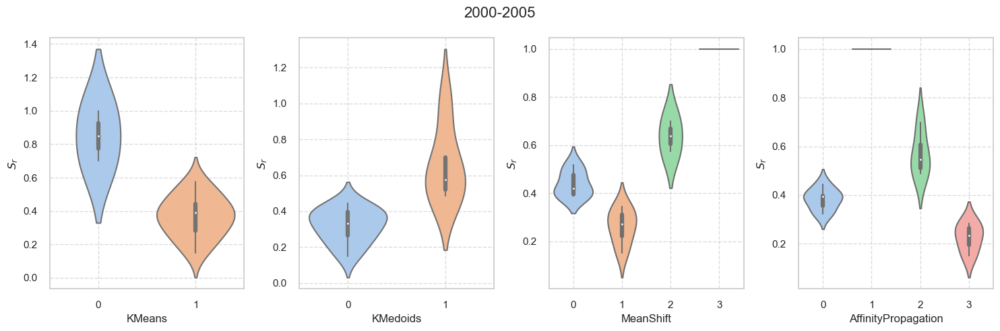

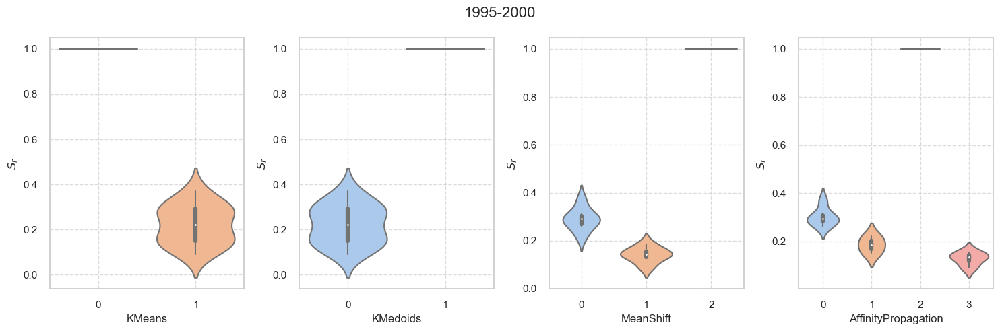

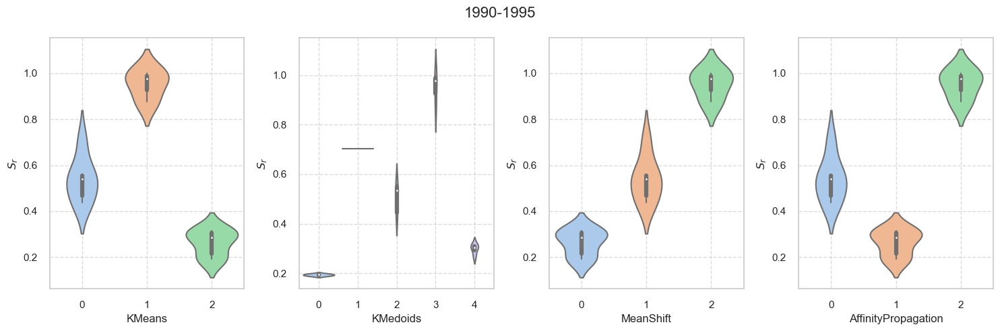

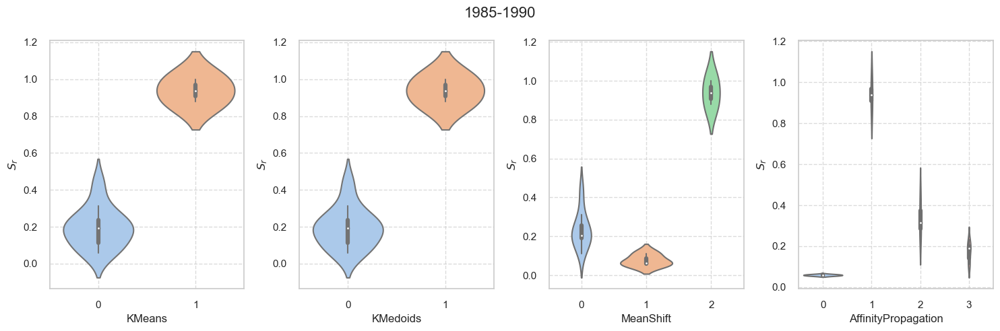

In [198]:
# Violin plots para Sr
violin_plot_clusters(col='scaled_Sr', y_label=r'$S_{r}$', col_label='Sr')

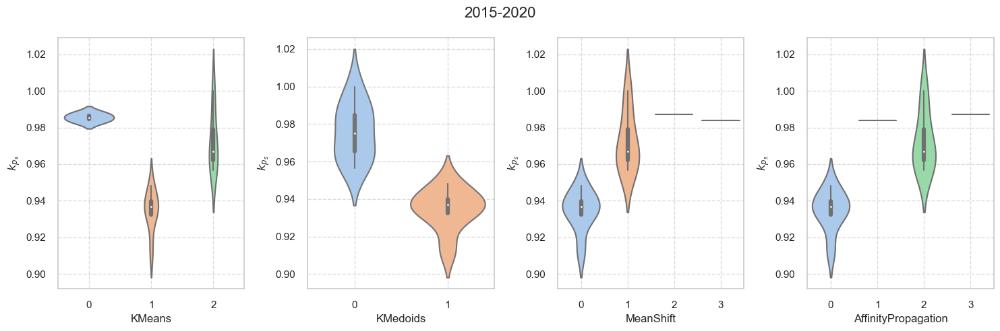

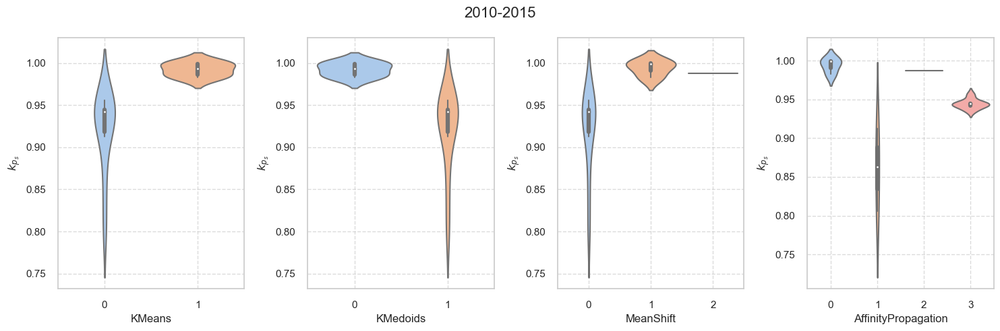

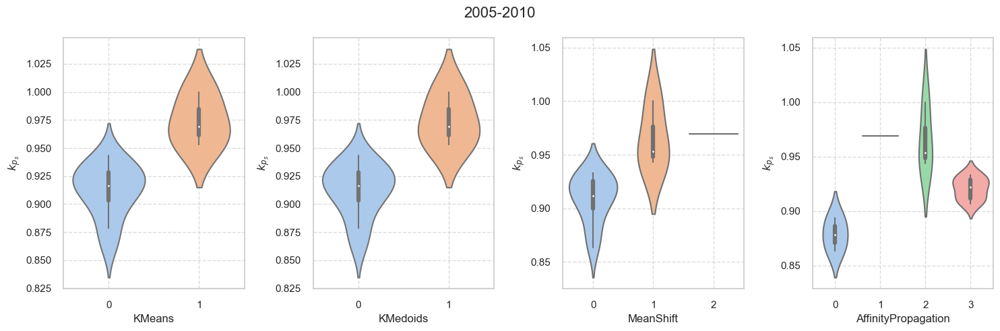

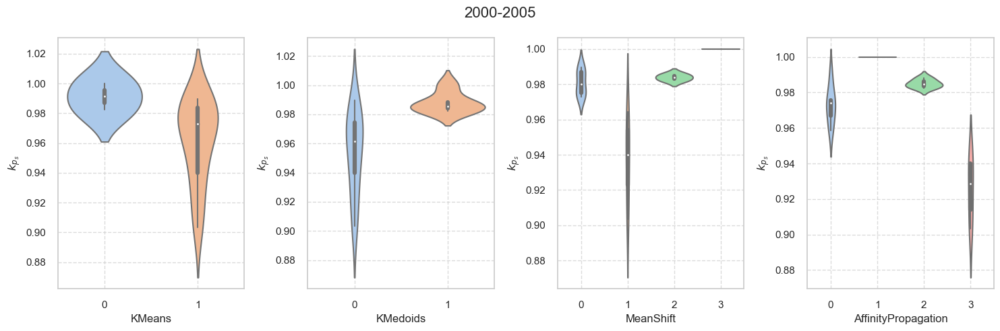

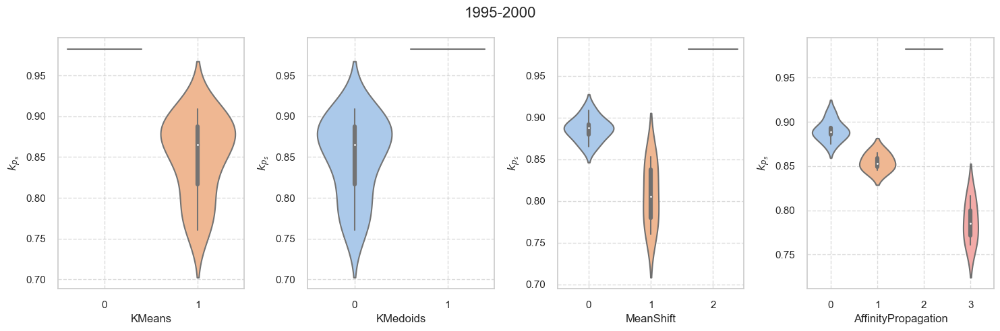

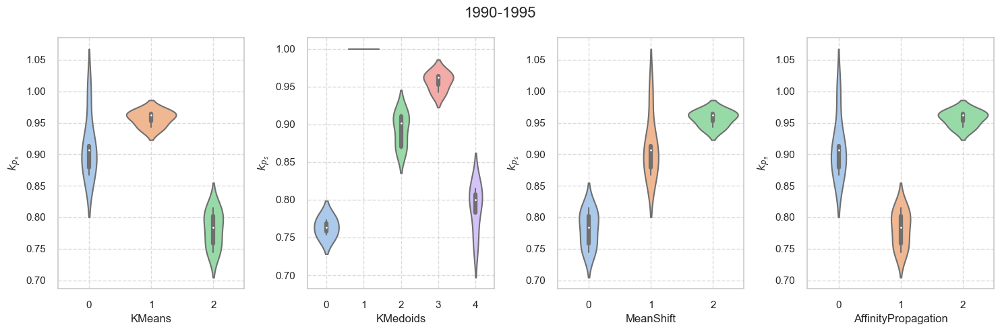

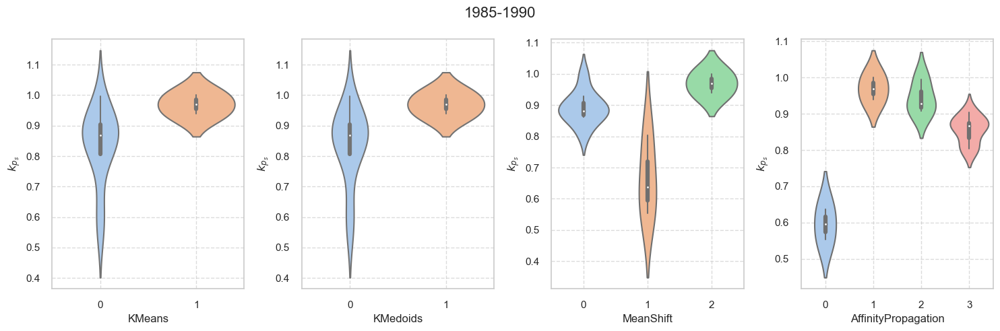

In [199]:
# Violin plots para Kp
violin_plot_clusters(col='scaled_kps', y_label=r'$k_{p_s}$', col_label='Kps')

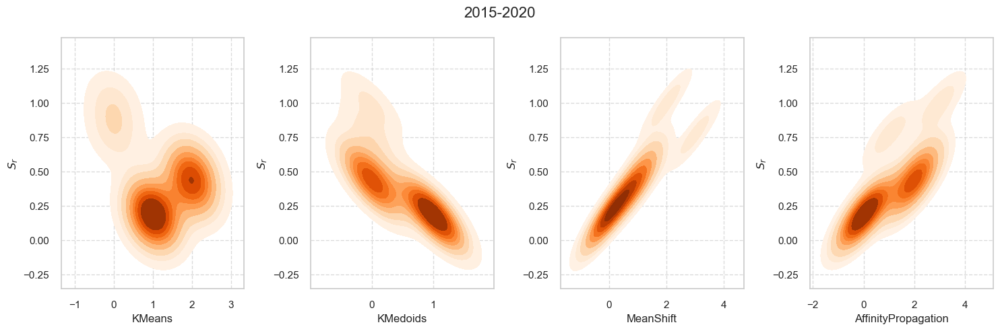

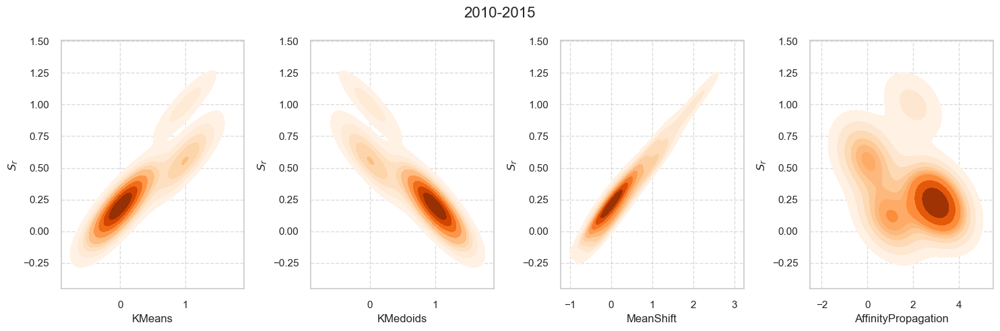

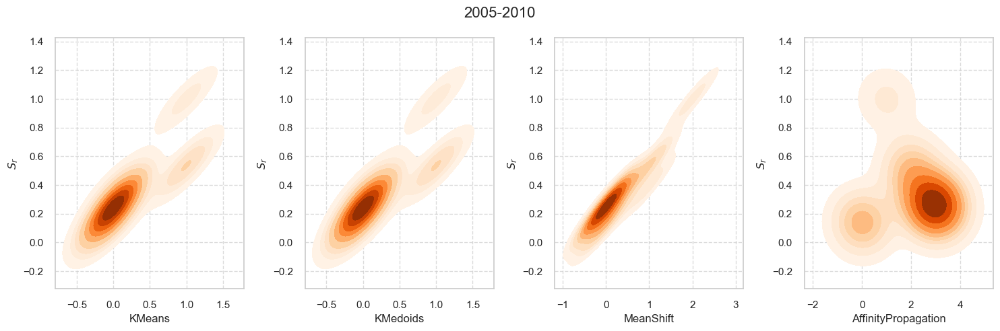

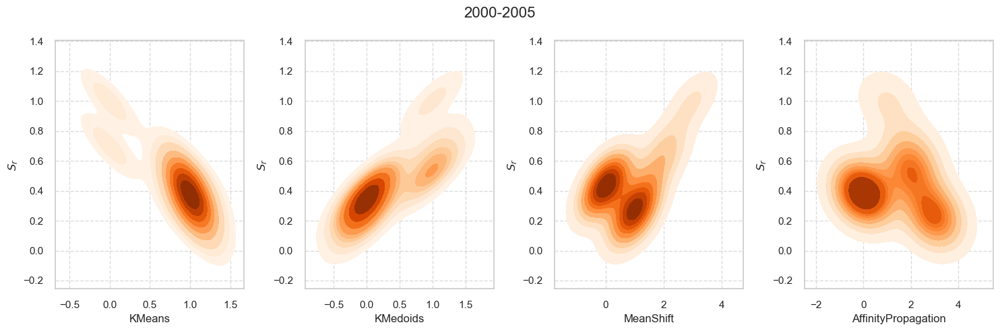

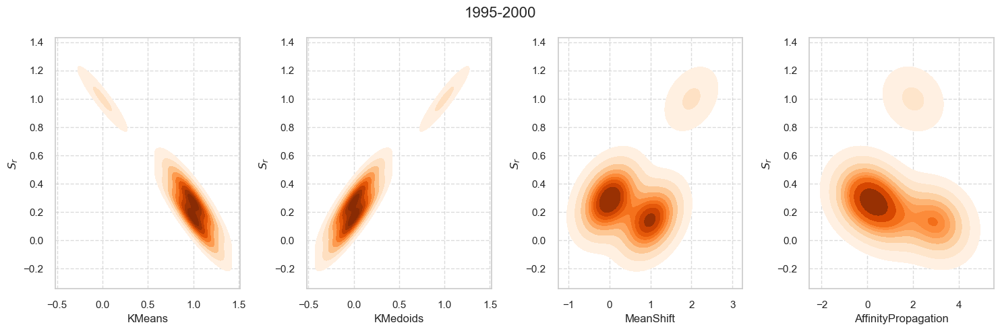

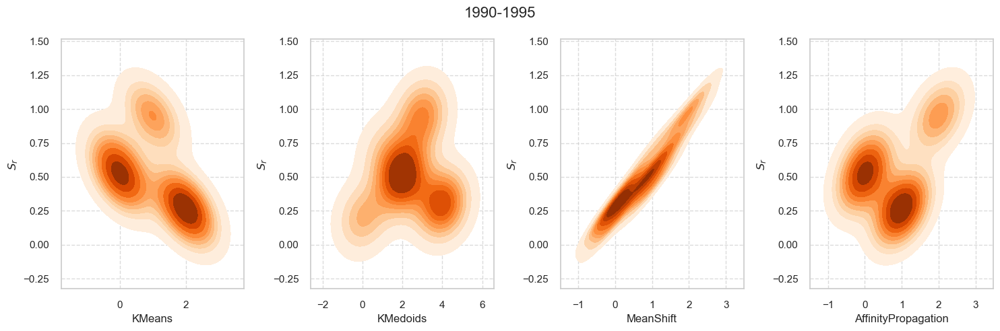

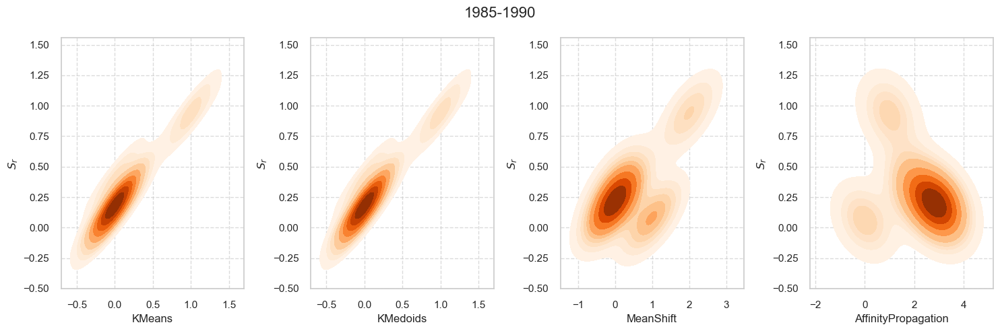

In [200]:
# KDE plots para Sr
density_plot_clusters(col='scaled_Sr', y_label=r'$S_{r}$', col_label='Sr')

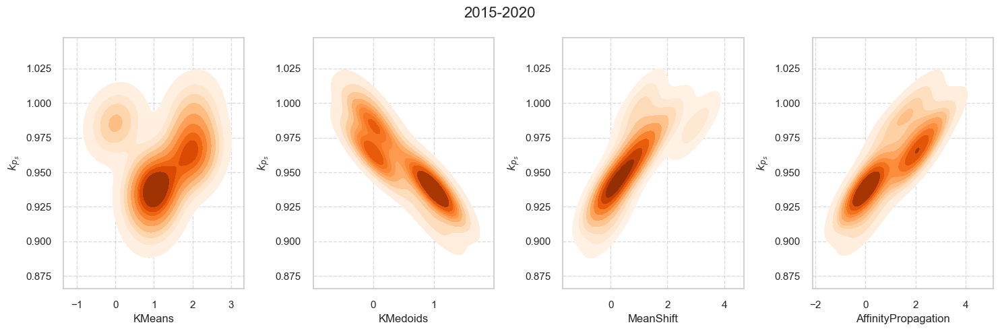

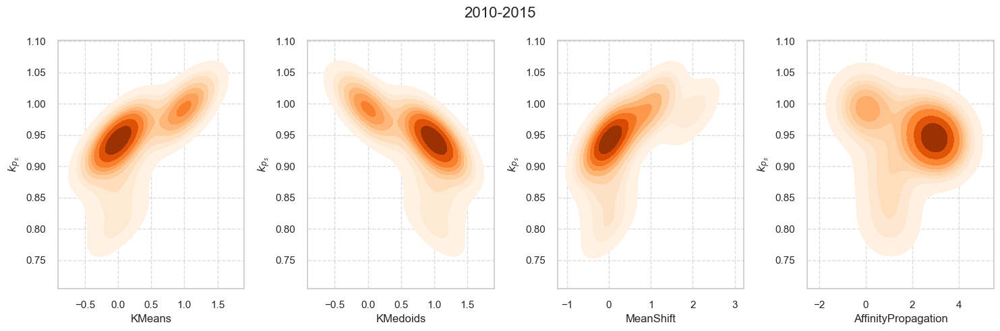

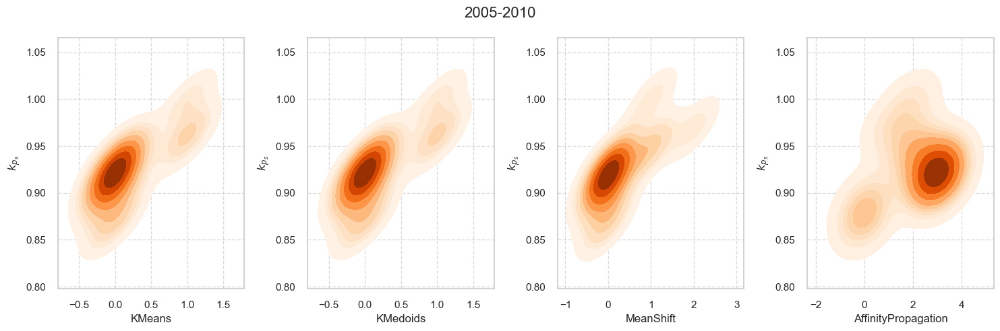

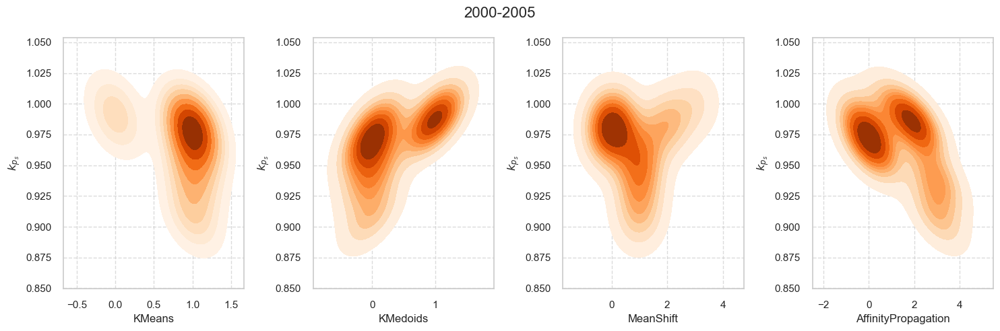

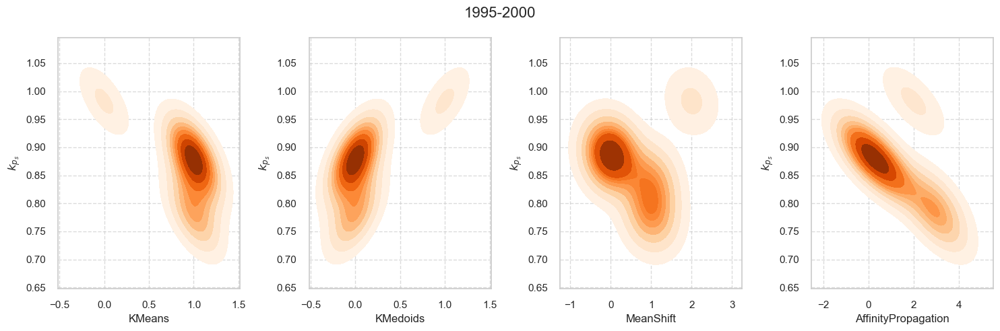

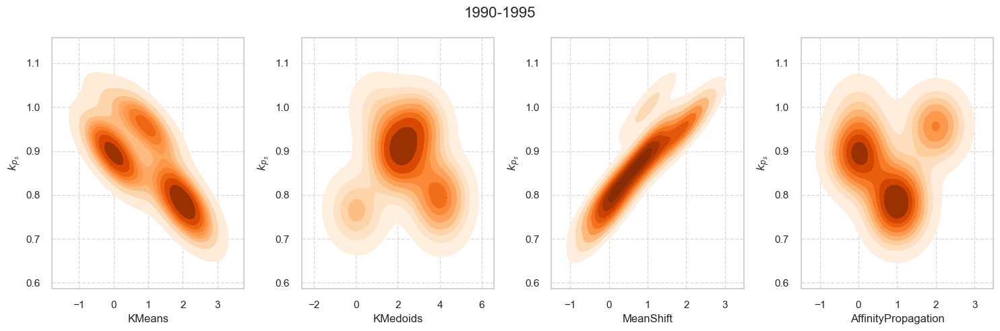

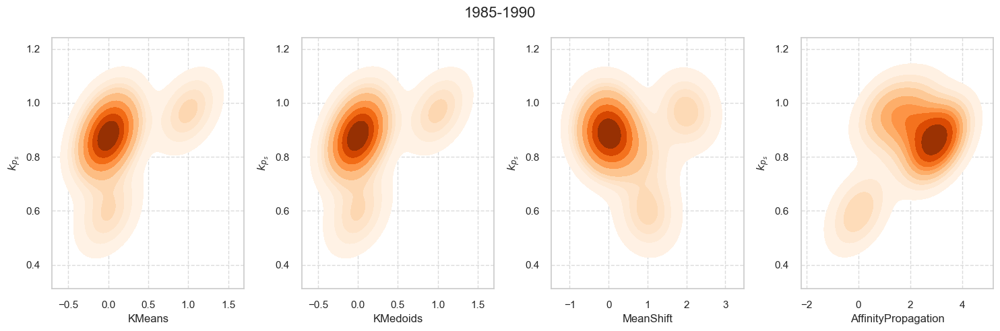

In [201]:
# KDE plots para Kps
density_plot_clusters(col='scaled_kps', y_label=r'$k_{p_s}$', col_label='Kps')

##### Métricas de avaliação

In [202]:
def find_metric_index(transposed_df, metric_prefix, operation=None):
    
    metric_filter = transposed_df['Metric'].str.startswith(metric_prefix)
    metric_index = getattr(transposed_df[metric_filter].set_index('Metric'), f'idx{operation}')().reset_index()
    
    return metric_index.rename(columns={'index': 'Interval', 0: 'Metric'})

In [203]:
metrics_df = pd.DataFrame({
    
        'Silhouette (KMeans)': km_results['silhouette'],
        'Silhouette (KMedoids)': kmd_results['silhouette'],
        'Silhouette (MeanShift)': ms_results['silhouette'], 
        'Silhouette (AffinityPropagation)': ap_results['silhouette'],
        'Calinski-Harabasz (KMeans)': km_results['calinski_harabasz'],
        'Calinski-Harabasz (KMedoids)': kmd_results['calinski_harabasz'],
        'Calinski-Harabasz (MeanShift)': ms_results['calinski_harabasz'],
        'Calinski-Harabasz (AffinityPropagation)': ap_results['calinski_harabasz'],
        'Davies-Bouldin (KMeans)': km_results['davies_bouldin'],
        'Davies-Bouldin (KMedoids)': kmd_results['davies_bouldin'],
        'Davies-Bouldin (MeanShift)': ms_results['davies_bouldin'],
        'Davies-Bouldin (AffinityPropagation)': ap_results['davies_bouldin']
    
        })

# Exibe o DataFrame
metrics_df.iloc[::-1].round(4)

,Silhouette (KMeans),Silhouette (KMedoids),Silhouette (MeanShift),Silhouette (AffinityPropagation),Calinski-Harabasz (KMeans),Calinski-Harabasz (KMedoids),Calinski-Harabasz (MeanShift),Calinski-Harabasz (AffinityPropagation),Davies-Bouldin (KMeans),Davies-Bouldin (KMedoids),Davies-Bouldin (MeanShift),Davies-Bouldin (AffinityPropagation)
1985-1990,0.7531,0.7531,0.5223,0.5355,38.1429,38.1429,46.2710,74.3369,0.2552,0.2552,0.4908,0.4720
1990-1995,0.6502,0.5705,0.6502,0.6502,71.1431,94.2237,71.1431,71.1431,0.3842,0.3106,0.3842,0.3842
1995-2000,0.7872,0.7872,0.5782,0.4641,59.2523,59.2523,143.4328,160.8023,0.1088,0.1088,0.3044,0.4167
2000-2005,0.6170,0.4976,0.4264,0.4501,22.2165,19.0425,42.1917,45.5233,0.5205,0.6921,0.4617,0.4331
2005-2010,0.6766,0.6766,0.6280,0.5932,30.3895,30.3895,67.5694,105.1694,0.5793,0.5793,0.3376,0.3271
2010-2015,0.6932,0.6932,0.6686,0.5377,38.1878,38.1878,53.2606,79.5430,0.4615,0.4615,0.2745,0.3442
2015-2020,0.6292,0.5083,0.5495,0.5495,62.2402,17.9533,59.2048,59.2048,0.4137,0.5729,0.2888,0.2888


In [204]:
# Usa o método transpose no DataFrame
transposed_df = metrics_df.transpose().reset_index().rename(columns={'index': 'Metric'})

# Exibe o DataFrame após usar o método transpose
transposed_df.round(4)

,Metric,2015-2020,2010-2015,2005-2010,2000-2005,1995-2000,1990-1995,1985-1990
0,Silhouette (KMeans),0.6292,0.6932,0.6766,0.6170,0.7872,0.6502,0.7531
1,Silhouette (KMedoids),0.5083,0.6932,0.6766,0.4976,0.7872,0.5705,0.7531
2,Silhouette (MeanShift),0.5495,0.6686,0.6280,0.4264,0.5782,0.6502,0.5223
3,Silhouette (AffinityPropagation),0.5495,0.5377,0.5932,0.4501,0.4641,0.6502,0.5355
4,Calinski-Harabasz (KMeans),62.2402,38.1878,30.3895,22.2165,59.2523,71.1431,38.1429
5,Calinski-Harabasz (KMedoids),17.9533,38.1878,30.3895,19.0425,59.2523,94.2237,38.1429
6,Calinski-Harabasz (MeanShift),59.2048,53.2606,67.5694,42.1917,143.4328,71.1431,46.2710
7,Calinski-Harabasz (AffinityPropagation),59.2048,79.5430,105.1694,45.5233,160.8023,71.1431,74.3369
8,Davies-Bouldin (KMeans),0.4137,0.4615,0.5793,0.5205,0.1088,0.3842,0.2552
9,Davies-Bouldin (KMedoids),0.5729,0.4615,0.5793,0.6921,0.1088,0.3106,0.2552


### Estatísticas descritivas dos coeficientes por ano

Nesta seção são feitas análises estatísticas descritivas dos coeficientes calculados ao ajustar as curvas da função sigmoide, para cada um dos 8 anos.

In [205]:
def descriptive_statistics_yearly(variable):
    
    years = [1985, 1990, 1995, 2000, 2005, 2010, 2015, 2020]
    describe_results = pd.DataFrame(index=years, columns=['mean', 'std', 'min', '25%', '50%', '75%', 'max'])

    for i, year in enumerate(years):
        describe_result = unified_coeffs_df_pivoted[f'{variable}_{year}'].describe()
        describe_results.loc[year] = describe_result[['mean', 'std', 'min', '25%', '50%', '75%', 'max']]

    return describe_results

# Lista de colunas
cols = unified_coeffs_df_pivoted.columns.tolist()

# Lista de colunas sem '_year'
splitted_cols = np.unique([col.split('_')[0] for col in cols])

# Dicionário para armazenar resultados
describe_results_dict = {}

# Estatísticas descritivas para cada variável
for col in splitted_cols:
    describe_results_dict[col] = descriptive_statistics_yearly(col)

# Variáveis para acessar os resultados
print(describe_results_dict.keys())

dict_keys(['D', 'R²', 'SSM', 'SSR', 'SST', 'alpha', 'c', 'f1', 'f2', 'kp', 'ks', 'r1', 'r2'])


In [206]:
# Calcula medidas de dispersão
for var, df in describe_results_dict.items():
    df['range'] = df['max'] - df['min']
    df['CV']    = df['std'] / df['mean']
    df['IQR']   = df['75%'] - df['25%']
    df['QCD']   = df['IQR'] / df['75%'] + df['25%']

In [207]:
# Define a coluna a ser exibida
cols = ['alpha', 'c', 'D', 'r1', 'r2', 'f1', 'f2', 'ks', 'kp']

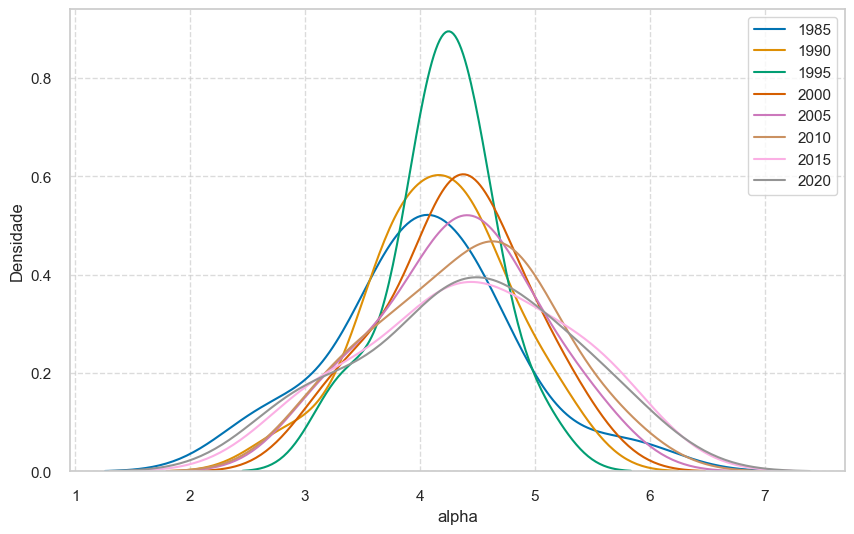

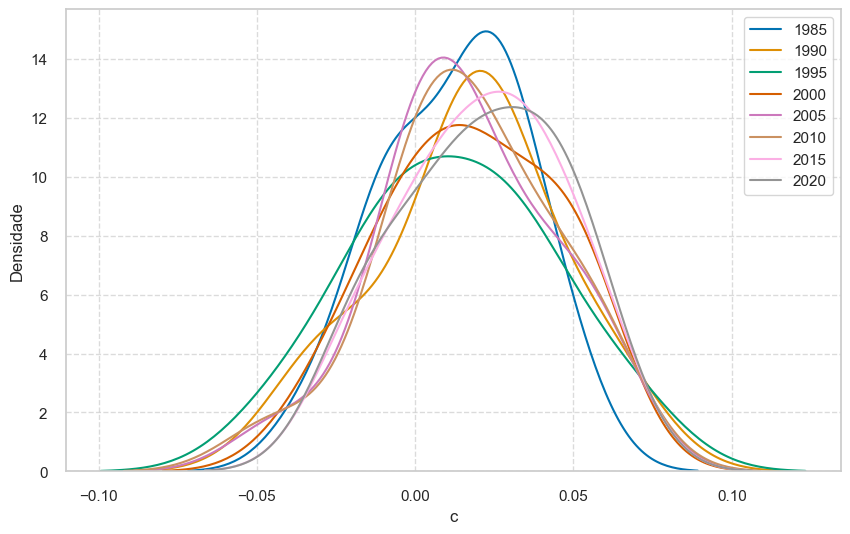

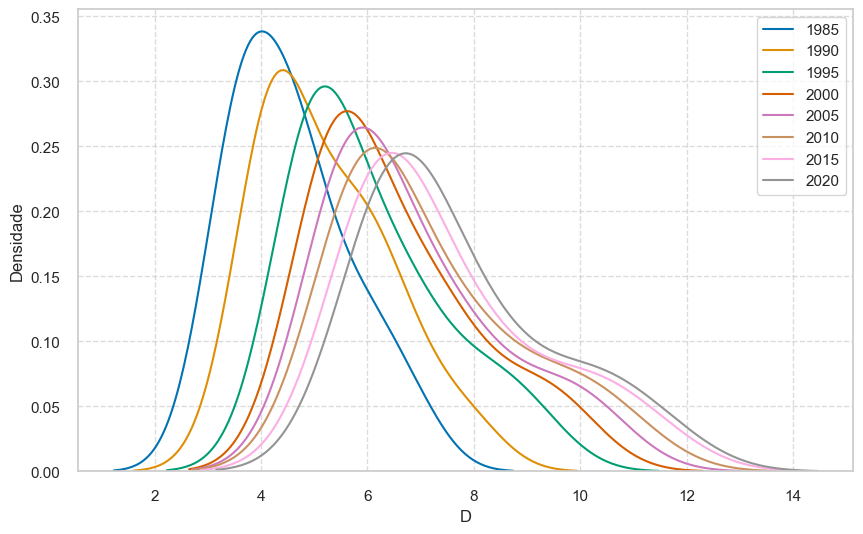

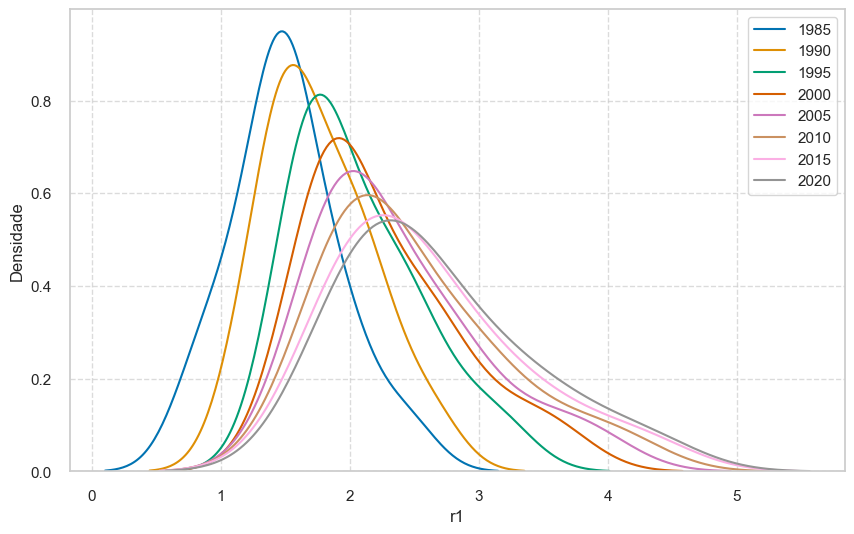

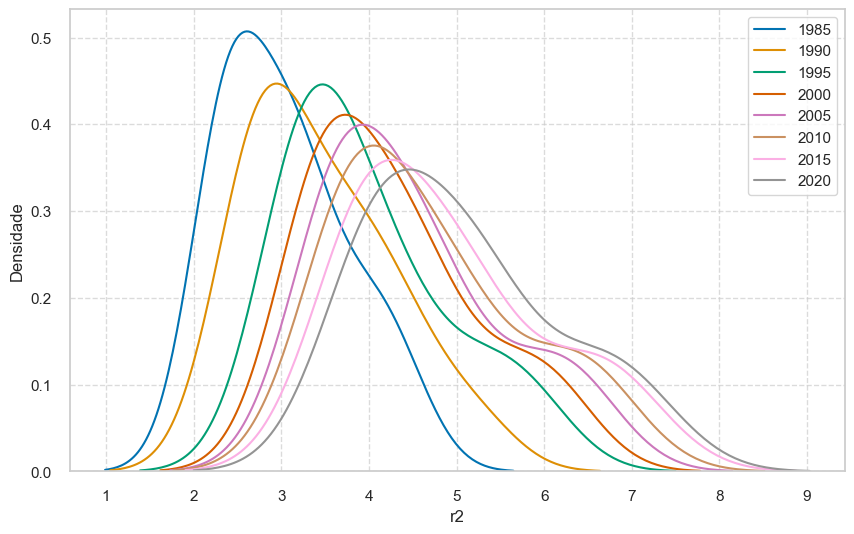

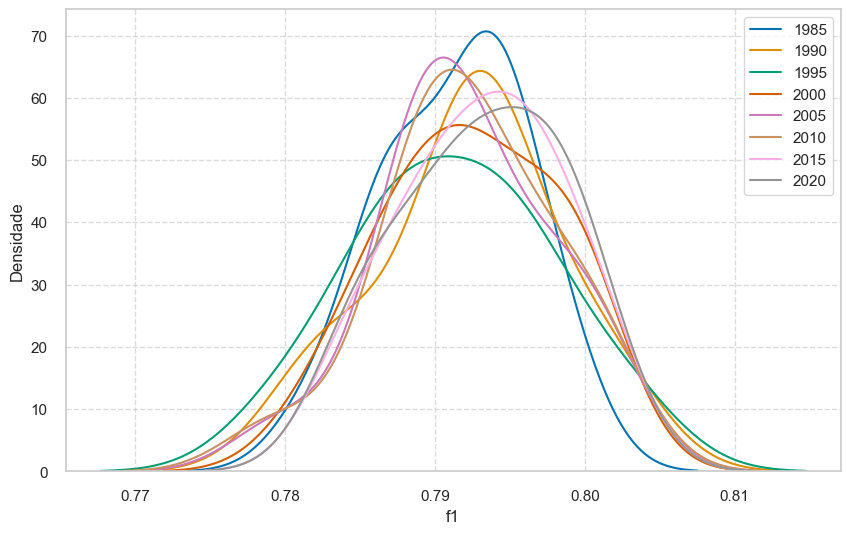

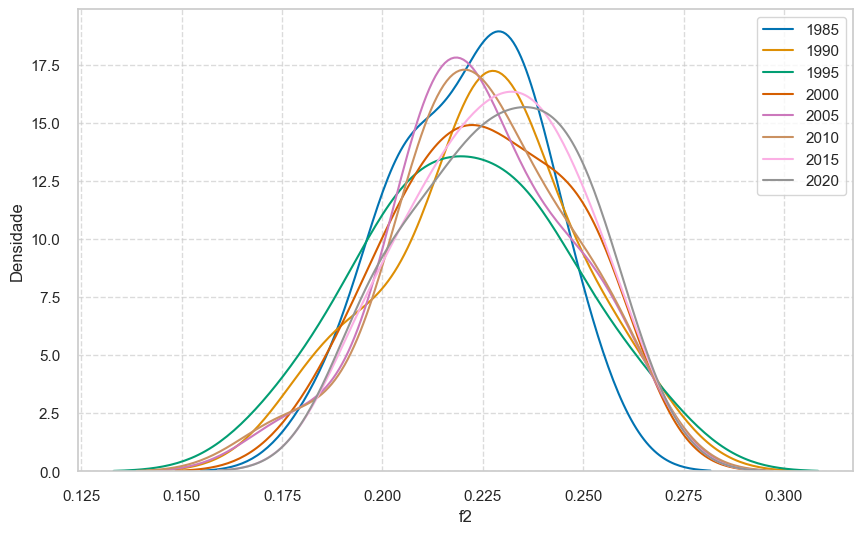

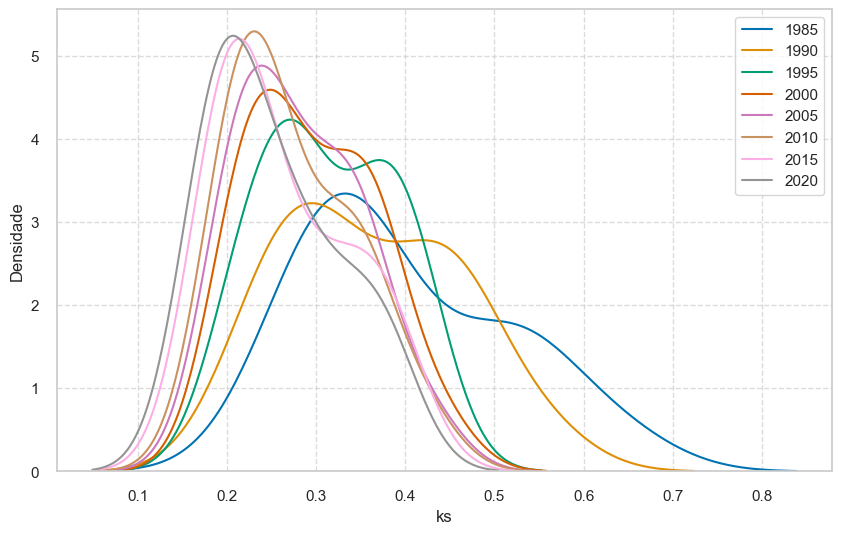

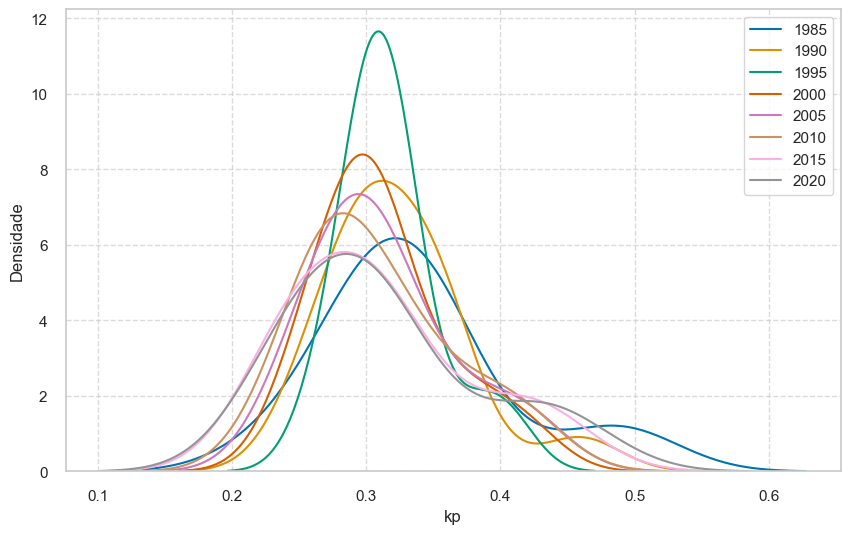

In [208]:
# KDE anual para cada coeficiente
def plot_kde(variable):

    # Define a paleta de cores
    sns.set_palette('colorblind')

    years = [1985, 1990, 1995, 2000, 2005, 2010, 2015, 2020]

    # Seleciona as colunas correspondentes à variável e aos anos especificados
    selected_columns = [f'{variable}_{year}' for year in years]
    selected_data = unified_coeffs_df_pivoted[selected_columns]

    # Cria um único gráfico e define o tamanho da figura
    plt.figure(figsize=(10, 6))

    # Adiciona um título comum ao gráfico
    # plt.title(f'{variable}')

    # Plota o KDE para todos os anos no mesmo gráfico
    for year in years:
        sns.kdeplot(selected_data[f'{variable}_{year}'], label=f'{year}', fill=False)

    # Define os rótulos dos eixos
    plt.xlabel(f'{variable}')
    plt.ylabel('Densidade')

    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Exibe a legenda para diferenciar os anos
    plt.legend(frameon=True)

    # Salva o gráfico para o coeficiente atual
    plt.savefig(f'outputs/{variable}_kde.jpg', dpi=300)

    # Exibe o gráfico
    plt.show()

# Aplica a função para plotar KDEs
for col in cols:
    plot_kde(col)
    print()

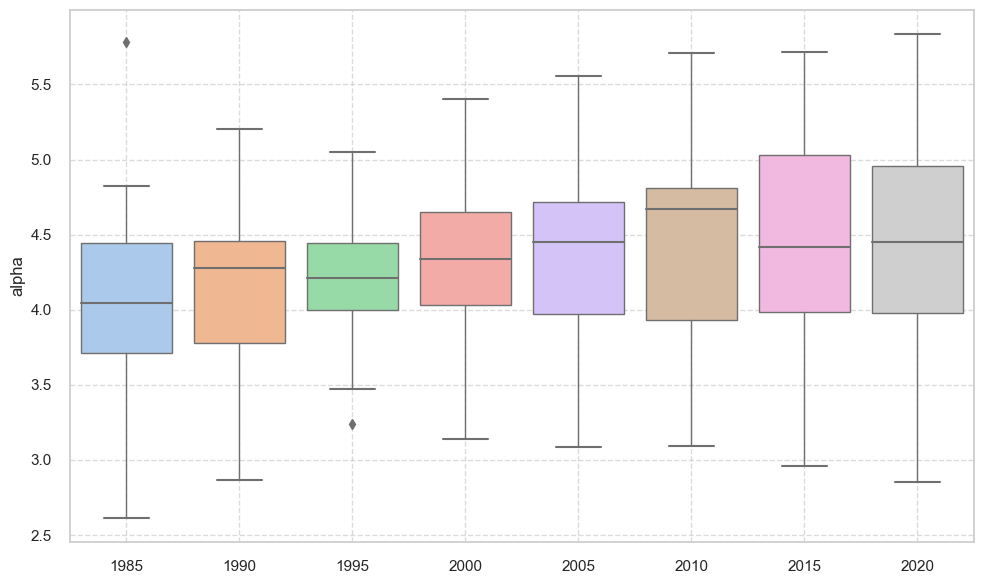

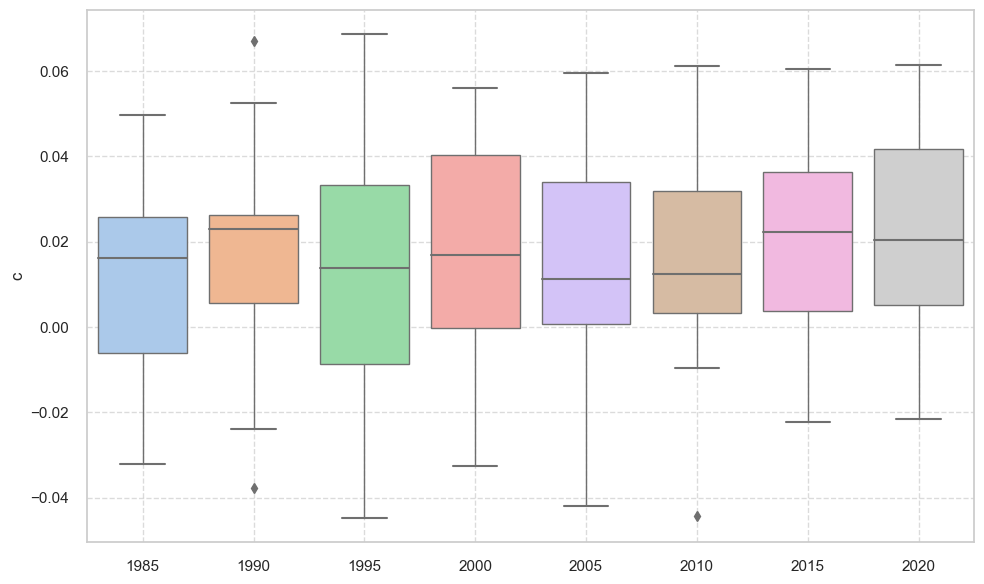

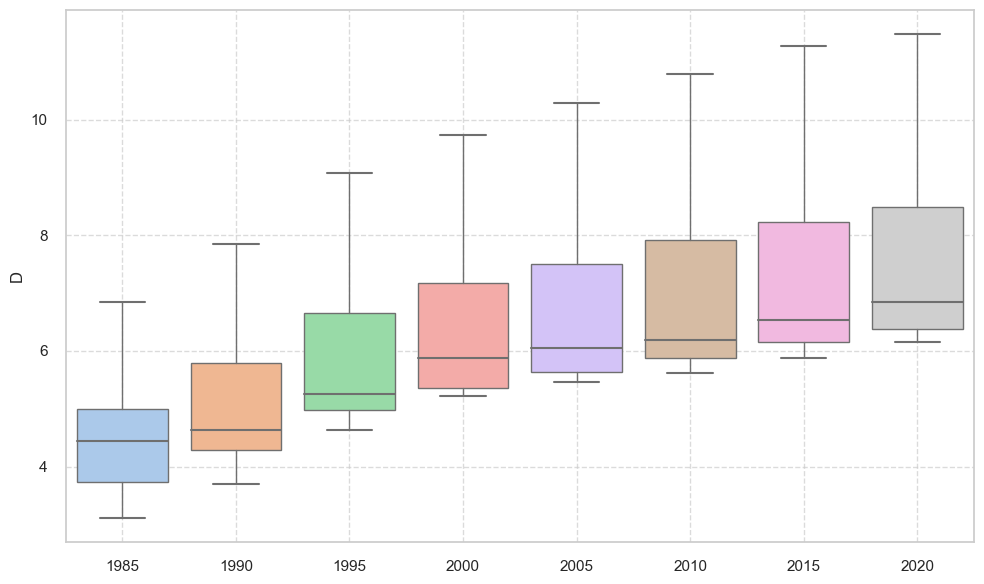

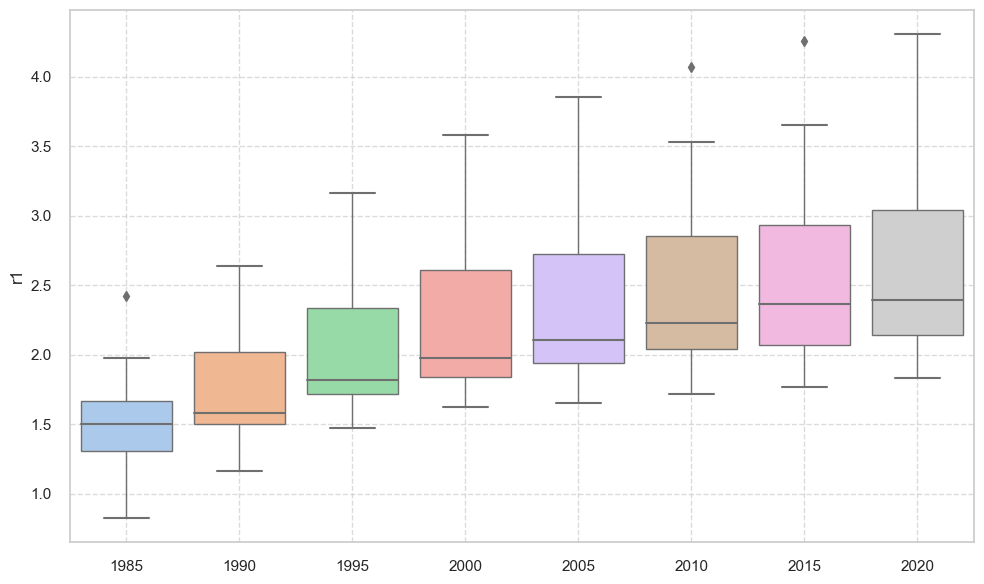

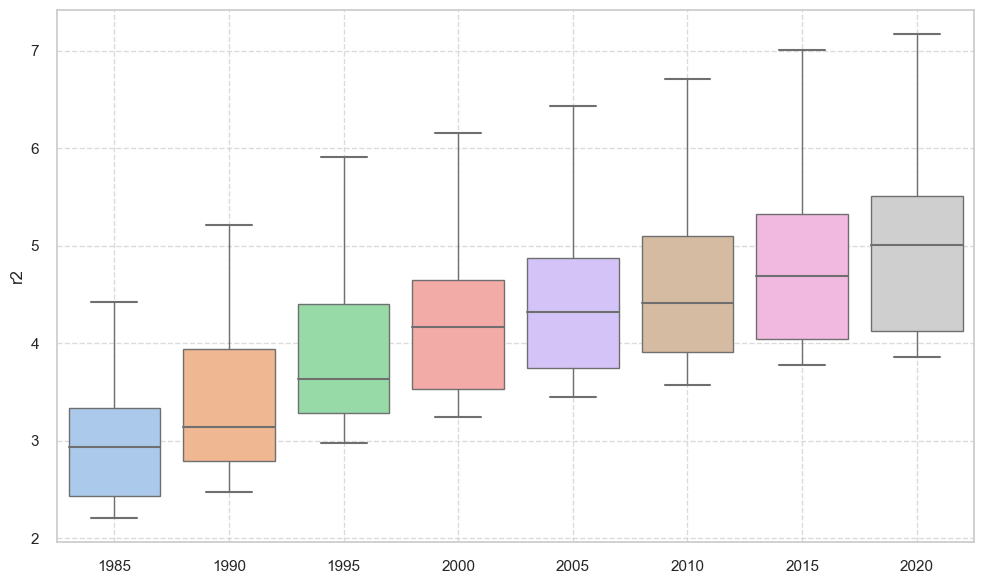

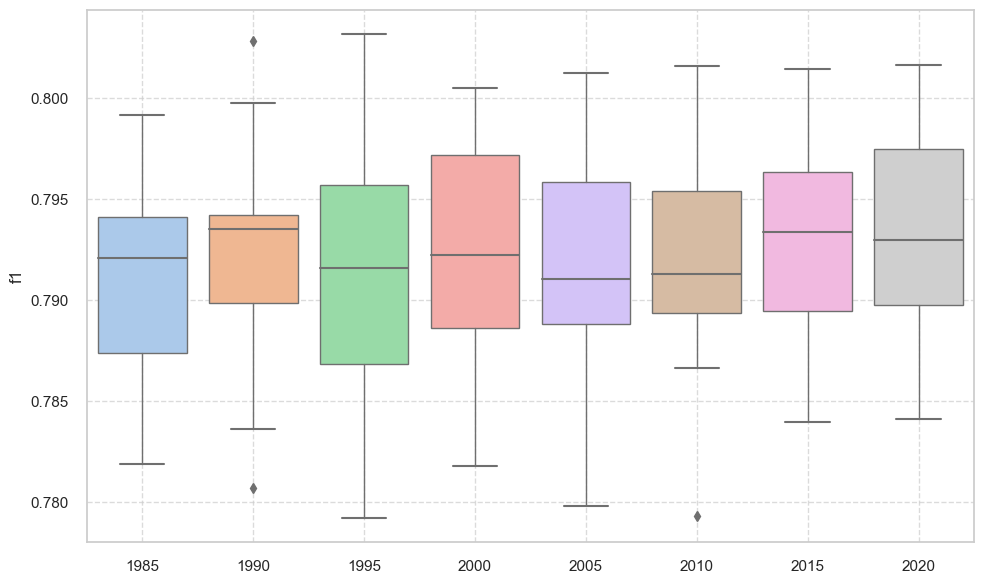

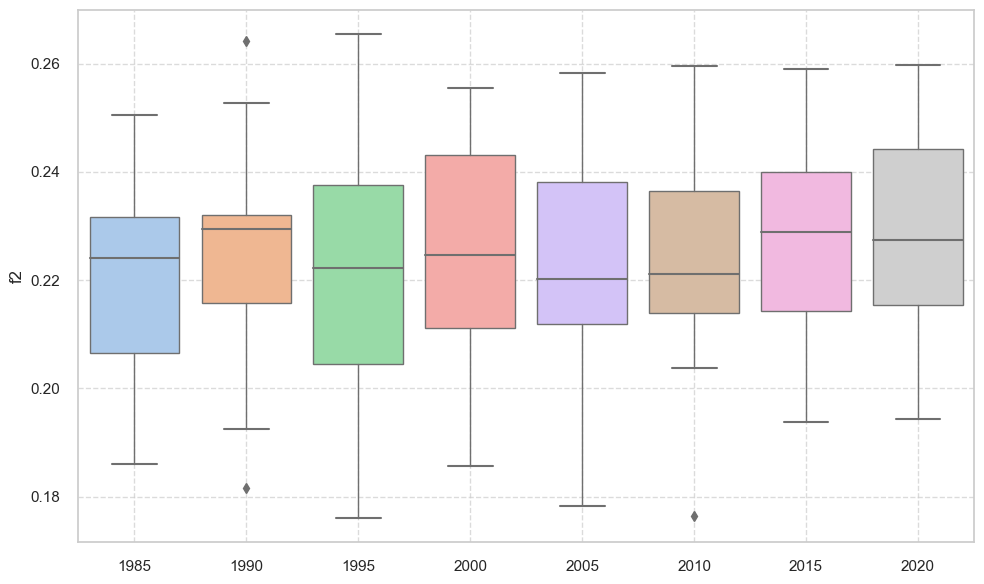

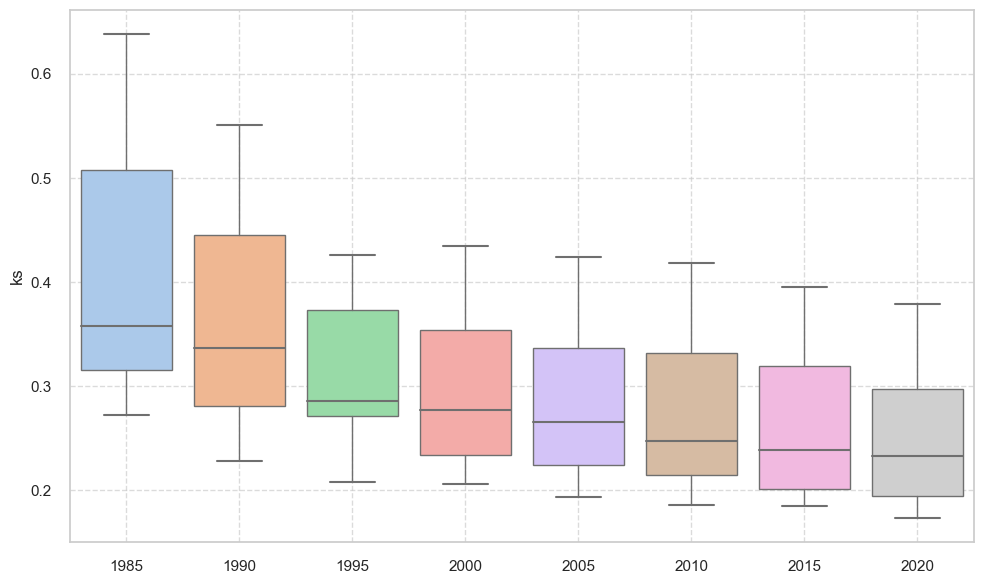

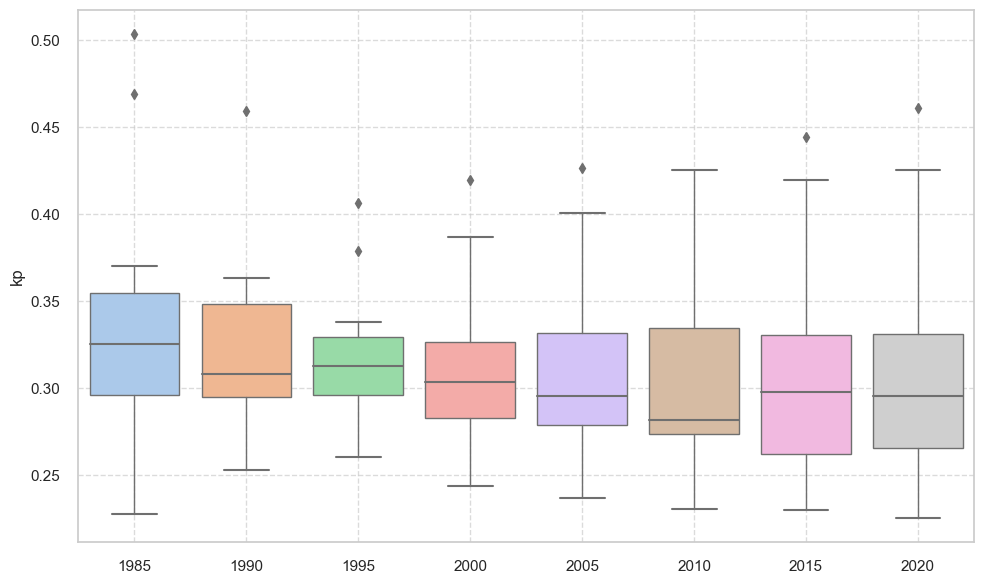

In [209]:
def yearly_boxplots(cols_to_plot):

    # Define a paleta de cores
    sns.set_palette('pastel')

    for col in cols_to_plot:

        # Cria um DataFrame com dados da variável para cada ano
        data = [smoothed_coeffs[year][col] for year in range(1985, 2021, 5)]
        years = [str(year) for year in range(1985, 2021, 5)]
        df = pd.DataFrame(data, index=years).T

        plt.figure(figsize=(10, 6))

        # Customiza propriedades da caixa e dos bigodes
        boxprops = dict(linewidth=1.0)
        whiskerprops = dict(linewidth=1.0)

        sns.boxplot(data=df, boxprops=boxprops, whiskerprops=whiskerprops)

        plt.title('')
        plt.xlabel('')
        plt.ylabel(f'{col}')

        plt.grid(axis='x', linestyle='--', alpha=0.7)
        plt.grid(axis='y', linestyle='--', alpha=0.7)

        plt.tight_layout()
        
        # Salva o gráfico para o coeficiente atual
        plt.savefig(f'outputs/{col}_boxplots.jpg', dpi=300)
        
        plt.show()

# Aplica a função com a lista de colunas a serem plotadas
yearly_boxplots(cols_to_plot=cols)

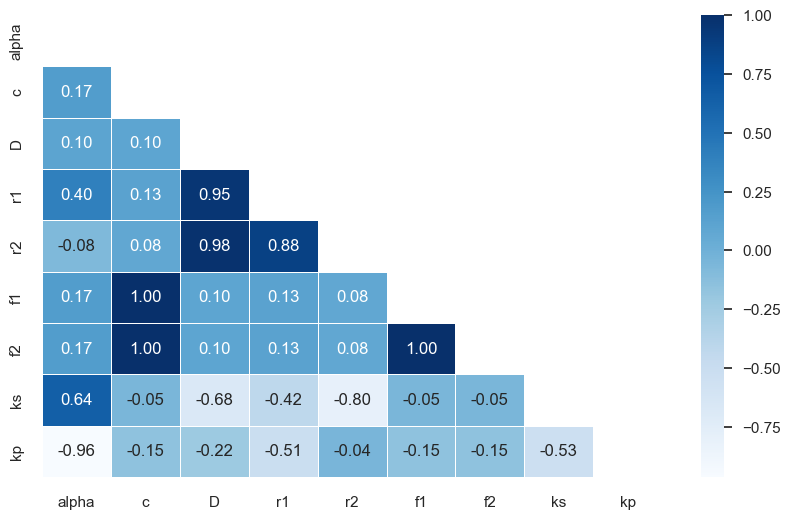

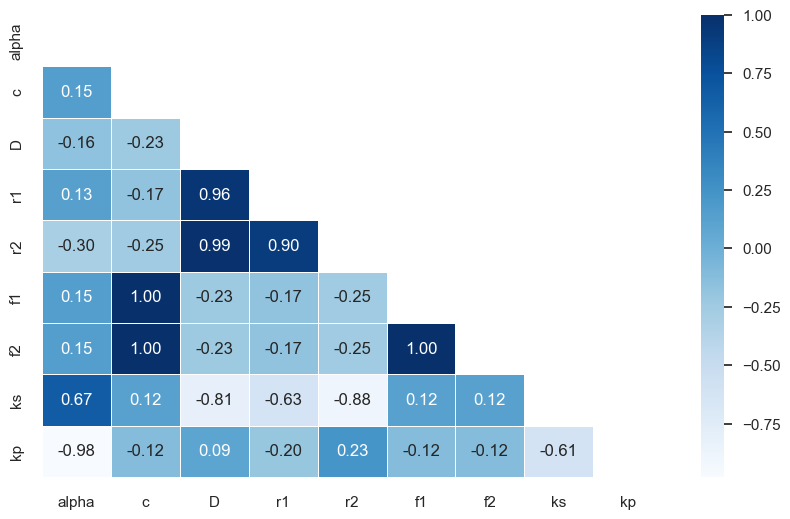

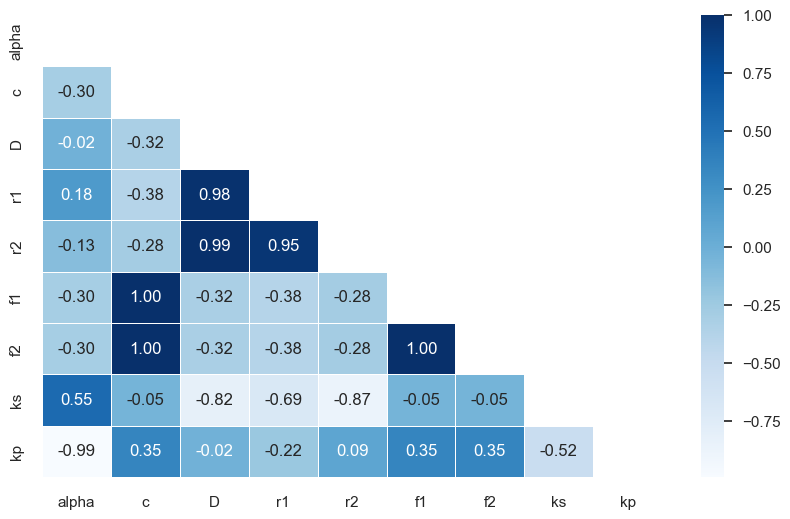

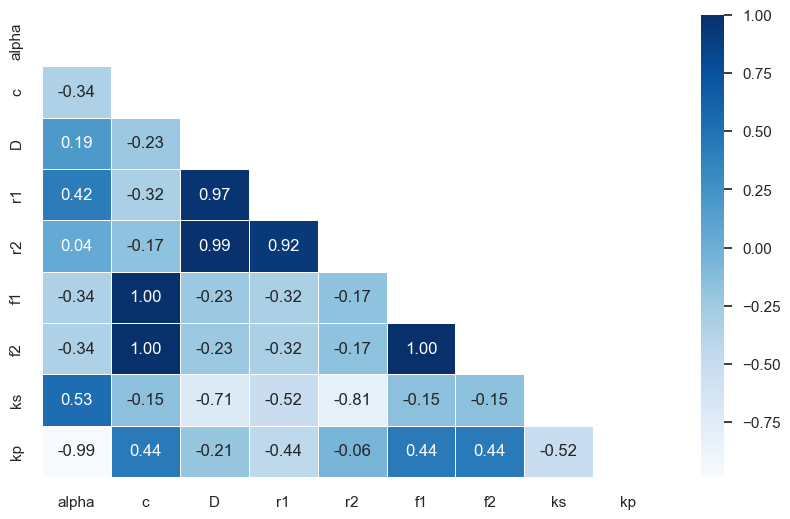

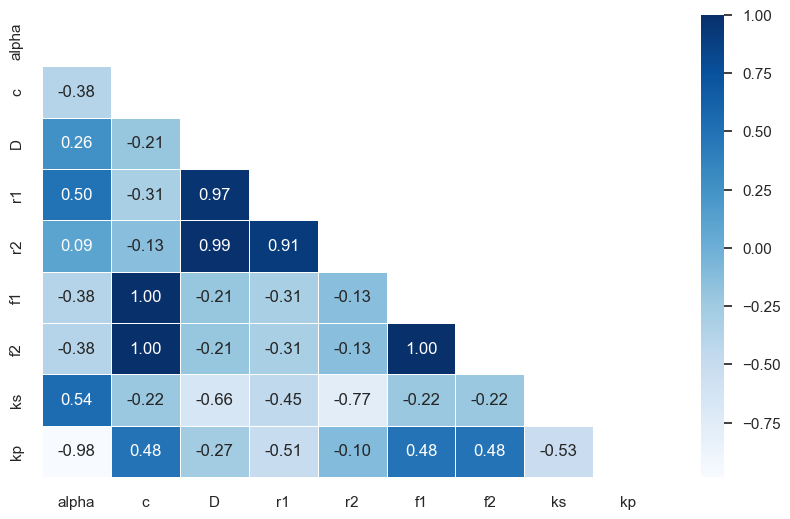

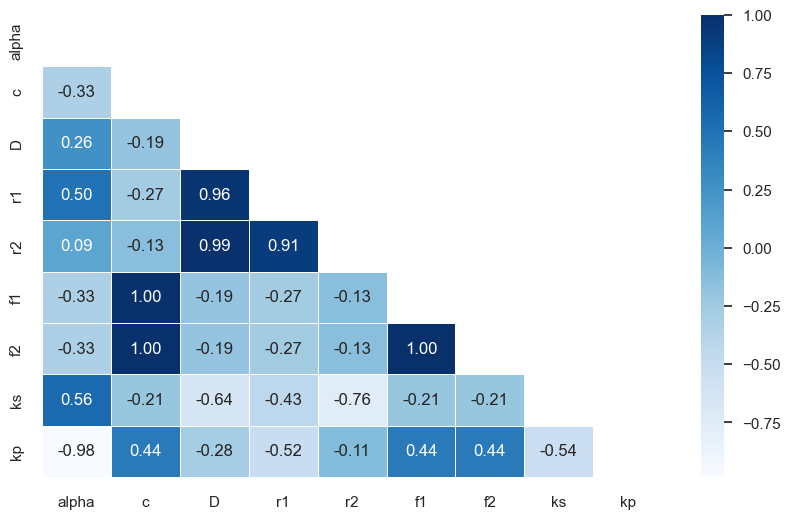

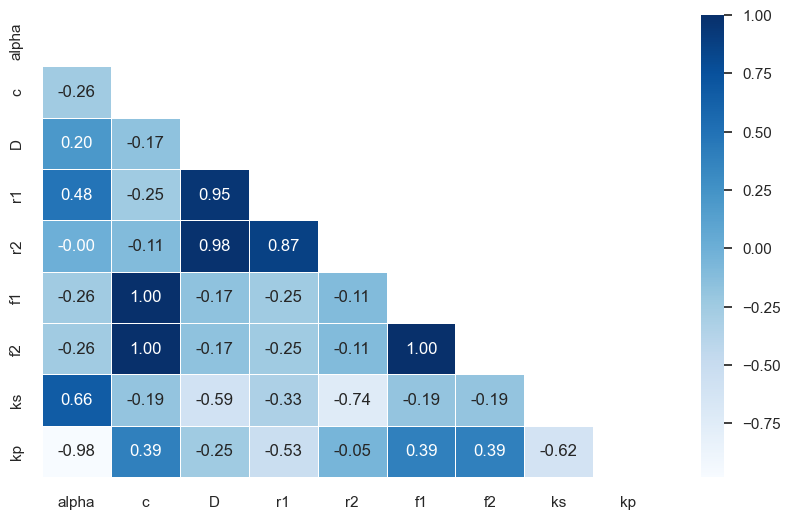

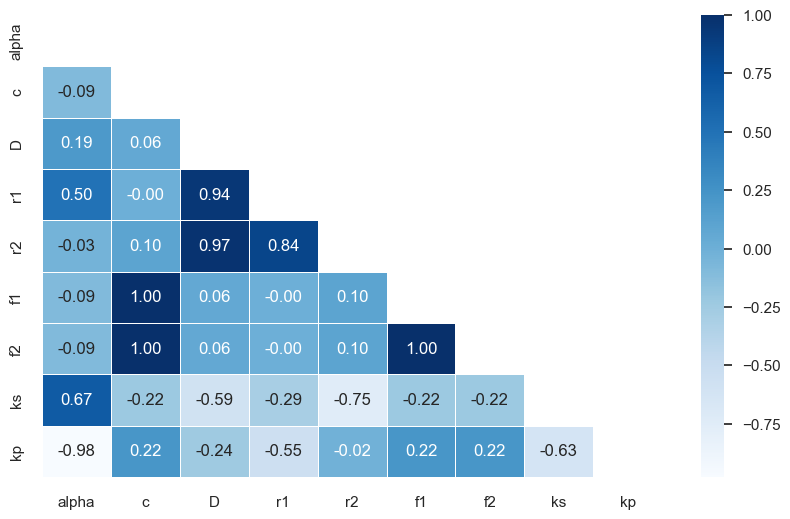

In [210]:
# Salva a matriz de correlação de cada ano como imagens sem espelho
for year, df in smoothed_coeffs.items():

    # Verifica se o DataFrame não está vazio
    if not df[cols].empty:

        # Calcula a matriz de correlação
        corr = df[cols].corr()

        # Remove o triângulo superior (espelho) da matriz de correlação
        mask = np.triu(np.ones_like(corr, dtype=bool))
        corr_no_mirror = corr.mask(mask)

        # Exibe a matriz de correlação com heatmap do Seaborn
        plt.figure(figsize=(10, 6))
        sns.heatmap(corr_no_mirror, annot=True, cmap='Blues', fmt='.2f', linewidths=.5)
        plt.title('')
        plt.grid(False)

        # Salva a matriz de correlação
        plt.savefig(f'outputs/{year}_correlation_matrix_no_mirror.jpg')

        # Exibe e fecha gráficos
        plt.show()
        plt.close()
    else:
        print(f'Warning: Empty DataFrame for {year}. Skipping.')